### Necessary imports

In [1]:
##necessary imports
import pandas as pd
import os
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import math
from sklearn.preprocessing import MinMaxScaler, StandardScaler
import xgboost as xgb
from tqdm import tqdm
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn import metrics
import random
from scipy.spatial import cKDTree
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score, balanced_accuracy_score

### Dataset description  

The dataset consists of cell identity metadata and measurements of cell shape, position and movement.  

**Column descriptions:** 

'Unnamed: 0' -- index column  
'Track ID_x' -- tracklet ID from automatic result dataframe -- DON'T USE THIS! It's used for tracking accuracy calculations  
'Track ID_y' -- USE THIS! Track ID_y -- Tracklet ID as string  
'Spot frame' -- frame number  
't' -- time in frames (same as 'Spot frame', but I'm including both because I have code using both columns...)  
't_hours' -- experiment actual time in hours  
'POSITION_X' -- spot centroid coordinates in µm  
'POSITION_Y' -- spot centroid coordinates in µm  
'POSITION_Z' -- spot centroid coordinates in µm  
'X_orig' -- spot centroid coordinates in pixels  
'Y_orig' -- spot centroid coordinates in pixels  
'Z_orig' -- spot centroid coordinates in pixels  
'TrackMate Track ID' -- track ID from automatic result dataframe -- DON'T USE THIS!  
'Generation ID' -- generation 0 means 0 divisions in cell lineage, generation 1 is after 1 division in lineage, etc.  
'Tracklet Number ID' -- number of tracklet in track lineage  
'Track Duration' -- Track duration in frames  
'nuc_label' -- nucleus label integer value  
'Spot track ID relabelled' -- Track ID for whole lineage, tracks consist of multiple tracklets, and new tracklets are formed when a cell divides  
'Track ID numeric' -- Tracklet ID converted to numeric value  
'cell_type' -- cell type according to last timepoint (annotated manually) however, if tracking is automated, this can contain errors (see 'annotation' column!)  
'annotation' -- 'manual' means track has been annotated completely for as long as the cell can be followed, 'automatic' means the spot has been tracked by TrackMate, and thus cell lineage can contain errors
'Local_Cell_Density' -- amount of cells within a 70 px radius of cell centroid 
'Displacement' -- object displacement (calculated from previous spot in tracklet)  
'Speed' -- object displacement in dT (calculated from previous spot in tracklet)  
'Motion_Angle_Z' -- angle of motion (calculated from previous spot in tracklet)  
'Motion_Angle_Y' -- angle of motion (calculated from previous spot in tracklet)  
'Motion_Angle_X' -- angle of motion (calculated from previous spot in tracklet)  
'Acceleration' -- d(speed) in dT (calculated from previous spot in tracklet)
'DISPLACEMENT_Z' -- object displacement in z (calculated from previous spot in tracklet)
'DISPLACEMENT_Z_ABS', absolute of object displacement in z (calculated from previous spot in tracklet)
'DISPLACEMENT_Z_SUMMED' summed object displacement in z (calculated for a 0.5h window centered around the spot),
'Edge_xy_angle' -- object instantaneous movement angle in XY,
'Directional_Change' -- change in object movement xy angle from previuous movement angle,
'Directional_Change_Abs' -- absolute of above change,
'Displacement_summed' -- summed object displacement in XYZ (calculated for a 0.5h window centered around the spot),
'Directional_Change_Summed' summed object XY direcitonal change (calculated for a 0.5h window centered around the spot),
'angle_difference' -- degree difference between cell's movement XY angle and radial XY angle (calculated from previous spot in tracklet)
'angle_difference_summed' -- summed degree difference between cell's movement XY angle and radial XY angle (calculate for a 0.5h window centered around the spot)
'Distance_Cell_mask' -- distance (in pixels) to closest tissue edge  
'Radial_Angle_Z' -- cell centroid Z angle compared to tissue centroid Z  
'Radial_Angle_Y' -- cell centroid Y angle compared to tissue centroid Y  
'Radial_Angle_X' -- cell centroid X angle compared to tissue centroid X  
'MSD' -- mean square displacement of track until spot timepoint  
'nuc_Radius' -- radius of a fit sphere  
'nuc_Eccentricity_Comp_First' -- object 1st order eccentricity, i.e. length  
'nuc_Eccentricity_Comp_Second' -- object 2nd order eccentricity, i.e. width  
'nuc_Eccentricity_Comp_Third' -- object 3rd order eccentricity, i.e. height  
'nuc_Surface_Area' -- surface area of marching cubes algorithm calculated surface mesh  
'nuc_Cell_Axis_Z' -- angle between tissue Z axis and cell's 3rd order eigenvector  
'nuc_Cell_Axis_Y' -- angle between tissue Y axis and cell's 2nd order eigenvector  
'nuc_Cell_Axis_X' -- angle between tissue X axis and cell's 1st order eigenvector  
'mem_nuc_offset' -- distance between nucleus centroid and membrane object centroid
'mem_...' -- same shape features as nuclei, but calculated for associated membrane object  
'mem_2d_area' -- area of center slice of associated membrane object  
'mem_2d_perimeter' -- perimeter of center slice of associated membrane object  
'mem_2d_eccentricity' -- eccentricity of center slice of associated membrane object  
'mem_2d_solidity' -- solidity of center slice of associated membrane object  
'mem_2d_extent' -- extent of center slice of associated membrane object  
'mem_2d_axis_major_length' -- major axis length of center slice of associated membrane object  
'mem_2d_axis_minor_length' -- minor axis length of center slice of associated membrane object  
'mem_2d_feret_diameter_max' -- longest Feret's diameter of center slice of associated membrane object  
'Distance_Cell_mask' -- distance of the cell centroid to closest point of tissue border,
'POSITION_Z_norm' -- 0-1 normalized Z coordinate of cells within a 60 µm neighborhood,
'nucleus_shape_feature_distance' -- mean Euclidean feature distance of nucleus shape features of a cell to it's neighbors in a 60 µm radius,	
 'membrane_shape_feature_distance' -- mean Euclidean feature distance of membrane shape features of a cell to it's neighbors in a 60 µm radius,	
 'movement_feature_distance' -- mean Euclidean feature distance of movement features of a cell to it's neighbors in a 60 µm radius,	

### Data pre-processing

In [2]:
#Data normalization function
def normalize_dataframe(data_frame, columns_to_normalize):
    # Create a copy of the dataframe
    df_normalized = data_frame.copy()

    # Replace missing values with 0 in the selected columns
    #df_normalized[columns_to_normalize] = df_normalized[columns_to_normalize].fillna(0)

    # Normalize selected columns
    scaler = StandardScaler()
    scaled_values = scaler.fit_transform(df_normalized[columns_to_normalize].values)
    df_normalized[columns_to_normalize] = scaled_values

    return df_normalized

In [ ]:
full_df_merged = pd.read_csv('full_df_for_classification.csv')

In [4]:
columns_to_normalize = [
#'Local_Cell_Density', 
 'Speed',
 'Acceleration',
 'Motion_Angle_Z',
 'Motion_Angle_Y',
 'Motion_Angle_X',
 'DISPLACEMENT_Z',
 'DISPLACEMENT_Z_ABS',
 'DISPLACEMENT_Z_SUMMED',
 'Displacement',
 'Edge_xy_angle',
 'Directional_Change',
 'Directional_Change_Abs',
 'Displacement_summed',
 'Directional_Change_Summed',
 'nuc_Radius',
 'nuc_Surface_Area',
 'nuc_Eccentricity_Comp_First',
 'nuc_Eccentricity_Comp_Second',
 'nuc_Eccentricity_Comp_Third',
 'nuc_Cell_Axis_Z',
 'nuc_Cell_Axis_Y',
 'nuc_Cell_Axis_X',
 'mem_nuc_offset',
 'mem_Radius',
 'mem_Surface_Area',
 'mem_Eccentricity_Comp_First',
 'mem_Eccentricity_Comp_Second',
 'mem_Eccentricity_Comp_Third',
 'mem_Cell_Axis_Z',
 'mem_Cell_Axis_Y',
 'mem_Cell_Axis_X',
 'mem_2d_area',
 'mem_2d_perimeter',
 'mem_2d_eccentricity',
 'mem_2d_solidity',
 'mem_2d_extent',
 'mem_2d_axis_major_length',
 'mem_2d_axis_minor_length',
 'mem_2d_feret_diameter_max',
 'Distance_Cell_mask',
 'POSITION_Z_norm',
 'Radial_Angle_Z',
 'Radial_Angle_Y',
 'Radial_Angle_X',
 'angle_difference',
 'angle_difference_summed']

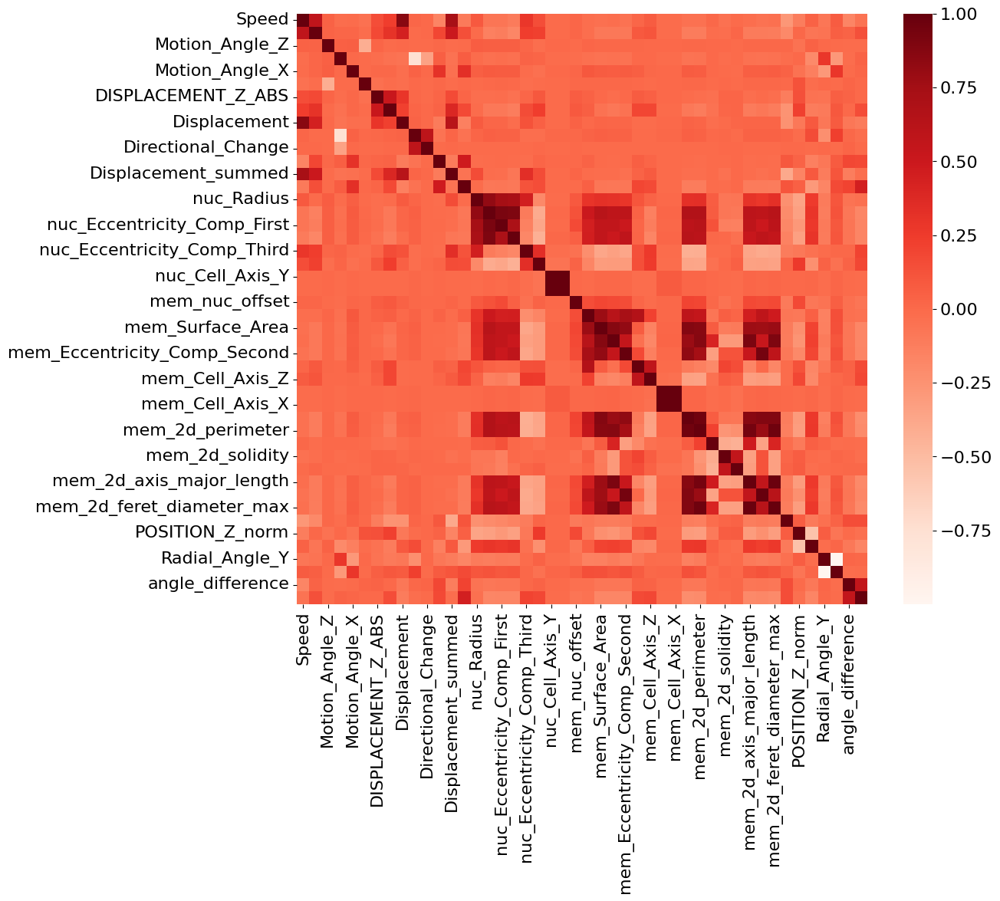

In [24]:
cor = full_df_merged[columns_to_normalize].corr()

plt.figure(figsize=(12, 10))
sns.heatmap(cor, annot=False, cmap=plt.cm.Reds)
plt.show()

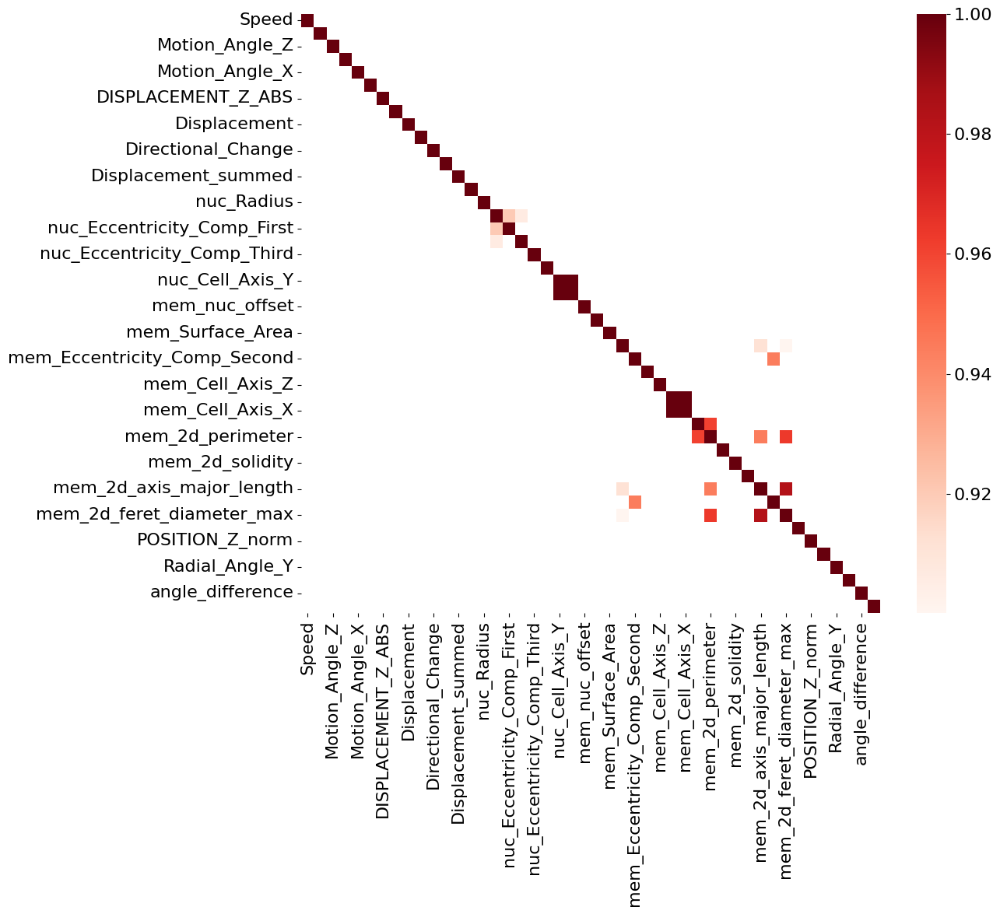

In [25]:
# Filter the correlation matrix
cor_over_09 = cor[cor > 0.9]

plt.figure(figsize=(12, 10))
sns.heatmap(cor_over_09, annot=False, cmap=plt.cm.Reds)
plt.show()

In [26]:
# Find column pairs with correlation greater than 0.9
correlation_threshold = 0.9
correlation_pairs = []
num_features = cor.shape[0]

for i in range(num_features):
    for j in range(i+1, num_features):
        if cor.iloc[i, j] > correlation_threshold:
            correlation_pairs.append((cor.index[i], cor.columns[j]))
            
print(correlation_pairs)

[('nuc_Surface_Area', 'nuc_Eccentricity_Comp_First'), ('nuc_Surface_Area', 'nuc_Eccentricity_Comp_Second'), ('nuc_Cell_Axis_Y', 'nuc_Cell_Axis_X'), ('mem_Eccentricity_Comp_First', 'mem_2d_axis_major_length'), ('mem_Eccentricity_Comp_First', 'mem_2d_feret_diameter_max'), ('mem_Eccentricity_Comp_Second', 'mem_2d_axis_minor_length'), ('mem_Cell_Axis_Y', 'mem_Cell_Axis_X'), ('mem_2d_area', 'mem_2d_perimeter'), ('mem_2d_perimeter', 'mem_2d_axis_major_length'), ('mem_2d_perimeter', 'mem_2d_feret_diameter_max'), ('mem_2d_axis_major_length', 'mem_2d_feret_diameter_max')]


In [3]:
#cross-correlating features are left commented 
feature_categories = {'membrane_shape' : ['mem_Radius',
 'mem_Eccentricity_Comp_First',
 'mem_Eccentricity_Comp_Second',
 'mem_Eccentricity_Comp_Third',
 'mem_Surface_Area',
 'mem_Cell_Axis_Z',
 'mem_2d_area',
 'mem_2d_eccentricity',
 'mem_2d_solidity',
 'mem_2d_extent',
 #'mem_2d_feret_diameter_max',
 #'mem_2d_axis_major_length',
 #'mem_2d_axis_minor_length',
 #'mem_2d_perimeter',
 #'mem_Cell_Axis_Y',
 #'mem_Cell_Axis_X',
 ],

'nucleus_shape' : ['nuc_Radius',
#'nuc_Surface_Area',
 'nuc_Eccentricity_Comp_First',
 'nuc_Eccentricity_Comp_Second',
 'nuc_Eccentricity_Comp_Third',
#'nuc_Cell_Axis_X',
#'nuc_Cell_Axis_Y',  
 'nuc_Cell_Axis_Z',
 'mem_nuc_offset'],

 'position' : [
 'POSITION_Z_norm',
 'Distance_Cell_mask',
 'Radial_Angle_Z',
  'Radial_Angle_Y',
 'Radial_Angle_X',],

'movement' : ['Speed',
 'Motion_Angle_Z',
 'Motion_Angle_Y',
 'Motion_Angle_X',
 'Acceleration',
 'DISPLACEMENT_Z_ABS',
 'DISPLACEMENT_Z_SUMMED',
 'Displacement', 
 'Directional_Change_Abs',
 'Displacement_summed',
 'Directional_Change_Summed',
 'angle_difference',
 'angle_difference_summed'],

'neighbor_feature_distance' : ['nucleus_shape_feature_distance',	
 'membrane_shape_feature_distance',
 'movement_feature_distance']
}

In [4]:
# Flatten the list of features preserving order
ordered_features = [f for features in feature_categories.values() for f in features]

In [5]:
full_df_merged

,Unnamed: 0,ID,Spot source ID,Track ID_x,Track ID_y,Spot frame,t,t_hours,POSITION_X,POSITION_Y,...,Directional_Change_Abs,Displacement_summed,Directional_Change_Summed,centroid_X,centroid_Y,centroid_to_cell_angle,angle_difference,angle_difference_summed,nucleus_shape_feature_distance,movement_feature_distance
0,0,0,NaN,19700.0,0,2,2.0,0.082778,643.314163,570.297245,...,0.000000,18.711484,887.691591,747.115503,698.514005,-128.992835,0.000000,1027.755377,NaN,459.341832
1,1,1,0.0,19700.0,0,3,3.0,0.124167,641.483249,570.000200,...,0.000000,18.711484,887.691591,746.065044,697.010039,-129.468550,41.316147,1027.755377,8.915079,448.553958
2,2,2,1.0,19700.0,0,4,4.0,0.165556,641.585796,569.708138,...,100.131698,18.711484,887.691591,746.521552,692.256699,-130.572749,59.919750,1027.755377,6.797153,432.247592
3,3,3,2.0,19700.0,0,5,5.0,0.206944,642.880597,568.702730,...,32.823781,18.711484,887.691591,742.912230,695.478427,-128.275002,90.445785,1027.755377,NaN,437.993936
4,4,4,3.0,19700.0,0,6,6.0,0.248333,643.062147,569.922801,...,119.365518,18.711484,887.691591,747.225939,698.370469,-129.040097,149.423602,1027.755377,NaN,437.923111
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
746920,746920,730660,727189.0,372900.0,1960314,355,355.0,21.776389,440.002484,516.220736,...,43.976637,12.946495,1904.972090,780.830608,763.539315,-144.033853,85.132029,436.498313,6.742633,606.118182
746921,746921,734083,730660.0,372900.0,1960314,356,356.0,21.859444,439.384684,516.591231,...,18.214681,11.371637,1616.205977,781.936286,763.705385,-144.193603,66.757599,342.637041,6.522341,489.597884
746922,746922,738485,734083.0,372900.0,1960314,357,357.0,21.942500,437.857002,515.841343,...,302.903912,11.371637,1616.205977,778.139382,763.416981,-143.961886,9.893228,342.637041,6.351237,499.170579
746923,746923,739646,738485.0,372900.0,1960314,358,358.0,22.025556,436.001605,516.435252,...,316.105324,11.371637,1616.205977,777.780631,761.513070,-144.357013,53.392777,342.637041,NaN,500.443855


In [7]:
# The features are z normalized for training
train_df_full = normalize_dataframe(full_df_merged, columns_to_normalize)

In [8]:
from scipy.spatial import cKDTree

# Parameters
xyz_radius = 60  # 3D search radius

for feature_category in ['membrane_shape', 'nucleus_shape', 'movement']:
    # Storage for density and average feature distance
    train_df_full[f'{feature_category}_feature_distance'] = np.nan  # Average Euclidean feature distance to neighbors

    # Group by time point (since neighbors must have the same T)
    for t, subset in train_df_full.groupby('t_hours'):
        print(f'Processing timepoint {t}')
        
        xyz_coords = subset[['POSITION_X', 'POSITION_Y', 'POSITION_Z']].values
        feature_coords = subset[feature_categories[feature_category]].values  # Feature vectors for the selected features

        # Convert feature NaNs to zero where possible, or use mask
        feature_mask = ~np.isnan(feature_coords).all(axis=1)  # Mask to exclude rows where ALL features are NaN

        # Filter valid feature rows
        valid_xyz = xyz_coords[feature_mask]
        valid_features = feature_coords[feature_mask]

        # Skip processing if no valid data remains
        if len(valid_xyz) == 0:
            continue

        # Build KDTree for fast 3D spatial neighbor search
        kd_tree_3d = cKDTree(valid_xyz)

        # Search for neighbors within the specified radius for each cell
        for i, (x, y, z) in enumerate(valid_xyz):
            # Get the indices of neighbors in the 3D radius (including itself)
            neighbor_indices = kd_tree_3d.query_ball_point([x, y, z], xyz_radius)
            
            # If no neighbors, skip
            if len(neighbor_indices) <= 1:  # Only itself
                continue

            # Get the feature vector of the current cell
            feature_vector = valid_features[i]
            
            # Get feature vectors of all neighbors
            neighbor_features = valid_features[neighbor_indices]

            # Mask out NaN values for valid neighbor comparisons
            valid_mask = ~np.isnan(neighbor_features).any(axis=1)
            valid_neighbors = neighbor_features[valid_mask]

            # If no valid neighbors remain after filtering NaNs, skip
            if len(valid_neighbors) == 0:
                continue

            # Calculate Euclidean distances between the current cell and all its valid neighbors
            euclidean_distances = np.linalg.norm(valid_neighbors - feature_vector, axis=1)

            # Compute mean while ignoring NaNs
            avg_distance = np.nanmean(euclidean_distances)

            # Store the result in the original dataframe
            original_index = subset.index[feature_mask][i]  # Map back to original index
            train_df_full.loc[original_index, f'{feature_category}_feature_distance'] = avg_distance


Processing timepoint 0.0


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 0.0413888888888888


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 0.0827777777777777


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 0.1241666666666666


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 0.1655555555555555


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 0.2069444444444444


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 0.2483333333333333


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 0.2897222222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 0.3311111111111111


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 0.3725


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 0.4138888888888888


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 0.4552777777777778


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 0.4966666666666666


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 0.5380555555555555


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 0.5794444444444444


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 0.6208333333333333


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 0.6622222222222223


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 0.7036111111111111


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 0.745


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 0.7863888888888889


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 0.8277777777777777


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 0.8691666666666666


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 0.9105555555555556


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 0.9519444444444446


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 0.9933333333333332


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 1.0347222222222223


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 1.076111111111111


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 1.1175


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 1.1588888888888889


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 1.2002777777777778


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 1.2416666666666667


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 1.2830555555555556


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 1.3244444444444443


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 1.3658333333333332


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 1.4072222222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 1.448611111111111


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 1.49


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 1.531388888888889


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 1.5727777777777778


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 1.6141666666666667


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 1.6555555555555554


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 1.6969444444444444


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 1.7383333333333333


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 1.779722222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 1.8211111111111111


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 1.8625


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 1.9038888888888887


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 1.9452777777777777


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 1.9866666666666664


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 2.028055555555556


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 2.0694444444444446


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 2.110833333333333


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 2.152222222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 2.193611111111111


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 2.235


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 2.276388888888889


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 2.3177777777777777


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 2.359166666666667


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 2.400555555555556


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 2.4419444444444443


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 2.4833333333333334


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 2.524722222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 2.5661111111111112


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 2.6075


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 2.648888888888889


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 2.6902777777777778


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 2.7316666666666665


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 2.773055555555556


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 2.8144444444444443


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 2.855833333333333


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 2.897222222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 2.938611111111112


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 2.98


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 3.0213888888888887


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 3.062777777777778


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 3.1041666666666665


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 3.145555555555556


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 3.1869444444444444


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 3.228333333333333


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 3.269722222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 3.311111111111111


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 3.3525


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 3.3938888888888887


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 3.435277777777778


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 3.4766666666666666


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 3.518055555555556


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 3.559444444444444


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 3.6008333333333336


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 3.6422222222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 3.683611111111112


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 3.725


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 3.766388888888889


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 3.8077777777777775


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 3.849166666666666


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 3.890555555555556


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 3.931944444444445


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 3.973333333333333


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 4.014722222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 4.056111111111112


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 4.0975


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 4.138888888888889


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 4.1802777777777775


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 4.221666666666666


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 4.263055555555556


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 4.304444444444444


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 4.345833333333333


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 4.387222222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 4.428611111111112


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 4.47


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 4.511388888888889


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 4.552777777777778


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 4.594166666666666


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 4.635555555555555


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 4.676944444444445


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 4.718333333333334


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 4.759722222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 4.801111111111111


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 4.8425


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 4.8838888888888885


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 4.925277777777778


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 4.980833333333333


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 5.036388888888889


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 5.091944444444445


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 5.1475


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 5.203055555555555


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 5.258611111111111


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 5.314166666666667


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 5.369722222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 5.425277777777778


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 5.480833333333333


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 5.536388888888889


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 5.591944444444445


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 5.6475


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 5.703055555555555


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 5.758611111111111


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 5.814166666666667


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 5.869722222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 5.925277777777778


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 5.980833333333333


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 6.036388888888889


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 6.091944444444445


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 6.1475


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 6.203055555555555


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 6.258611111111111


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 6.314166666666667


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 6.369722222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 6.425277777777778


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 6.480833333333333


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 6.536388888888889


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 6.591944444444445


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 6.6475


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 6.703055555555555


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 6.758611111111111


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 6.814166666666667


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 6.869722222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 6.925277777777778


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 6.980833333333333


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 7.036388888888889


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 7.091944444444445


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 7.1475


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 7.203055555555555


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 7.258611111111111


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 7.314166666666667


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 7.369722222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 7.425277777777778


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 7.480833333333333


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 7.536388888888889


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 7.591944444444445


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 7.6475


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 7.703055555555555


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 7.758611111111111


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 7.814166666666667


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 7.869722222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 7.925277777777778


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 7.980833333333333


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 8.036388888888888


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 8.091944444444444


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 8.1475


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 8.203055555555556


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 8.258611111111112


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 8.314166666666667


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 8.369722222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 8.425277777777778


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 8.480833333333333


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 8.536388888888888


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 8.591944444444444


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 8.6475


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 8.703055555555556


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 8.758611111111112


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 8.814166666666667


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 8.869722222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 8.925277777777778


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 8.980833333333333


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 9.036388888888888


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 9.091944444444444


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 9.1475


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 9.203055555555556


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 9.258611111111112


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 9.314166666666669


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 9.369722222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 9.425277777777778


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 9.480833333333331


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 9.536388888888888


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 9.591944444444444


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 9.6475


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 9.703055555555556


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 9.758611111111112


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 9.814166666666669


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 9.869722222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 9.925277777777778


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 9.980833333333331


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 10.036388888888888


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 10.091944444444444


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 10.1475


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 10.203055555555556


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 10.258611111111112


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 10.314166666666669


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 10.369722222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 10.425277777777778


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 10.480833333333331


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 10.563888888888888


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 10.646944444444443


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 10.73


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 10.813055555555556


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 10.89611111111111


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 10.979166666666666


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 11.062222222222225


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 11.145277777777778


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 11.228333333333332


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 11.311388888888889


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 11.394444444444444


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 11.4775


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 11.560555555555556


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 11.643611111111111


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 11.726666666666668


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 11.809722222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 11.892777777777775


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 11.975833333333334


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 12.05888888888889


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 12.141944444444444


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 12.225


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 12.308055555555557


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 12.391111111111112


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 12.474166666666669


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 12.557222222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 12.640277777777778


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 12.723333333333333


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 12.80638888888889


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 12.889444444444443


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 12.9725


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 13.055555555555555


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 13.13861111111111


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 13.221666666666666


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 13.304722222222225


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 13.387777777777778


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 13.470833333333331


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 13.553888888888888


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 13.636944444444444


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 13.72


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 13.803055555555556


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 13.886111111111113


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 13.969166666666666


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 14.052222222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 14.135277777777778


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 14.218333333333334


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 14.301388888888887


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 14.384444444444444


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 14.4675


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 14.550555555555556


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 14.633611111111112


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 14.716666666666669


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 14.799722222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 14.882777777777775


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 14.965833333333334


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 15.04888888888889


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 15.131944444444445


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 15.215


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 15.298055555555557


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 15.38111111111111


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 15.464166666666667


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 15.547222222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 15.630277777777778


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 15.713333333333331


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 15.796388888888888


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 15.879444444444443


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 15.9625


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 16.045555555555556


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 16.128611111111113


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 16.211666666666666


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 16.294722222222223


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 16.377777777777776


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 16.460833333333333


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 16.54388888888889


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 16.626944444444444


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 16.71


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 16.793055555555554


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 16.87611111111111


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 16.95916666666667


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 17.04222222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 17.12527777777778


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 17.208333333333332


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 17.29138888888889


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 17.374444444444446


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 17.4575


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 17.540555555555557


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 17.62361111111111


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 17.706666666666667


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 17.789722222222224


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 17.872777777777777


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 17.955833333333334


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 18.038888888888888


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 18.121944444444445


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 18.205


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 18.288055555555555


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 18.371111111111112


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 18.454166666666666


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 18.537222222222223


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 18.620277777777776


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 18.703333333333333


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 18.78638888888889


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 18.869444444444444


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 18.9525


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 19.03555555555556


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 19.11861111111111


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 19.201666666666668


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 19.28472222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 19.36777777777778


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 19.45083333333333


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 19.53388888888889


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 19.61694444444445


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 19.7


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 19.78305555555556


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 19.86611111111111


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 19.949166666666667


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 20.032222222222224


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 20.115277777777777


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 20.19833333333333


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 20.281388888888888


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 20.364444444444445


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 20.4475


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 20.530555555555555


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 20.613611111111112


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 20.696666666666665


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 20.779722222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 20.86277777777778


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 20.945833333333333


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 21.02888888888889


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 21.111944444444443


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 21.195


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 21.27805555555556


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 21.36111111111111


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 21.444166666666668


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 21.52722222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 21.61027777777777


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 21.69333333333333


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 21.77638888888889


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 21.85944444444445


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 21.9425


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 22.02555555555556


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 22.10861111111111


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 0.0


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 0.0413888888888888


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 0.0827777777777777


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 0.1241666666666666


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 0.1655555555555555


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 0.2069444444444444


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 0.2483333333333333


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 0.2897222222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 0.3311111111111111


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 0.3725


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 0.4138888888888888


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 0.4552777777777778


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 0.4966666666666666


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 0.5380555555555555


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 0.5794444444444444


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 0.6208333333333333


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 0.6622222222222223


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 0.7036111111111111


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 0.745


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 0.7863888888888889


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 0.8277777777777777


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 0.8691666666666666


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 0.9105555555555556


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 0.9519444444444446


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 0.9933333333333332


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 1.0347222222222223


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 1.076111111111111


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 1.1175


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 1.1588888888888889


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 1.2002777777777778


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 1.2416666666666667


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 1.2830555555555556


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 1.3244444444444443


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 1.3658333333333332


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 1.4072222222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 1.448611111111111


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 1.49


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 1.531388888888889


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 1.5727777777777778


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 1.6141666666666667


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 1.6555555555555554


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 1.6969444444444444


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 1.7383333333333333


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 1.779722222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 1.8211111111111111


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 1.8625


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 1.9038888888888887


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 1.9452777777777777


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 1.9866666666666664


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 2.028055555555556


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 2.0694444444444446


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 2.110833333333333


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 2.152222222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 2.193611111111111


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 2.235


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 2.276388888888889


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 2.3177777777777777


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 2.359166666666667


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 2.400555555555556


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 2.4419444444444443


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 2.4833333333333334


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 2.524722222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 2.5661111111111112


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 2.6075


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 2.648888888888889


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 2.6902777777777778


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 2.7316666666666665


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 2.773055555555556


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 2.8144444444444443


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 2.855833333333333


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 2.897222222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 2.938611111111112


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 2.98


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 3.0213888888888887


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 3.062777777777778


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 3.1041666666666665


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 3.145555555555556


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 3.1869444444444444


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 3.228333333333333


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 3.269722222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 3.311111111111111


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 3.3525


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 3.3938888888888887


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 3.435277777777778


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 3.4766666666666666


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 3.518055555555556


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 3.559444444444444


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 3.6008333333333336


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 3.6422222222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 3.683611111111112


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 3.725


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 3.766388888888889


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 3.8077777777777775


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 3.849166666666666


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 3.890555555555556


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 3.931944444444445


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 3.973333333333333


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 4.014722222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 4.056111111111112


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 4.0975


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 4.138888888888889


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 4.1802777777777775


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 4.221666666666666


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 4.263055555555556


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 4.304444444444444


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 4.345833333333333


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 4.387222222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 4.428611111111112


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 4.47


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 4.511388888888889


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 4.552777777777778


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 4.594166666666666


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 4.635555555555555


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 4.676944444444445


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 4.718333333333334


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 4.759722222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 4.801111111111111


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 4.8425


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 4.8838888888888885


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 4.925277777777778


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 4.980833333333333


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 5.036388888888889


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 5.091944444444445


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 5.1475


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 5.203055555555555


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 5.258611111111111


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 5.314166666666667


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 5.369722222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 5.425277777777778


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 5.480833333333333


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 5.536388888888889


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 5.591944444444445


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 5.6475


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 5.703055555555555


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 5.758611111111111


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 5.814166666666667


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 5.869722222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 5.925277777777778


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 5.980833333333333


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 6.036388888888889


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 6.091944444444445


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 6.1475


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 6.203055555555555


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 6.258611111111111


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 6.314166666666667


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 6.369722222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 6.425277777777778


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 6.480833333333333


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 6.536388888888889


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 6.591944444444445


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 6.6475


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 6.703055555555555


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 6.758611111111111


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 6.814166666666667


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 6.869722222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 6.925277777777778


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 6.980833333333333


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 7.036388888888889


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 7.091944444444445


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 7.1475


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 7.203055555555555


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 7.258611111111111


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 7.314166666666667


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 7.369722222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 7.425277777777778


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 7.480833333333333


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 7.536388888888889


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 7.591944444444445


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 7.6475


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 7.703055555555555


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 7.758611111111111


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 7.814166666666667


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 7.869722222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 7.925277777777778


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 7.980833333333333


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 8.036388888888888


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 8.091944444444444


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 8.1475


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 8.203055555555556


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 8.258611111111112


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 8.314166666666667


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 8.369722222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 8.425277777777778


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 8.480833333333333


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 8.536388888888888


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 8.591944444444444


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 8.6475


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 8.703055555555556


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 8.758611111111112


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 8.814166666666667


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 8.869722222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 8.925277777777778


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 8.980833333333333


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 9.036388888888888


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 9.091944444444444


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 9.1475


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 9.203055555555556


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 9.258611111111112


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 9.314166666666669


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 9.369722222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 9.425277777777778


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 9.480833333333331


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 9.536388888888888


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)
C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 9.591944444444444
Processing timepoint 9.6475


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 9.703055555555556


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 9.758611111111112


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 9.814166666666669


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 9.869722222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 9.925277777777778


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 9.980833333333331


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 10.036388888888888


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 10.091944444444444


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 10.1475


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 10.203055555555556


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 10.258611111111112


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 10.314166666666669


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 10.369722222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 10.425277777777778


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 10.480833333333331


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 10.563888888888888


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 10.646944444444443


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 10.73


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 10.813055555555556


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 10.89611111111111


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 10.979166666666666


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 11.062222222222225


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 11.145277777777778


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 11.228333333333332


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 11.311388888888889


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 11.394444444444444


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 11.4775


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 11.560555555555556


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 11.643611111111111


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 11.726666666666668


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 11.809722222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 11.892777777777775


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 11.975833333333334


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 12.05888888888889


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 12.141944444444444


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 12.225


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 12.308055555555557


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 12.391111111111112


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 12.474166666666669


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 12.557222222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 12.640277777777778


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 12.723333333333333


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 12.80638888888889


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 12.889444444444443


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 12.9725


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 13.055555555555555


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 13.13861111111111


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 13.221666666666666


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 13.304722222222225


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 13.387777777777778


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 13.470833333333331


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 13.553888888888888


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 13.636944444444444


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 13.72


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 13.803055555555556


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 13.886111111111113


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 13.969166666666666


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 14.052222222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 14.135277777777778


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 14.218333333333334


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 14.301388888888887


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 14.384444444444444


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 14.4675


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 14.550555555555556


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 14.633611111111112


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 14.716666666666669


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 14.799722222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 14.882777777777775


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 14.965833333333334


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 15.04888888888889


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 15.131944444444445


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 15.215


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 15.298055555555557


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 15.38111111111111


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 15.464166666666667


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 15.547222222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 15.630277777777778


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 15.713333333333331


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 15.796388888888888


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 15.879444444444443


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 15.9625


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 16.045555555555556


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 16.128611111111113


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 16.211666666666666


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 16.294722222222223


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 16.377777777777776


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 16.460833333333333


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 16.54388888888889


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 16.626944444444444


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 16.71


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 16.793055555555554


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 16.87611111111111


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 16.95916666666667


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 17.04222222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 17.12527777777778


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 17.208333333333332


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 17.29138888888889


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 17.374444444444446


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 17.4575


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 17.540555555555557


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 17.62361111111111


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 17.706666666666667


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 17.789722222222224


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 17.872777777777777


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 17.955833333333334


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 18.038888888888888


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 18.121944444444445


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 18.205


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 18.288055555555555


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 18.371111111111112


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 18.454166666666666


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 18.537222222222223


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 18.620277777777776


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 18.703333333333333


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 18.78638888888889


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 18.869444444444444


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 18.9525


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 19.03555555555556


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 19.11861111111111


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 19.201666666666668


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 19.28472222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 19.36777777777778


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 19.45083333333333


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 19.53388888888889


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 19.61694444444445


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 19.7


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 19.78305555555556


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 19.86611111111111


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 19.949166666666667


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 20.032222222222224


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 20.115277777777777


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 20.19833333333333


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 20.281388888888888


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 20.364444444444445


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 20.4475


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 20.530555555555555


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 20.613611111111112


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 20.696666666666665


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 20.779722222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 20.86277777777778


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 20.945833333333333


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 21.02888888888889


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 21.111944444444443


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 21.195


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 21.27805555555556


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 21.36111111111111


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 21.444166666666668


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 21.52722222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 21.61027777777777


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 21.69333333333333


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 21.77638888888889


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 21.85944444444445


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 21.9425


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 22.02555555555556


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 22.10861111111111


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 0.0


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 0.0413888888888888


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 0.0827777777777777


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 0.1241666666666666


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 0.1655555555555555


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 0.2069444444444444


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 0.2483333333333333


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 0.2897222222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 0.3311111111111111


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 0.3725


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 0.4138888888888888


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 0.4552777777777778


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 0.4966666666666666


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 0.5380555555555555


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 0.5794444444444444


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 0.6208333333333333


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 0.6622222222222223


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 0.7036111111111111


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 0.745


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 0.7863888888888889


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 0.8277777777777777


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 0.8691666666666666


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 0.9105555555555556


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 0.9519444444444446


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 0.9933333333333332


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 1.0347222222222223


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 1.076111111111111


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 1.1175


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 1.1588888888888889


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 1.2002777777777778


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 1.2416666666666667


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 1.2830555555555556


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 1.3244444444444443


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 1.3658333333333332


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 1.4072222222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 1.448611111111111


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 1.49


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 1.531388888888889


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 1.5727777777777778


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 1.6141666666666667


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 1.6555555555555554


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 1.6969444444444444


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 1.7383333333333333


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 1.779722222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 1.8211111111111111


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 1.8625


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 1.9038888888888887


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 1.9452777777777777


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 1.9866666666666664


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 2.028055555555556


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 2.0694444444444446


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 2.110833333333333


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 2.152222222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 2.193611111111111


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 2.235


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 2.276388888888889


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 2.3177777777777777


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 2.359166666666667


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 2.400555555555556


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 2.4419444444444443


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 2.4833333333333334


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 2.524722222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 2.5661111111111112


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 2.6075


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 2.648888888888889


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 2.6902777777777778


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 2.7316666666666665


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 2.773055555555556


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 2.8144444444444443


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 2.855833333333333


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 2.897222222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 2.938611111111112


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 2.98


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 3.0213888888888887


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 3.062777777777778


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 3.1041666666666665


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 3.145555555555556


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 3.1869444444444444


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 3.228333333333333


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 3.269722222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 3.311111111111111


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 3.3525


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 3.3938888888888887


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 3.435277777777778


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 3.4766666666666666


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 3.518055555555556


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 3.559444444444444


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 3.6008333333333336


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 3.6422222222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 3.683611111111112


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 3.725


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 3.766388888888889


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 3.8077777777777775


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 3.849166666666666


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 3.890555555555556


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 3.931944444444445


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 3.973333333333333


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 4.014722222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 4.056111111111112


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 4.0975


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 4.138888888888889


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 4.1802777777777775


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 4.221666666666666


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 4.263055555555556


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 4.304444444444444


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 4.345833333333333


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 4.387222222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 4.428611111111112


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 4.47


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 4.511388888888889


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 4.552777777777778


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 4.594166666666666


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 4.635555555555555


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 4.676944444444445


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 4.718333333333334


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 4.759722222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 4.801111111111111


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 4.8425


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 4.8838888888888885


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 4.925277777777778


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 4.980833333333333


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 5.036388888888889


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 5.091944444444445


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 5.1475


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 5.203055555555555


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 5.258611111111111


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 5.314166666666667


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 5.369722222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 5.425277777777778


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 5.480833333333333


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 5.536388888888889


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 5.591944444444445


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 5.6475


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 5.703055555555555


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 5.758611111111111


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 5.814166666666667


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 5.869722222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 5.925277777777778


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 5.980833333333333


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 6.036388888888889


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 6.091944444444445


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 6.1475


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 6.203055555555555


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 6.258611111111111


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 6.314166666666667


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 6.369722222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 6.425277777777778


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 6.480833333333333


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 6.536388888888889


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 6.591944444444445


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 6.6475


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 6.703055555555555


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 6.758611111111111


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 6.814166666666667


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 6.869722222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 6.925277777777778


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 6.980833333333333


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 7.036388888888889


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 7.091944444444445


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 7.1475


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 7.203055555555555


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 7.258611111111111


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 7.314166666666667


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 7.369722222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 7.425277777777778


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 7.480833333333333


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 7.536388888888889


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 7.591944444444445


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 7.6475


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 7.703055555555555


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 7.758611111111111


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 7.814166666666667


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 7.869722222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 7.925277777777778


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 7.980833333333333


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 8.036388888888888


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 8.091944444444444


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 8.1475


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 8.203055555555556


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 8.258611111111112


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 8.314166666666667


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 8.369722222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 8.425277777777778


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 8.480833333333333


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 8.536388888888888


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 8.591944444444444


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 8.6475


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 8.703055555555556


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 8.758611111111112


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 8.814166666666667


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 8.869722222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 8.925277777777778


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 8.980833333333333


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 9.036388888888888


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 9.091944444444444


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 9.1475


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 9.203055555555556


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 9.258611111111112


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 9.314166666666669


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 9.369722222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 9.425277777777778


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 9.480833333333331


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 9.536388888888888


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 9.591944444444444


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 9.6475


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 9.703055555555556


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 9.758611111111112


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 9.814166666666669


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 9.869722222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 9.925277777777778


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 9.980833333333331


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 10.036388888888888


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 10.091944444444444


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 10.1475


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 10.203055555555556


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 10.258611111111112


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 10.314166666666669


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 10.369722222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 10.425277777777778


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 10.480833333333331


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 10.563888888888888


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 10.646944444444443


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 10.73


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 10.813055555555556


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 10.89611111111111


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 10.979166666666666


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 11.062222222222225


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 11.145277777777778


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 11.228333333333332


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 11.311388888888889


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 11.394444444444444


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 11.4775


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 11.560555555555556


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 11.643611111111111


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 11.726666666666668


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 11.809722222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 11.892777777777775


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 11.975833333333334


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 12.05888888888889


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 12.141944444444444


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 12.225


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 12.308055555555557


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 12.391111111111112


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 12.474166666666669


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 12.557222222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 12.640277777777778


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 12.723333333333333


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 12.80638888888889


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 12.889444444444443


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 12.9725


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 13.055555555555555


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 13.13861111111111


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 13.221666666666666


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 13.304722222222225


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 13.387777777777778


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 13.470833333333331


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 13.553888888888888


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 13.636944444444444


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 13.72


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 13.803055555555556


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 13.886111111111113


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 13.969166666666666


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 14.052222222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 14.135277777777778


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 14.218333333333334


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 14.301388888888887


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 14.384444444444444


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 14.4675


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 14.550555555555556


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 14.633611111111112


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 14.716666666666669


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 14.799722222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 14.882777777777775


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 14.965833333333334


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 15.04888888888889


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 15.131944444444445


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 15.215


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 15.298055555555557


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 15.38111111111111


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 15.464166666666667


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 15.547222222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 15.630277777777778


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 15.713333333333331


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 15.796388888888888


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 15.879444444444443


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 15.9625


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 16.045555555555556


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 16.128611111111113


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 16.211666666666666


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 16.294722222222223


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 16.377777777777776


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 16.460833333333333


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 16.54388888888889


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 16.626944444444444


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 16.71


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 16.793055555555554


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 16.87611111111111


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 16.95916666666667


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 17.04222222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 17.12527777777778


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 17.208333333333332


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 17.29138888888889


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 17.374444444444446


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 17.4575


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 17.540555555555557


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 17.62361111111111


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 17.706666666666667


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 17.789722222222224


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 17.872777777777777


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 17.955833333333334


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 18.038888888888888


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 18.121944444444445


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 18.205


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 18.288055555555555


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 18.371111111111112


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 18.454166666666666


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 18.537222222222223


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 18.620277777777776


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 18.703333333333333


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 18.78638888888889


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 18.869444444444444


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 18.9525


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 19.03555555555556


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 19.11861111111111


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 19.201666666666668


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 19.28472222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 19.36777777777778


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 19.45083333333333


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 19.53388888888889


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 19.61694444444445


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 19.7


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 19.78305555555556


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 19.86611111111111


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 19.949166666666667


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 20.032222222222224


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 20.115277777777777


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 20.19833333333333


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 20.281388888888888


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 20.364444444444445


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 20.4475


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 20.530555555555555


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 20.613611111111112


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 20.696666666666665


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 20.779722222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 20.86277777777778


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 20.945833333333333


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 21.02888888888889


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 21.111944444444443


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 21.195


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 21.27805555555556


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 21.36111111111111


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 21.444166666666668


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 21.52722222222222


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 21.61027777777777


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 21.69333333333333


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 21.77638888888889


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 21.85944444444445


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 21.9425


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 22.02555555555556


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


Processing timepoint 22.10861111111111


C:\Users\ghr283\AppData\Local\Temp\ipykernel_23696\2016399528.py:58: RuntimeWarning: Mean of empty slice
  avg_distance = np.nanmean(euclidean_distances)


In [11]:
# The features are z normalized for training
train_df_full = normalize_dataframe(train_df_full, ['nucleus_shape_feature_distance',	'membrane_shape_feature_distance', 'movement_feature_distance'])

In [16]:
train_df_full.to_csv('D:/Mari_Sixth_Dataset_Analysis/full_df_for_classification_normalized.csv')

In [5]:
train_df_full = pd.read_csv('D:/Mari_Sixth_Dataset_Analysis/full_df_for_classification_normalized.csv')

In [6]:
# Keep only useful columns and drop rows which have NaN values in the columns of interest
train_df = train_df_full.loc[:,['Spot track ID relabelled', 'Spot track ID relabelled_auto', 'Track ID_y', 'Track ID_auto', 't_hours', 'cell_type', 'annotation', 'POSITION_X', 'POSITION_Y', 'POSITION_Z'] + ordered_features].dropna(subset=ordered_features)

In [252]:
# Keep only useful columns and drop rows which have NaN values in the columns of interest
train_df_forsaving = train_df_full.loc[:,['Spot track ID relabelled', 'Track ID_y', 't_hours', 'cell_type', 'annotation', 'POSITION_X', 'POSITION_Y', 'POSITION_Z'] + ordered_features].dropna(subset=ordered_features)

In [253]:
train_df_forsaving.to_csv('D:/Mari_Sixth_Dataset_Analysis/full_df_for_classification_normalized_for_reviews.csv', index=False)

In [18]:
train_df

,Spot track ID relabelled,Spot track ID relabelled_auto,Track ID_y,Track ID_auto,t_hours,cell_type,annotation,POSITION_X,POSITION_Y,POSITION_Z,...,DISPLACEMENT_Z_SUMMED,Displacement,Directional_Change_Abs,Displacement_summed,Directional_Change_Summed,angle_difference,angle_difference_summed,nucleus_shape_feature_distance,membrane_shape_feature_distance,movement_feature_distance
1,0,159,0,15900,0.124167,unknown,automatic,641.483249,570.000200,20.160878,...,1.643234,-0.121273,-0.885861,-0.152435,0.289955,-0.430184,1.299168,4.303998,0.780618,-0.013427
2,0,159,0,15900,0.165556,unknown,automatic,641.585796,569.708138,19.637076,...,1.643234,-0.830358,0.274769,-0.152435,0.289955,-0.060673,1.299168,2.789381,0.178126,1.743307
6,0,159,0,15900,0.331111,unknown,automatic,645.180282,569.727709,19.131868,...,1.643234,-0.287999,0.052263,-0.152435,0.289955,0.452893,1.299168,2.387022,1.092261,0.137345
7,0,159,0,15900,0.372500,unknown,automatic,645.220679,570.929091,18.686845,...,2.377647,-0.448164,0.596681,-0.040909,0.556920,1.679522,1.686666,3.251987,0.724369,0.238357
8,0,159,0,15900,0.413889,unknown,automatic,645.437847,570.030288,18.328094,...,3.019656,-0.612748,1.020756,0.100198,0.584346,-0.272551,2.112500,2.246477,0.573212,0.154531
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
746912,1960,13421,1960314,1342100,21.111944,ssc,manual,448.694878,511.731887,13.069583,...,-0.530078,0.554381,-0.458701,-0.210646,0.191473,0.513179,0.676517,2.540644,2.933770,-1.580237
746913,1960,13421,1960314,1342100,21.195000,ssc,manual,447.370847,513.298727,13.183457,...,-0.576182,-0.009580,-0.857249,-0.163499,0.493339,0.457170,0.429353,2.493348,2.768225,-1.062917
746920,1960,13421,1960314,1342100,21.776389,ssc,manual,440.002484,516.220736,12.494888,...,-0.429679,-0.638691,-0.376126,-0.630778,2.581363,0.440102,-0.594561,2.579004,3.552716,-0.693247
746921,1960,13421,1960314,1342100,21.859444,ssc,manual,439.384684,516.591231,12.811245,...,-0.440317,-0.729126,-0.674734,-0.761450,1.930922,0.075143,-0.895188,2.512085,3.088876,-0.650501


In [251]:
train_df.columns.to_list()

['Spot track ID relabelled',
 'Spot track ID relabelled_auto',
 'Track ID_y',
 'Track ID_auto',
 't_hours',
 'cell_type',
 'annotation',
 'POSITION_X',
 'POSITION_Y',
 'POSITION_Z',
 'mem_Radius',
 'mem_Eccentricity_Comp_First',
 'mem_Eccentricity_Comp_Second',
 'mem_Eccentricity_Comp_Third',
 'mem_Surface_Area',
 'mem_Cell_Axis_Z',
 'mem_2d_area',
 'mem_2d_eccentricity',
 'mem_2d_solidity',
 'mem_2d_extent',
 'nuc_Radius',
 'nuc_Eccentricity_Comp_First',
 'nuc_Eccentricity_Comp_Second',
 'nuc_Eccentricity_Comp_Third',
 'nuc_Cell_Axis_Z',
 'mem_nuc_offset',
 'POSITION_Z_norm',
 'Distance_Cell_mask',
 'Radial_Angle_Z',
 'Radial_Angle_Y',
 'Radial_Angle_X',
 'Speed',
 'Motion_Angle_Z',
 'Motion_Angle_Y',
 'Motion_Angle_X',
 'Acceleration',
 'DISPLACEMENT_Z_ABS',
 'DISPLACEMENT_Z_SUMMED',
 'Displacement',
 'Directional_Change_Abs',
 'Displacement_summed',
 'Directional_Change_Summed',
 'angle_difference',
 'angle_difference_summed',
 'nucleus_shape_feature_distance',
 'membrane_shape_feat

Note: NaN dropping eliminates ~230,000 rows from the originally ~750,000 row dataset.  
The lack of feature quantifications is due to cell missing either a nucleus segmentation, a membrane segmentation or track information

In [7]:
# Keep only useful columns and drop rows which have NaN values in the columns of interest
# On top of that, make a copy of the dataframe which contains only known cell types
train_df2 = train_df_full.loc[(train_df_full['cell_type'] != 'unknown'),['Spot track ID relabelled', 'Spot track ID relabelled_auto', 'Track ID_y', 'Track ID_auto', 't_hours', 'cell_type', 'annotation'] + ordered_features].dropna()

In [20]:
train_df2

,Spot track ID relabelled,Spot track ID relabelled_auto,Track ID_y,Track ID_auto,t_hours,cell_type,annotation,mem_Radius,mem_Eccentricity_Comp_First,mem_Eccentricity_Comp_Second,...,DISPLACEMENT_Z_SUMMED,Displacement,Directional_Change_Abs,Displacement_summed,Directional_Change_Summed,angle_difference,angle_difference_summed,nucleus_shape_feature_distance,membrane_shape_feature_distance,movement_feature_distance
132,1,709,100,70900,1.117500,basal,manual,-0.756040,-1.651476,-1.234049,...,2.718979,-1.175694,-0.885861,0.403095,2.225460,-1.250820,2.489318,2.942045,2.520205,3.734258
133,1,709,100,70900,1.158889,basal,manual,-0.370225,-1.221351,-0.952036,...,2.718979,0.907198,-0.885861,0.403095,2.225460,-1.221652,2.489318,0.002242,1.063122,1.945607
134,1,709,100,70900,1.200278,basal,manual,-0.214271,-1.176942,-0.618605,...,2.718979,0.123475,-0.847943,0.403095,2.225460,-1.198770,2.489318,0.730083,0.865234,1.016730
135,1,709,100,70900,1.241667,basal,manual,-0.655020,0.169971,-0.163549,...,2.718979,-0.721512,-0.250978,0.403095,2.225460,-0.106556,2.489318,1.457786,1.209648,0.416783
136,1,709,100,70900,1.283056,basal,manual,-0.141094,-1.011643,-0.471935,...,2.718979,0.641192,0.295624,0.403095,2.225460,1.894604,2.489318,2.394521,0.726266,0.651108
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
746912,1960,13421,1960314,1342100,21.111944,ssc,manual,-1.640035,-1.527685,-1.592102,...,-0.530078,0.554381,-0.458701,-0.210646,0.191473,0.513179,0.676517,2.540644,2.933770,-1.580237
746913,1960,13421,1960314,1342100,21.195000,ssc,manual,-1.589631,-1.235753,-1.701608,...,-0.576182,-0.009580,-0.857249,-0.163499,0.493339,0.457170,0.429353,2.493348,2.768225,-1.062917
746920,1960,13421,1960314,1342100,21.776389,ssc,manual,-1.704241,-1.667491,-1.791544,...,-0.429679,-0.638691,-0.376126,-0.630778,2.581363,0.440102,-0.594561,2.579004,3.552716,-0.693247
746921,1960,13421,1960314,1342100,21.859444,ssc,manual,-1.644626,-1.464238,-1.654707,...,-0.440317,-0.729126,-0.674734,-0.761450,1.930922,0.075143,-0.895188,2.512085,3.088876,-0.650501


Note: Dropping 'unknown' cell_type rows eliminates further ~190,000 rows from the originally ~490,000 row dataset.  
The cell_type annotation is based on the final timepoint cell type in the experiment. This cell type is assigned to all the cells in the trajectory of the annotated cell. About 75% of cells in the final timepoint were manually annotated. The cells will also be missing an annotation if their trajectory doesn't include the final timepoint.

### Single iteration

In [8]:
from imblearn.over_sampling import SMOTENC

100%|██████████| 5/5 [00:00<00:00,  5.85it/s]
C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\4188866902.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded["t_hours_bin"] = pd.qcut(df_encoded[stratify_col], q=bins, duplicates="drop")
C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\4188866902.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded[target_col] = label_encoder.fit_transform(df_encoded[target_col])
c:\Users\ghr283\Anaconda3\envs\kapoorlabsenv3\lib\site-packages\xgboos

Accuracy: 0.7955151634890842
Balanced accuracy: 0.5463574642688759


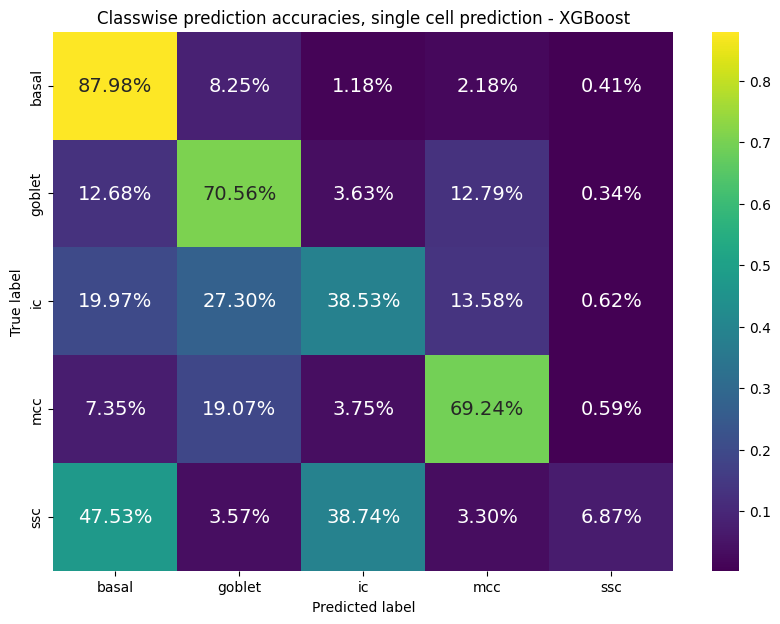

Accuracy: 0.8779758964733775
Balanced accuracy: 0.5998


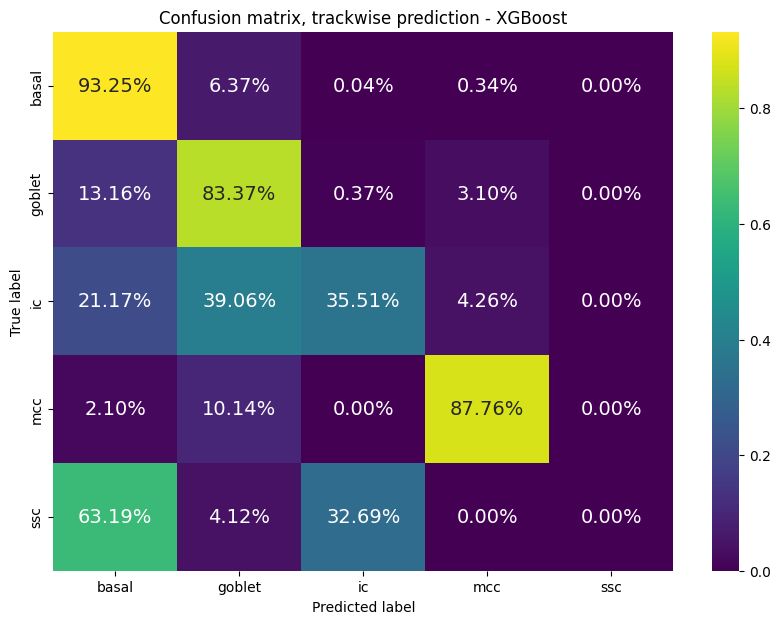

In [9]:
cell_type_dict = {'basal' : 0, 'goblet' : 1, 'ic' : 2, 'mcc' : 3, 'ssc' : 4}
class_map = {0 : 'basal', 1 : 'goblet', 2 : 'ic', 3 : 'mcc', 4 : 'ssc'}

# prepare a dataframe for training and testing
train_tracks_df= pd.DataFrame(columns=train_df2.columns)
test_tracks_df = pd.DataFrame(columns=train_df2.columns)

#For MCC, IC and SSC classes, sample 20% for testing, use the rest for training
for celltype in tqdm(['basal', 'goblet', 'mcc', 'ic', 'ssc']):
    data_frame = train_df2[(train_df2['cell_type'] == celltype)]# & (train_df2['annotation'] == 'manual')]

    # Calculate the count of entries for each Track ID
    track_counts = data_frame['Spot track ID relabelled'].value_counts()

    # Calculate the weights as a proportion of the total entries
    track_weights = track_counts / track_counts.sum()

    # Randomly sample 20% of Track IDs for the test set, weighted by entry count
    test_size = int(0.2 * len(track_counts))
    test_ids = np.random.choice(
        track_counts.index, 
        size=test_size, 
        replace=False, 
        p=track_weights
    )

    # Assign the remaining Track IDs to the training set
    train_ids = track_counts.index.difference(test_ids)

    # Filter the original DataFrame to create train and test sets based on Track IDs
    train_df_celltype = data_frame[data_frame['Spot track ID relabelled'].isin(train_ids)]
    test_df_celltype = data_frame[data_frame['Spot track ID relabelled'].isin(test_ids)]

    train_tracks_df = pd.concat([train_tracks_df, train_df_celltype])
    test_tracks_df = pd.concat([test_tracks_df, test_df_celltype])


def weighted_undersample_majorityclasses(data_frame, target_class, target_col, stratify_col, bins=10):
    # Bin continuous `t_hours` for stratification
    data_frame["t_hours_bin"] = pd.qcut(data_frame[stratify_col], q=bins, duplicates="drop")

    # Find class sizes
    class_counts = data_frame[target_col].value_counts()
    target_size = class_counts[target_class]  # Smallest class as reference

    # Perform weighted undersampling
    df_resampled = pd.concat([
        data_frame[data_frame[target_col] == c]
        .groupby("t_hours_bin", group_keys=False)
        .apply(lambda x: x.sample(frac=target_size / len(data_frame[data_frame[target_col] == c]))).reset_index(drop=True)
        for c in ['basal', 'goblet', 'mcc']]
    )

    return df_resampled.drop(columns=["t_hours_bin"]), target_size

# Apply function
train_tracks_df_balanced_undersampled, target_class_size = weighted_undersample_majorityclasses(train_tracks_df, target_class = 'mcc', target_col="cell_type", stratify_col="t_hours", bins=10)

def weighted_oversample_minorityclasses(data_frame, target_size, target_col, stratify_col, bins=10):
    df_encoded = data_frame[data_frame[target_col].isin(['ic', 'ssc'])]
    df_encoded["t_hours_bin"] = pd.qcut(df_encoded[stratify_col], q=bins, duplicates="drop")

    # Encode categorical variables if needed
    label_encoder = LabelEncoder()
    df_encoded[target_col] = label_encoder.fit_transform(df_encoded[target_col])

    # Select features and target
    X = df_encoded[['t_hours', 't_hours_bin'] + ordered_features]
    y = df_encoded[target_col]

    # Apply SMOTENC
    smote = SMOTENC(categorical_features=[X.columns.get_loc("t_hours_bin")], sampling_strategy={0 : target_size, 1 : target_size}, random_state=42)
    X_resampled, y_resampled = smote.fit_resample(X, y)

    # Convert back to DataFrame
    df_resampled = pd.DataFrame(X_resampled, columns=X.columns)
    df_resampled[target_col] = y_resampled

    df_resampled[target_col] = label_encoder.inverse_transform(df_resampled[target_col])

    return df_resampled.drop(columns=["t_hours_bin"])

# Apply function
train_tracks_df_balanced_oversampled = weighted_oversample_minorityclasses(train_tracks_df, target_class_size, target_col="cell_type", stratify_col="t_hours", bins=10)

train_tracks_df_balanced_undersampled_cropped = train_tracks_df_balanced_undersampled[train_tracks_df_balanced_oversampled.columns]

train_tracks_df_balanced = pd.concat([train_tracks_df_balanced_undersampled_cropped, train_tracks_df_balanced_oversampled])

# define independent and dependent variables for the whole dataset
train_independent_variables = train_tracks_df_balanced[['t_hours'] + ordered_features]
test_independent_variables = test_tracks_df[['t_hours'] + ordered_features]

train_dependent_variables = train_tracks_df_balanced.loc[:, "cell_type"]
test_dependent_variables = test_tracks_df.loc[:, "cell_type"]

#numerically encode classes for classifier
labelencoder = LabelEncoder()
y_train = labelencoder.fit_transform(train_dependent_variables)
y_test = labelencoder.transform(test_dependent_variables)

# Define your class labels (modify this based on your actual class labels)
class_labels = ['basal', 'goblet', 'ic', 'mcc', 'ssc']  # Example labels

# Step 1: Train your model
model = xgb.XGBClassifier({'objective': 'multi:softprob', 'num_class': 5})
model.fit(train_independent_variables, y_train)

# Step 2: Make predictions
y_pred = model.predict(test_independent_variables)

# Step 3: Calculate the accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy}')

# Step 3: Calculate the accuracy
balanced_acc = balanced_accuracy_score(y_test, y_pred)
print(f'Balanced accuracy: {balanced_acc}')

# Step 4: Compute the confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Step 5: Normalize the confusion matrix
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

# Step 6: Plot the normalized confusion matrix with string class labels
plt.figure(figsize=(10, 7))
sns.heatmap(cm_normalized, annot=True, fmt='.2%', cmap='viridis', xticklabels=class_labels, yticklabels=class_labels, annot_kws={"size": 14})
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title('Classwise prediction accuracies, single cell prediction - XGBoost')
plt.show()

#numerical encoded prediction label to column in the test data_frame
test_tracks_df['prediction'] = y_pred

#numerical prediction to string 
test_tracks_df['prediction_label'] = test_tracks_df['prediction'].map(class_map)


# Step 1: Group by Track ID and get the most prevalent ground truth and prediction for each track
def most_frequent_label(labels):
    counts = labels.value_counts()
    if counts.index[0] == "unknown" and len(counts) > 1:
        return counts.index[1]  # Return the second most frequent label
    return counts.index[0]  # Return the most frequent label

track_summary_auto = test_tracks_df.groupby('Spot track ID relabelled_auto').agg({
    'prediction_label': most_frequent_label
}).reset_index()

# Convert to dictionary
pred_dict = dict(zip(track_summary_auto['Spot track ID relabelled_auto'], track_summary_auto['prediction_label']))

test_tracks_df['prediction_trackwise'] = test_tracks_df['Spot track ID relabelled_auto'].map(pred_dict)


#Calculate the accuracy
accuracy = accuracy_score(test_tracks_df['cell_type'], test_tracks_df['prediction_trackwise'])
print(f'Accuracy: {accuracy}')

balanced_acc = balanced_accuracy_score(test_tracks_df['cell_type'], test_tracks_df['prediction_trackwise'])
print(f"Balanced accuracy: {balanced_acc:.4f}")

# Step 1: Calculate the confusion matrix
cm = confusion_matrix(test_tracks_df['cell_type'], test_tracks_df['prediction_trackwise'])

# Step 2: Normalize the confusion matrix
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

# Step 3: Define the class labels based on unique labels in the data
class_labels = ['basal', 'goblet', 'ic', 'mcc', 'ssc']

# Step 5: Plot the confusion matrix with custom annotations
plt.figure(figsize=(10, 7))
sns.heatmap(
    cm_normalized, 
    annot=True, 
    fmt='.2%',  # Disable default formatting
    cmap='viridis', 
    xticklabels=class_labels, 
    yticklabels=class_labels, 
    annot_kws={"size": 14}
)
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title('Confusion matrix, trackwise prediction - XGBoost')
#plt.savefig('plots_15_03/xgboost_trackwise_acc.pdf')
plt.show()

c:\Users\ghr283\Anaconda3\envs\kapoorlabsenv3\lib\site-packages\xgboost\plotting.py:267: FutureWarning: The `num_trees` parameter is deprecated, use `tree_idx` insetad. 
  warnings.warn(


<Figure size 3000x2000 with 0 Axes>

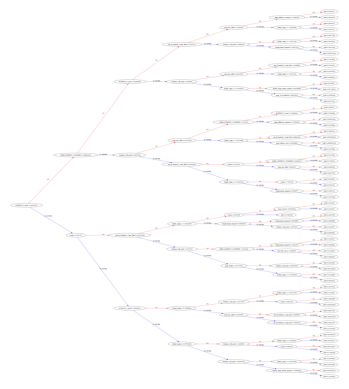

In [18]:
from xgboost import plot_tree

# plot single tree
plt.figure(figsize=(30, 20))
plot_tree(model, num_trees=0, rankdir='LR')
plt.show()

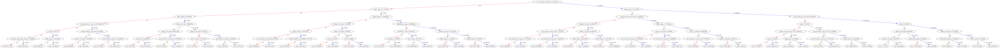

In [20]:
import graphviz
import os
tree_dot = xgb.to_graphviz(model, num_trees=2)
# Save the dot file
dot_file_path = "xgboost_tree.dot"
tree_dot.save(dot_file_path)
# Convert dot file to png and display
with open(dot_file_path) as f:
    dot_graph = f.read()
# Use graphviz to display the tree
graph = graphviz.Source(dot_graph)

graph.format = 'svg'  # Set the output format to SVG
graph.render("xgboost_tree")  # Saves as 'xgboost_tree.svg'

# Optionally display the SVG directly in a notebook
graph

In [24]:
from graphviz import Digraph

def create_balanced_tree(levels=4):
    dot = Digraph(comment='Balanced Decision Tree', format='svg')
    dot.attr('node', shape='circle', style='filled', fillcolor='white', fontsize='10', fontcolor='white')

    def add_nodes_edges(parent, depth, node_id):
        if depth >= levels:
            return
        left_id = f"{node_id}0"
        right_id = f"{node_id}1"

        dot.node(left_id)
        dot.node(right_id)

        # Blue edge for "Yes" (left), Red for "No" (right)
        dot.edge(parent, left_id, color='blue', label='')
        dot.edge(parent, right_id, color='red', label='')

        add_nodes_edges(left_id, depth + 1, left_id)
        add_nodes_edges(right_id, depth + 1, right_id)

    # Root node
    root = "0"
    dot.node(root)
    add_nodes_edges(root, 0, root)

    return dot

tree_graph = create_balanced_tree(levels=4)
tree_graph.render('balanced_decision_tree', view=True)  # Saves and opens the SVG

'balanced_decision_tree.svg'

### Single iteration comparison to logistic regressor

c:\Users\ghr283\Anaconda3\envs\kapoorlabsenv3\lib\site-packages\sklearn\linear_model\_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
c:\Users\ghr283\Anaconda3\envs\kapoorlabsenv3\lib\site-packages\sklearn\linear_model\_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


[LogReg] Accuracy: 0.6982
[LogReg] Balanced accuracy: 0.7116


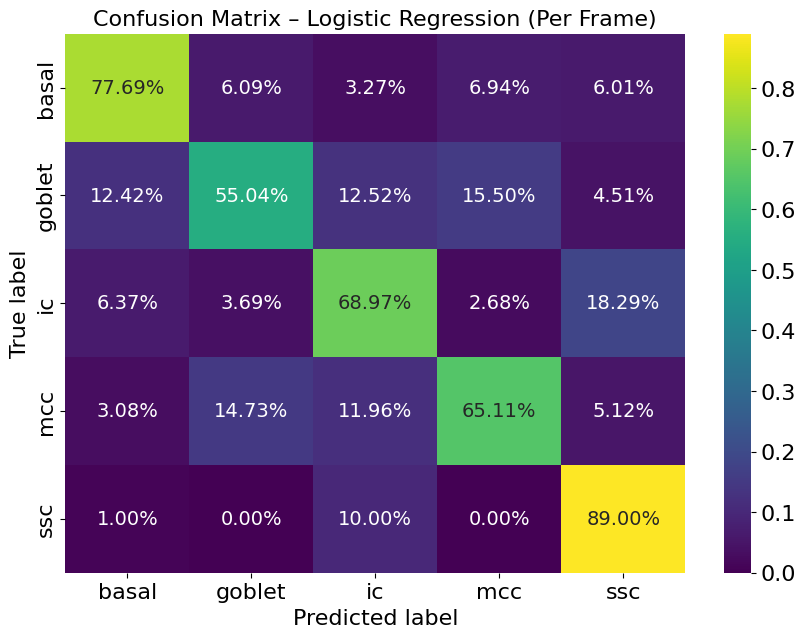

In [102]:
from sklearn.linear_model import LogisticRegression

# Train logistic regression on same training data
logreg_model = LogisticRegression(solver='saga', penalty='l1', max_iter=1000, multi_class='multinomial')
logreg_model.fit(train_independent_variables, y_train)

# Predict on test data
y_pred_logreg = logreg_model.predict(test_independent_variables)

# Evaluate performance
logreg_acc = accuracy_score(y_test, y_pred_logreg)
logreg_balanced_acc = balanced_accuracy_score(y_test, y_pred_logreg)
print(f"[LogReg] Accuracy: {logreg_acc:.4f}")
print(f"[LogReg] Balanced accuracy: {logreg_balanced_acc:.4f}")

# Confusion matrix
cm_logreg = confusion_matrix(y_test, y_pred_logreg)
cm_logreg_norm = cm_logreg.astype('float') / cm_logreg.sum(axis=1)[:, np.newaxis]

# Plot confusion matrix
plt.figure(figsize=(10, 7))
sns.heatmap(
    cm_logreg_norm,
    annot=True,
    fmt='.2%',
    cmap='viridis',
    xticklabels=class_labels,
    yticklabels=class_labels,
    annot_kws={"size": 14}
)
plt.title('Confusion Matrix – Logistic Regression (Per Frame)')
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.show()


[LogReg Trackwise] Accuracy: 0.8578
[LogReg Trackwise] Balanced Accuracy: 0.8628


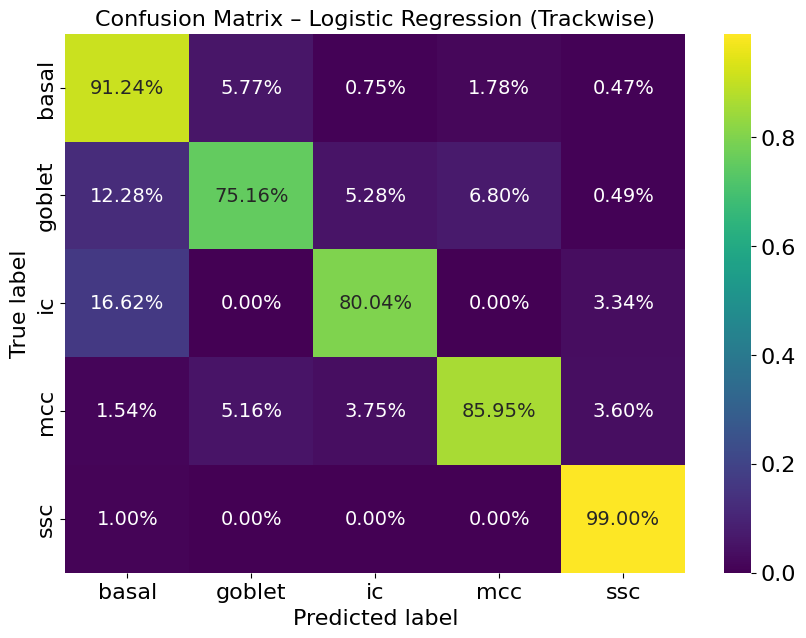

In [101]:
# Add predictions to test dataframe
test_tracks_df['logreg_prediction'] = y_pred_logreg
test_tracks_df['logreg_pred_label'] = test_tracks_df['logreg_prediction'].map(class_map)

# Trackwise majority prediction
track_summary_logreg = test_tracks_df.groupby('Spot track ID relabelled_auto').agg({
    'logreg_pred_label': most_frequent_label
}).reset_index()

pred_dict_logreg = dict(zip(track_summary_logreg['Spot track ID relabelled_auto'], track_summary_logreg['logreg_pred_label']))
test_tracks_df['logreg_pred_trackwise'] = test_tracks_df['Spot track ID relabelled_auto'].map(pred_dict_logreg)

# Trackwise accuracy
trackwise_acc_logreg = accuracy_score(test_tracks_df['cell_type'], test_tracks_df['logreg_pred_trackwise'])
trackwise_bal_acc_logreg = balanced_accuracy_score(test_tracks_df['cell_type'], test_tracks_df['logreg_pred_trackwise'])
print(f"[LogReg Trackwise] Accuracy: {trackwise_acc_logreg:.4f}")
print(f"[LogReg Trackwise] Balanced Accuracy: {trackwise_bal_acc_logreg:.4f}")

# Confusion matrix
cm_track_logreg = confusion_matrix(test_tracks_df['cell_type'], test_tracks_df['logreg_pred_trackwise'])
cm_track_logreg_norm = cm_track_logreg.astype('float') / cm_track_logreg.sum(axis=1)[:, np.newaxis]

plt.figure(figsize=(10, 7))
sns.heatmap(
    cm_track_logreg_norm,
    annot=True,
    fmt='.2%',
    cmap='viridis',
    xticklabels=class_labels,
    yticklabels=class_labels,
    annot_kws={"size": 14}
)
plt.title('Confusion Matrix – Logistic Regression (Trackwise)')
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.show()


### Confidence and accuracy of predictions

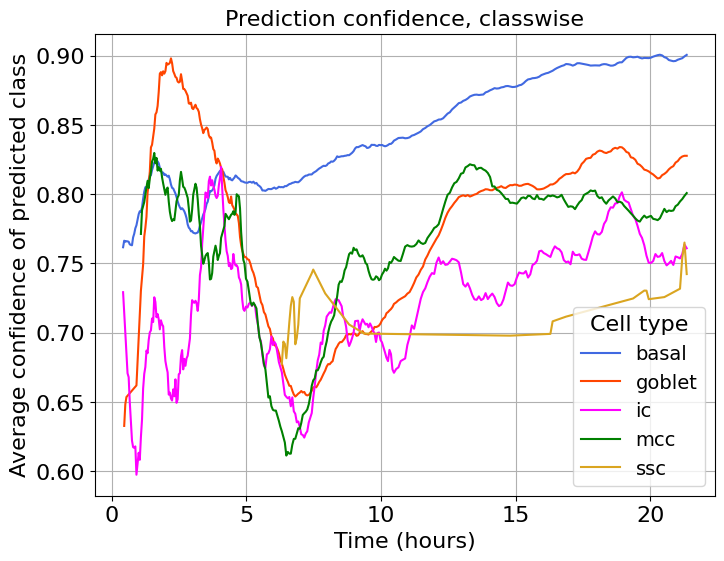

In [73]:
colors_dict = {'basal' : 'royalblue', 'goblet' : 'orangered', 'ic' : 'magenta', 'mcc' : 'green', 'ssc' : 'goldenrod'}

# Get predicted probabilities
y_pred_proba = model.predict_proba(test_independent_variables)

# Extract the highest confidence score for each prediction
test_tracks_df['prediction_confidence'] = y_pred_proba.max(axis=1)  # Max probability for predicted class

# Compute average confidence per t_hours and cell_type
confidence_df = (
    test_tracks_df.groupby(['t_hours', 'cell_type'])
    .agg(avg_confidence=('prediction_confidence', 'mean'))
    .reset_index()
)

# Step 4: Apply moving average smoothing across time to see the timewise trend better
window_size = 20  # Adjust for smoothness
plt.figure(figsize=(8, 6))

for cell_type, group_df in confidence_df.groupby('cell_type'):
    # Ensure sorted order by time
    group_df = group_df.sort_values('t_hours')
    
    # Apply rolling mean for smoothing
    group_df['smoothed_confidence'] = group_df['avg_confidence'].rolling(window=window_size, center=True).mean()
    
    # Plot the smoothed confidence scores
    plt.plot(group_df['t_hours'], group_df['smoothed_confidence'], label=cell_type, color=colors_dict[cell_type])

# Adding labels and legend
plt.xlabel('Time (hours)')
plt.ylabel('Average confidence of predicted class')
plt.title('Prediction confidence, classwise')
plt.legend(title='Cell type', loc='best')
plt.grid(True)
#plt.savefig('plots_15_03/model_confidence.pdf')
plt.show()


### Working with the classifier using all timepoints

In [74]:
#numerical encoded prediction label to column in the test data_frame
test_tracks_df['prediction'] = y_pred

#numerical prediction to string 
test_tracks_df['prediction_label'] = test_tracks_df['prediction'].map(class_map)


C:\Users\ghr283\AppData\Local\Temp\ipykernel_27816\3279263185.py:15: RuntimeWarning: invalid value encountered in divide
  cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]  # Normalize per true class
C:\Users\ghr283\AppData\Local\Temp\ipykernel_27816\3279263185.py:15: RuntimeWarning: invalid value encountered in divide
  cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]  # Normalize per true class
C:\Users\ghr283\AppData\Local\Temp\ipykernel_27816\3279263185.py:15: RuntimeWarning: invalid value encountered in divide
  cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]  # Normalize per true class
C:\Users\ghr283\AppData\Local\Temp\ipykernel_27816\3279263185.py:15: RuntimeWarning: invalid value encountered in divide
  cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]  # Normalize per true class
C:\Users\ghr283\AppData\Local\Temp\ipykernel_27816\3279263185.py:15: RuntimeWarning: invalid value encountered in divide
  cm_no

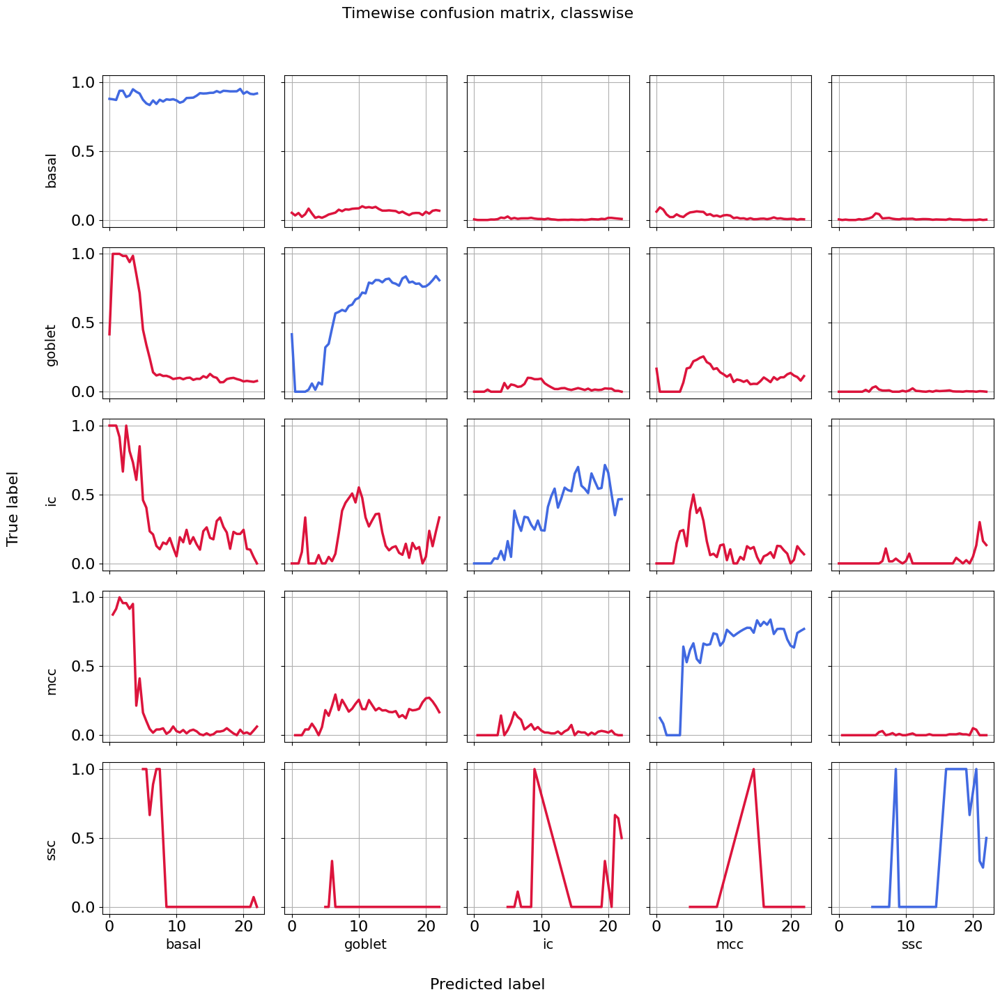

In [75]:
# Define class labels (same order as used in the label encoder)
class_labels = ['basal', 'goblet', 'ic', 'mcc', 'ssc']
num_classes = len(class_labels)

# Define time bins (optional, you can smooth over hours)
bin_size = 0.5  # Set time bin width in hours
test_tracks_df['t_bin'] = (test_tracks_df['t_hours'] // bin_size) * bin_size  # Bin time variable

# Initialize storage for confusion matrices over time
time_confusion_matrices = {}

# Compute confusion matrices per time bin
for t_bin, group in test_tracks_df.groupby("t_bin"):
    cm = confusion_matrix(group["cell_type"], group["prediction_label"], labels=class_labels)
    cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]  # Normalize per true class
    time_confusion_matrices[t_bin] = cm_normalized

# Convert into time-series dataframe
time_series_df = []
for t_bin, cm in time_confusion_matrices.items():
    for i, true_class in enumerate(class_labels):
        for j, pred_class in enumerate(class_labels):
            time_series_df.append({"Time": t_bin, "True Class": true_class, "Predicted Class": pred_class, "Value": cm[i, j]})

time_series_df = pd.DataFrame(time_series_df)

# Create a subplot grid (class x class)
fig, axes = plt.subplots(num_classes, num_classes, figsize=(15, 15), sharex=True, sharey=True)

for i, true_class in enumerate(class_labels):
    for j, pred_class in enumerate(class_labels):
        ax = axes[i, j]
        
        # Filter time-series data for this confusion matrix entry
        plot_data = time_series_df[(time_series_df["True Class"] == true_class) & 
                                   (time_series_df["Predicted Class"] == pred_class)]
        
        # Plot line chart
        sns.lineplot(data=plot_data, x="Time", y="Value", ax=ax, color='royalblue' if i == j else 'crimson', linewidth=2.5)
        
        # Remove individual subplot titles
        ax.set_title("")
        
        # Set leftmost column y-axis labels (True Class)
        if j == 0:
            ax.set_ylabel(true_class, fontsize=14, rotation=90, labelpad=20, ha='right', va='center')
        
        # Set bottommost row x-axis labels (Predicted Class)
        if i == num_classes - 1:
            ax.set_xlabel(pred_class, fontsize=14)

        ax.grid(True)

# Add global axis labels
fig.text(0.04, 0.5, "True label", va='center', rotation=90, fontsize=16)
fig.text(0.5, 0.04, "Predicted label", ha='center', fontsize=16)

# Set global figure title
plt.suptitle("Timewise confusion matrix, classwise", fontsize=16)

plt.tight_layout(rect=[0.06, 0.06, 1, 0.96])  # Adjust layout for global labels
#plt.savefig('plots_15_03/model_accuracy_matrix.pdf')
plt.show()

How does the model perform timewise? Plot accuracy of predictions across time

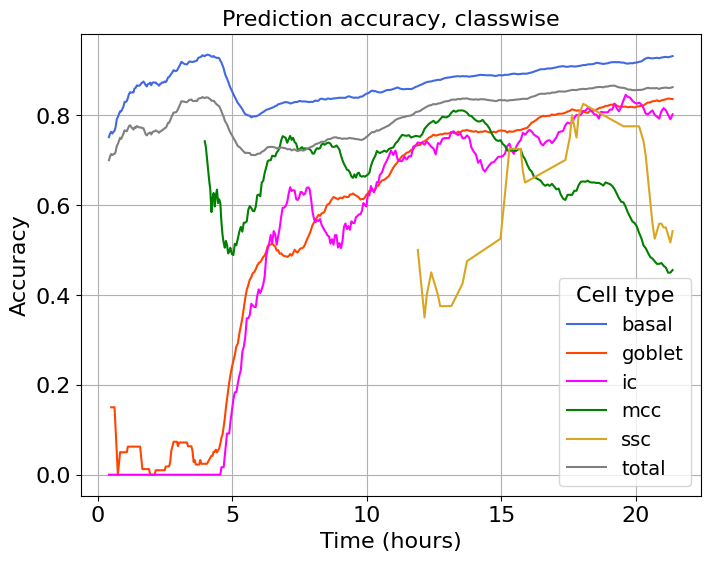

In [91]:
# Create a new column for correct predictions
test_tracks_df['is_correct'] = test_tracks_df['cell_type'] == test_tracks_df['prediction_label']

# Calculate accuracy per t_hours and cell_type
accuracy_df = (
    test_tracks_df.groupby(['t_hours', 'cell_type'])
    .agg(accuracy=('is_correct', 'mean'))
    .reset_index()
)

# Calculate total accuracy per t_hours (for overall line)
total_accuracy_df = (
    test_tracks_df.groupby('t_hours')
    .agg(total_accuracy=('is_correct', 'mean'))
    .reset_index()
)

#Applying some smoothing to make more sense of the timewise development
# Define the moving average window size
window_size = 20  # Adjust this to control the smoothness (higher = smoother)

colors_dict = {'basal' : 'royalblue', 'goblet' : 'orangered', 'ic' : 'magenta', 'mcc' : 'green', 'ssc' : 'goldenrod'}

# Plot with smoothing
plt.figure(figsize=(8, 6))
for cell_type, group_df in accuracy_df.groupby('cell_type'):
    # Apply moving average to the accuracy column
    group_df = group_df.sort_values('t_hours')  # Ensure sorted order by time
    group_df['smoothed_accuracy'] = group_df['accuracy'].rolling(window=window_size, center=True).mean()
    
    # Plot the smoothed line
    plt.plot(group_df['t_hours'], group_df['smoothed_accuracy'], label=cell_type, color=colors_dict[cell_type])

# Plot the overall accuracy line with smoothing
total_accuracy_df = total_accuracy_df.sort_values('t_hours')
total_accuracy_df['smoothed_total_accuracy'] = total_accuracy_df['total_accuracy'].rolling(window=window_size, center=True).mean()
plt.plot(total_accuracy_df['t_hours'], total_accuracy_df['smoothed_total_accuracy'], label='total', color='gray', linewidth=1.5)

# Adding labels and legend
plt.xlabel('Time (hours)')
plt.ylabel('Accuracy')
plt.title('Prediction accuracy, classwise')
plt.legend(title='Cell type', loc='best')
plt.grid(True)
#plt.savefig('plots_15_03/model_accuracy.pdf')
plt.show()

Are the correct predictions evenly distributed between tracks? Plot predictions per track across time

In [103]:
# Convert Tracklet ID to a categorical type and map to numeric values for plotting
def convert_tracklet_to_numeric(data_frame):
    data_frame['Tracklet ID'] = data_frame['Track ID_y'].astype('category')  # Convert to categorical
    data_frame['Tracklet Numeric'] = data_frame['Tracklet ID'].cat.codes      # Convert to numeric
    return data_frame

# Helper function to plot each tracklet with colored segments based on class
def plot_colored_lines(data_frame, ax, label_column, palette):
    for tracklet_id, tracklet_numeric in zip(data_frame['Tracklet ID'].unique(), data_frame['Tracklet Numeric'].unique()):
        # Extract the data for the current tracklet
        tracklet_data = data_frame[data_frame['Tracklet ID'] == tracklet_id]

        # Iterate over timepoints and plot line segments with corresponding color
        for i in range(len(tracklet_data) - 1):
            t_values = tracklet_data['t_hours'].iloc[i:i+2]
            y_value = tracklet_numeric  # Horizontal line on y-axis (Tracklet Numeric)
            
            # Get the color for this segment based on prediction class
            class_label = tracklet_data[label_column].iloc[i]
            color = palette[class_label]
            
            # Plot the segment as a horizontal line with the corresponding color
            ax.plot(t_values, [y_value, y_value], color=color, linewidth=4)

import matplotlib.ticker as ticker

# Updated plotting function
def plot_predictions(data_frame, celltype):
    if celltype == 'ssc':
        fig, axes = plt.subplots(1, 1, figsize=(7, 5), sharex=True)
    else:
        fig, axes = plt.subplots(1, 1, figsize=(5, 5), sharex=True)

    # Define a color palette for the shape and dynamic predictions
    palette_pred = {'basal': 'blue', 'goblet': 'orange', 'mcc': 'green', 'ic': 'magenta', 'ssc': 'yellow'}

    # Plot shape predictions with colored segments
    plot_colored_lines(data_frame, axes, 'prediction_label', palette_pred)
    axes.set_title(f'Trackwise predictions, track gt: {celltype}')
    axes.set_ylabel('Tracklet ID')
    axes.set_xlabel('Time (t)')

    # Set y-axis ticks to whole numbers
    axes.yaxis.set_major_locator(ticker.MultipleLocator(3))  # Show ticks at intervals of 2

    # Add legends manually for each plot
    handles_morpho = [plt.Line2D([0], [0], color=color, lw=4, label=label) for label, color in palette_pred.items()]
    
    if celltype == 'ssc':
        axes.legend(handles=handles_morpho, bbox_to_anchor=(1.05, 1), loc='upper left', title='Predictions per track')

    plt.tight_layout()
    plt.xlim((-1, 23))
    plt.savefig(f'plots_15_03/predicted_tracks_{celltype}.pdf')
    plt.show()


C:\Users\ghr283\AppData\Local\Temp\ipykernel_27816\3590315512.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Tracklet ID'] = data_frame['Track ID_y'].astype('category')  # Convert to categorical
C:\Users\ghr283\AppData\Local\Temp\ipykernel_27816\3590315512.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Tracklet Numeric'] = data_frame['Tracklet ID'].cat.codes      # Convert to numeric


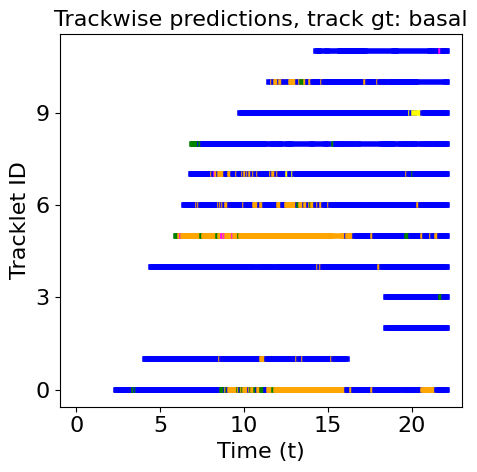

C:\Users\ghr283\AppData\Local\Temp\ipykernel_27816\3590315512.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Tracklet ID'] = data_frame['Track ID_y'].astype('category')  # Convert to categorical
C:\Users\ghr283\AppData\Local\Temp\ipykernel_27816\3590315512.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Tracklet Numeric'] = data_frame['Tracklet ID'].cat.codes      # Convert to numeric


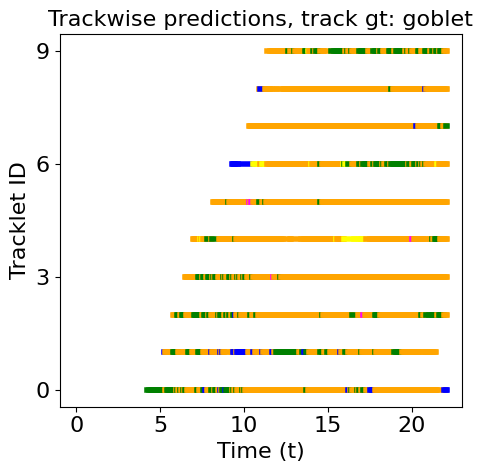

C:\Users\ghr283\AppData\Local\Temp\ipykernel_27816\3590315512.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Tracklet ID'] = data_frame['Track ID_y'].astype('category')  # Convert to categorical
C:\Users\ghr283\AppData\Local\Temp\ipykernel_27816\3590315512.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Tracklet Numeric'] = data_frame['Tracklet ID'].cat.codes      # Convert to numeric


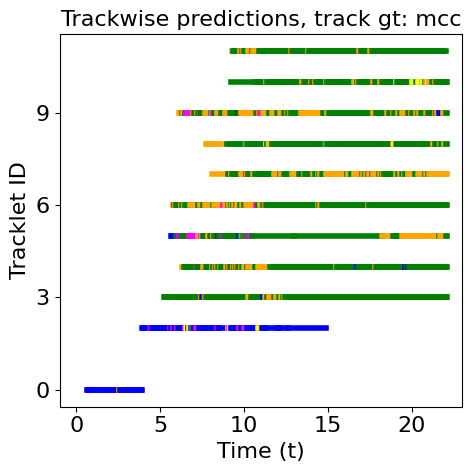

C:\Users\ghr283\AppData\Local\Temp\ipykernel_27816\3590315512.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Tracklet ID'] = data_frame['Track ID_y'].astype('category')  # Convert to categorical
C:\Users\ghr283\AppData\Local\Temp\ipykernel_27816\3590315512.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Tracklet Numeric'] = data_frame['Tracklet ID'].cat.codes      # Convert to numeric


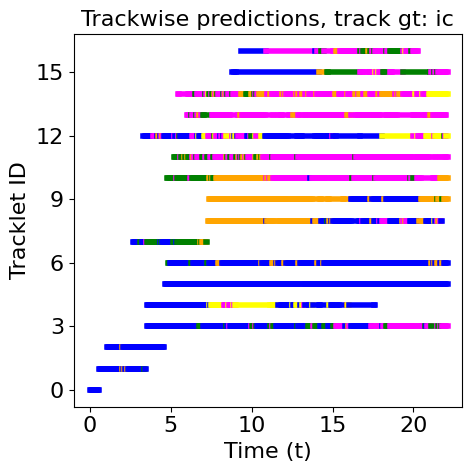

C:\Users\ghr283\AppData\Local\Temp\ipykernel_27816\3590315512.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Tracklet ID'] = data_frame['Track ID_y'].astype('category')  # Convert to categorical
C:\Users\ghr283\AppData\Local\Temp\ipykernel_27816\3590315512.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame['Tracklet Numeric'] = data_frame['Tracklet ID'].cat.codes      # Convert to numeric


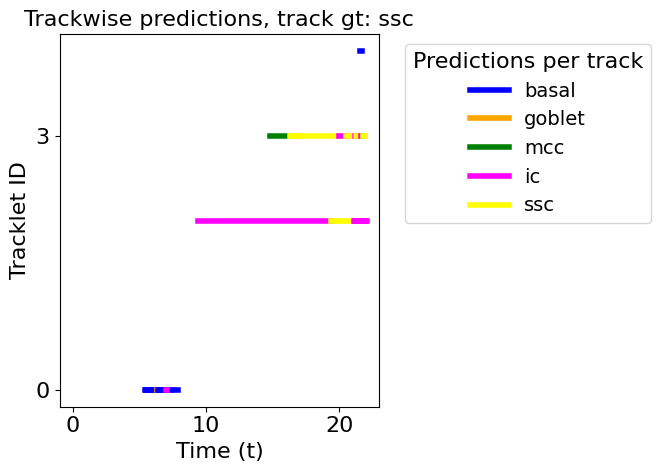

In [78]:
for celltype in test_tracks_df['cell_type'].unique():
    # Convert the unique TrackMate Track ID values to a list before sampling
    celltype_ids = test_tracks_df[test_tracks_df['cell_type'] == celltype]['Spot track ID relabelled'].unique()
    celltype_ids_to_plot = random.sample(list(celltype_ids), min(10, len(celltype_ids)))

    celltype_df = test_tracks_df[test_tracks_df['Spot track ID relabelled'].isin(celltype_ids_to_plot)]

    # Convert Tracklet ID to numeric for plotting
    celltype_df = convert_tracklet_to_numeric(celltype_df)

    plot_predictions(celltype_df, celltype)

### Feature importances

Which features are the most important for predicting each class? To get a overall look, get classwise feature importance plots from SHAP, which conveniently has a plotting function

In [150]:
import shap
# Compute SHAP values
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(test_independent_variables)

Feature importance for basal (top 5 mean SHAP value features)


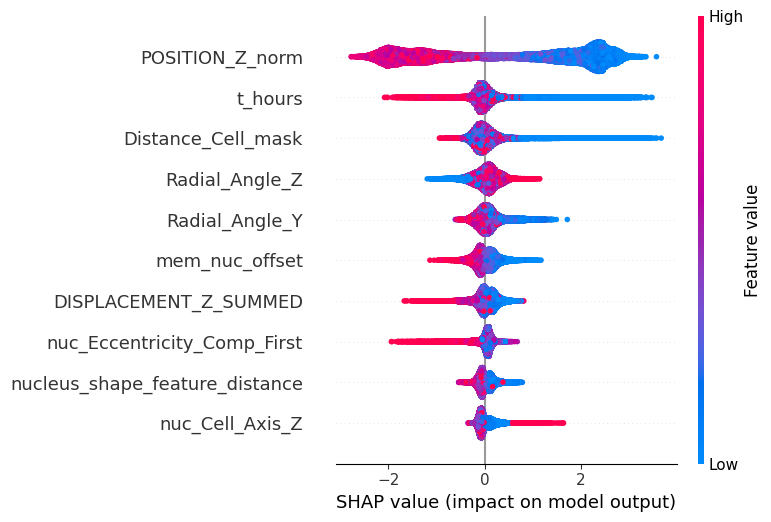

Feature importance for goblet (top 5 mean SHAP value features)


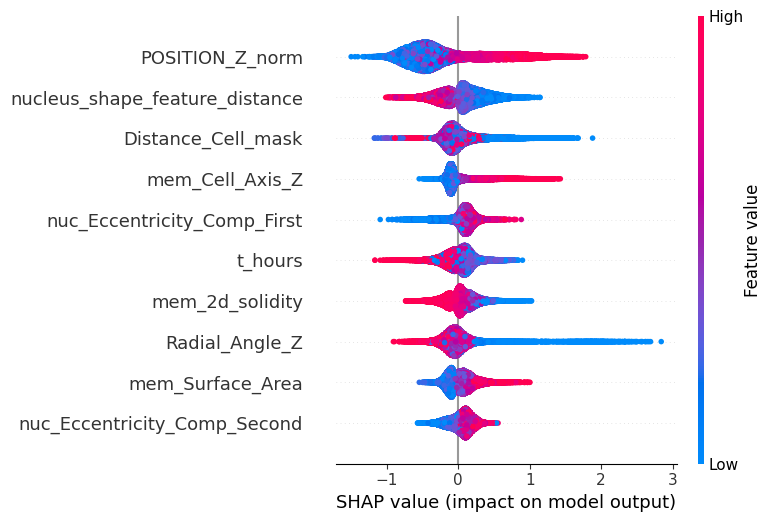

Feature importance for ic (top 5 mean SHAP value features)


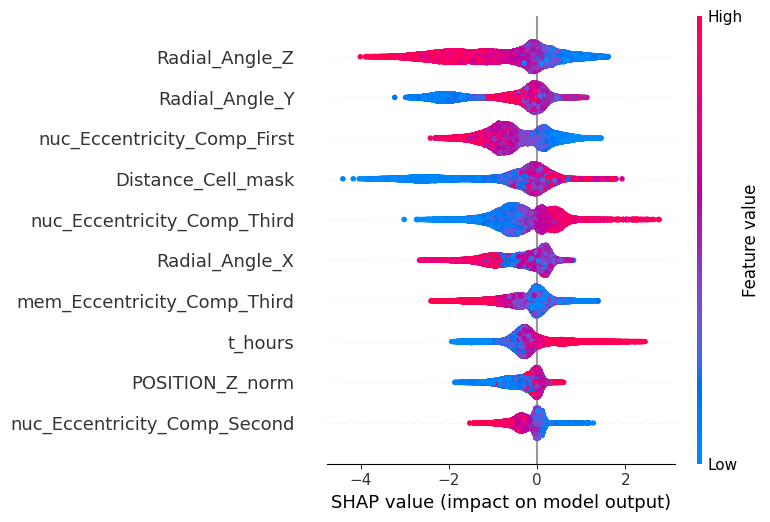

Feature importance for mcc (top 5 mean SHAP value features)


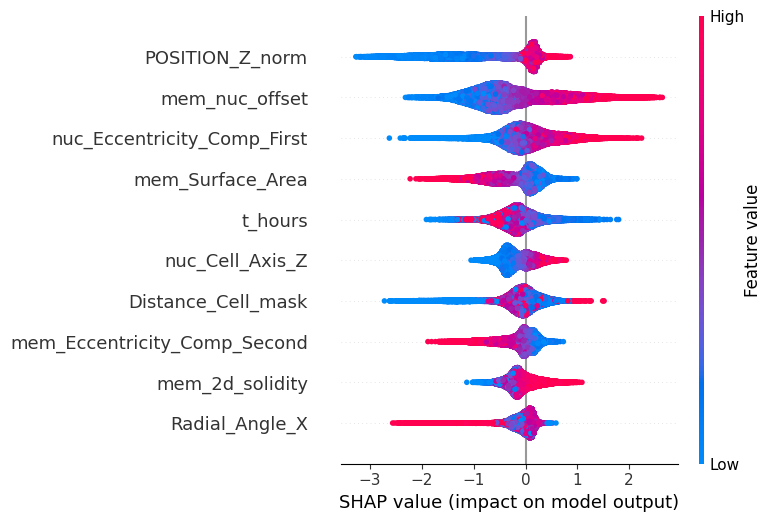

Feature importance for ssc (top 5 mean SHAP value features)


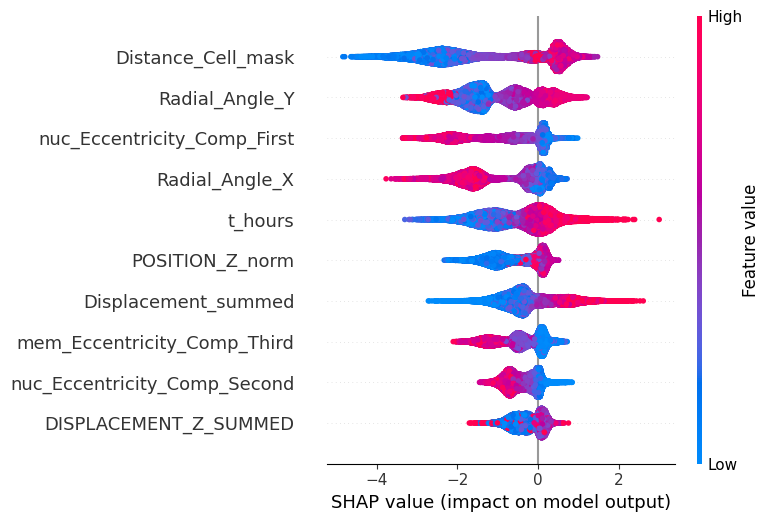

In [165]:
class_map = {0 : 'basal', 1 : 'goblet', 2 : 'ic', 3 : 'mcc', 4 : 'ssc'}

for i in range(0, 5):
    # Extract SHAP values for the specific class
    shap_values_for_class = shap_values[:, :, i]

    # Compute mean absolute SHAP values per feature
    mean_shap_values = np.abs(shap_values_for_class).mean(axis=0)

    # Get indices of top 5 features
    top_features_idx = np.argsort(mean_shap_values)[-10:]

    # Select only top 5 features for SHAP visualization
    top_shap_values = shap_values_for_class[:, top_features_idx]
    top_feature_names = [test_independent_variables.columns[j] for j in top_features_idx]

    print(f'Feature importance for {class_map[i]} (top 5 mean SHAP value features)')

    # Plot only top 5 features
    shap.summary_plot(top_shap_values, test_independent_variables.iloc[:, top_features_idx], feature_names=top_feature_names)

In [166]:
for i in range(0, 5):
    # Extract SHAP values for the specific class
    shap_values_for_class = shap_values[:, :, i]

    # Compute mean absolute SHAP values per feature
    mean_shap_values = np.abs(shap_values_for_class).mean(axis=0)

    # Get indices of top 5 features
    top_features_idx = np.argsort(mean_shap_values)[-10:]

    # Select only top 5 features for SHAP visualization
    top_shap_values = shap_values_for_class[:, top_features_idx]
    top_feature_names = [test_independent_variables.columns[j] for j in top_features_idx]

    print(f'Feature importance for {class_map[i]} (top 10 mean SHAP value features)')

    # Create SHAP summary plot and save it as a rasterized PNG
    plt.figure()
    shap.summary_plot(top_shap_values, test_independent_variables.iloc[:, top_features_idx], 
                      feature_names=top_feature_names, show=False)
    plt.savefig(f'plots_15_03/shap_plot_{class_map[i]}.pdf', dpi=300, bbox_inches='tight')  # Rasterized version
    plt.close()  # Close the plot to prevent overlap in subsequent plots

Feature importance for basal (top 10 mean SHAP value features)
Feature importance for goblet (top 10 mean SHAP value features)
Feature importance for ic (top 10 mean SHAP value features)
Feature importance for mcc (top 10 mean SHAP value features)
Feature importance for ssc (top 10 mean SHAP value features)


Feature importance for basal (top 5 mean SHAP value features)


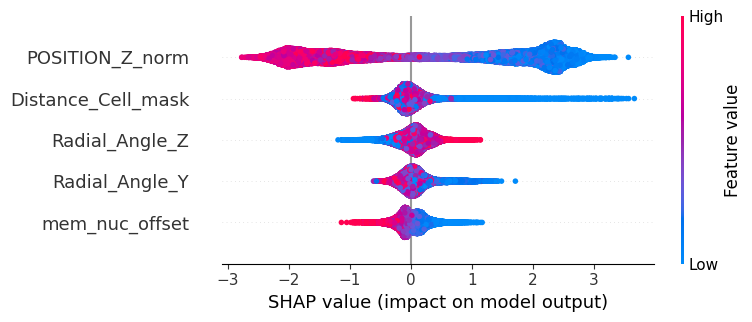

Feature importance for goblet (top 5 mean SHAP value features)


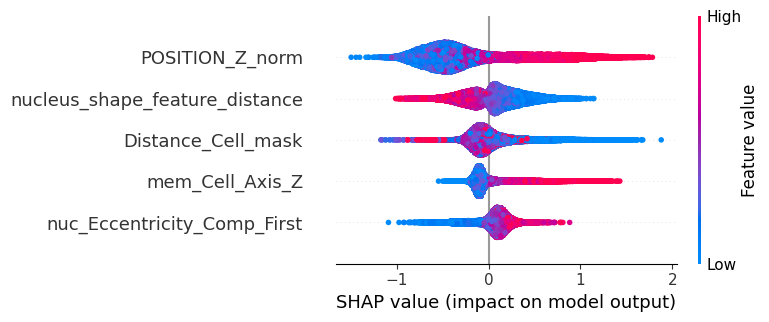

Feature importance for ic (top 5 mean SHAP value features)


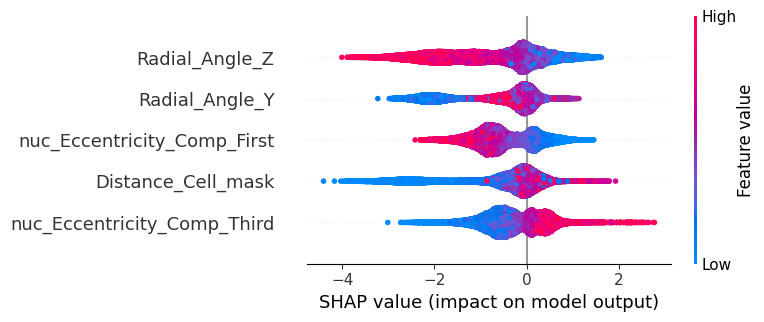

Feature importance for mcc (top 5 mean SHAP value features)


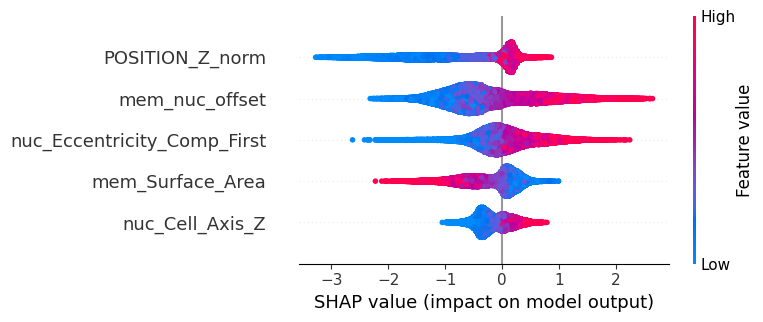

Feature importance for ssc (top 5 mean SHAP value features)


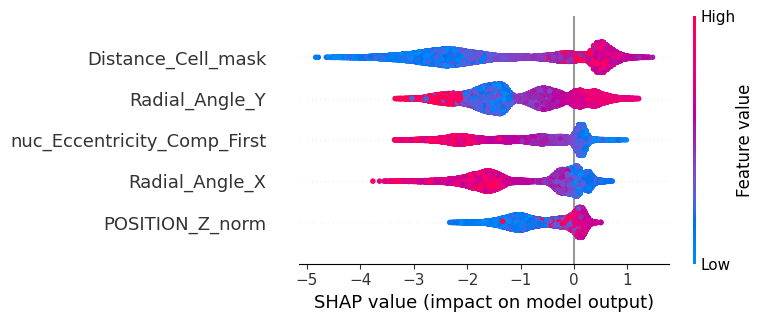

In [158]:
class_map = {0: 'basal', 1: 'goblet', 2: 'ic', 3: 'mcc', 4: 'ssc'}

# Find index of 't_hours' in the DataFrame columns
t_hours_idx = test_independent_variables.columns.get_loc('t_hours')

for i in range(0, 5):
    # Extract SHAP values for the specific class
    shap_values_for_class = shap_values[:, :, i]

    # Compute mean absolute SHAP values per feature (excluding 't_hours')
    mean_shap_values = np.abs(shap_values_for_class).mean(axis=0)

    # Exclude the SHAP value for 't_hours'
    mean_shap_values[t_hours_idx] = -np.inf  # Set its value very low to ensure it's excluded from the top features

    # Get indices of top 5 features (excluding 't_hours')
    top_features_idx = np.argsort(mean_shap_values)[-5:]

    # Select only top 5 features for SHAP visualization
    top_shap_values = shap_values_for_class[:, top_features_idx]
    top_feature_names = [test_independent_variables.columns[j] for j in top_features_idx]

    print(f'Feature importance for {class_map[i]} (top 5 mean SHAP value features)')

    # Plot only top 5 features
    shap.summary_plot(top_shap_values, test_independent_variables.iloc[:, top_features_idx], feature_names=top_feature_names)


100%|██████████| 35/35 [03:17<00:00,  5.65s/it]


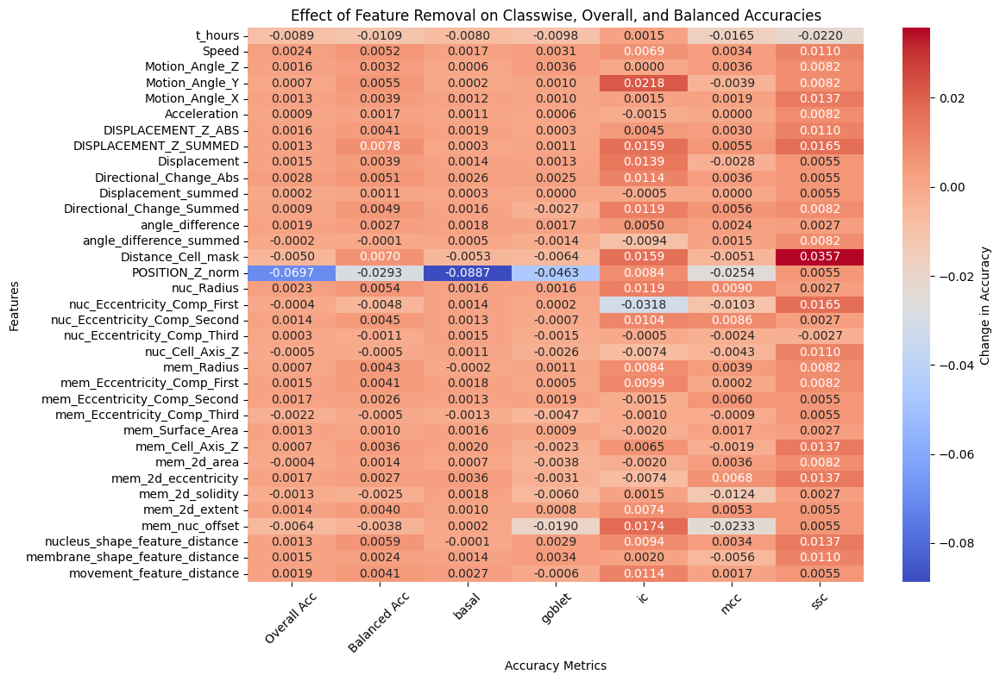

In [46]:

# Encode labels
labelencoder = LabelEncoder()
y_train = labelencoder.fit_transform(train_dependent_variables)
y_test = labelencoder.transform(test_dependent_variables)

# Train and predict with all features to calculate baseline accuracies
model = xgb.XGBClassifier()
model.fit(train_independent_variables, y_train)
y_pred = model.predict(test_independent_variables)

baseline_overall_acc = accuracy_score(y_test, y_pred)
baseline_balanced_acc = balanced_accuracy_score(y_test, y_pred)

# Calculate baseline class-wise accuracy from confusion matrix
baseline_cm = confusion_matrix(y_test, y_pred)
baseline_classwise_acc = np.diag(baseline_cm) / baseline_cm.sum(axis=1)

# Prepare results storage for decimal changes in accuracies
results_matrix = pd.DataFrame(index=train_independent_variables.columns, columns=['Overall Acc', 'Balanced Acc'] + list(class_labels))

# Leave-one-feature-out loop
for feature in tqdm(train_independent_variables.columns):
    # Remove one feature and retrain
    X_train_reduced = train_independent_variables.drop(columns=[feature])
    X_test_reduced = test_independent_variables.drop(columns=[feature])
    
    # Train model on reduced features
    model_reduced = xgb.XGBClassifier()
    model_reduced.fit(X_train_reduced, y_train)
    y_pred_reduced = model_reduced.predict(X_test_reduced)
    
    # Calculate new accuracies after feature removal
    new_overall_acc = accuracy_score(y_test, y_pred_reduced)
    new_balanced_acc = balanced_accuracy_score(y_test, y_pred_reduced)
    
    # Compute new class-wise accuracy from confusion matrix
    new_cm = confusion_matrix(y_test, y_pred_reduced)
    new_classwise_acc = np.diag(new_cm) / new_cm.sum(axis=1)
    
    # Calculate decimal change for each accuracy metric and store in matrix
    for i, class_label in enumerate(class_labels):
        results_matrix.loc[feature, class_label] = new_classwise_acc[i] - baseline_classwise_acc[i]
    
    # Store overall accuracy changes
    results_matrix.loc[feature, 'Overall Acc'] = new_overall_acc - baseline_overall_acc
    results_matrix.loc[feature, 'Balanced Acc'] = new_balanced_acc - baseline_balanced_acc

# Convert results to numeric values (for plotting purposes)
results_matrix = results_matrix.astype(float)

# Plot the heatmap of accuracy changes
plt.figure(figsize=(12, 8))
sns.heatmap(results_matrix, annot=True, fmt=".4f", cmap='coolwarm', cbar_kws={'label': 'Change in Accuracy'})
plt.title('Effect of Feature Removal on Classwise, Overall, and Balanced Accuracies')
plt.xlabel('Accuracy Metrics')
plt.ylabel('Features')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


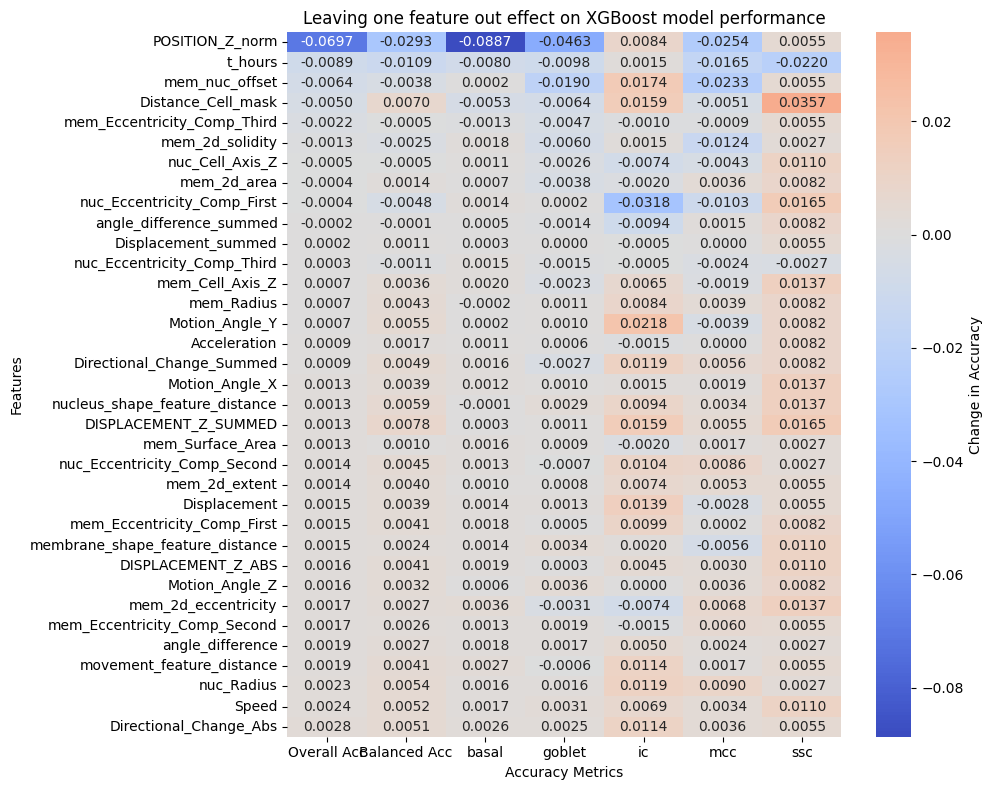

In [47]:
# Sort the features by overall accuracy delta (descending order)
sorted_results_matrix = results_matrix.sort_values(by='Overall Acc', ascending=True)

# Plot the heatmap with the sorted features
plt.figure(figsize=(10, 8))
sns.heatmap(sorted_results_matrix, annot=True, fmt=".4f", cmap='coolwarm', center=0, cbar_kws={'label': 'Change in Accuracy'})
plt.title('Leaving one feature out effect on XGBoost model performance')
plt.xlabel('Accuracy Metrics')
plt.ylabel('Features')
plt.tight_layout()
#plt.savefig('plots_15_03/feature_importance_heatmap.pdf')
plt.show()

In [48]:
# Sort by absolute drop in Overall Acc (descending) and get top 10
top_features = sorted_results_matrix.head(10).index.tolist()


In [49]:
# Use the model trained with all features
baseline_preds = y_pred
baseline_proba = model.predict_proba(test_independent_variables)
t_test = test_independent_variables['t_hours'].values

# Add to test_tracks_df
test_tracks_df['baseline_is_correct'] = test_tracks_df['cell_type'] == test_tracks_df['prediction_label']
test_tracks_df['baseline_confidence'] = baseline_proba.max(axis=1)

In [50]:
# Accuracy
baseline_acc = (
    test_tracks_df.groupby('t_hours')
    .agg(accuracy=('baseline_is_correct', 'mean'))
    .reset_index()
)
baseline_acc['smoothed'] = baseline_acc['accuracy'].rolling(window=20, center=True).mean()

# Confidence
baseline_conf = (
    test_tracks_df.groupby('t_hours')
    .agg(confidence=('baseline_confidence', 'mean'))
    .reset_index()
)
baseline_conf['smoothed'] = baseline_conf['confidence'].rolling(window=20, center=True).mean()

Processing feature: POSITION_Z_norm


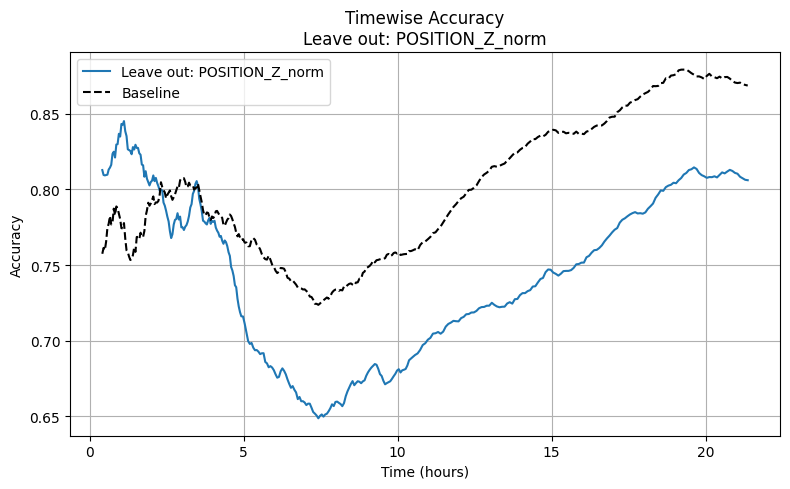

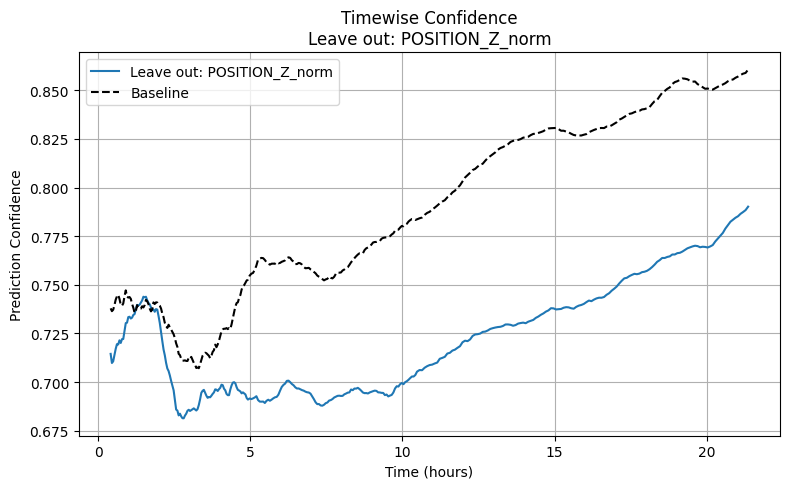

Processing feature: t_hours


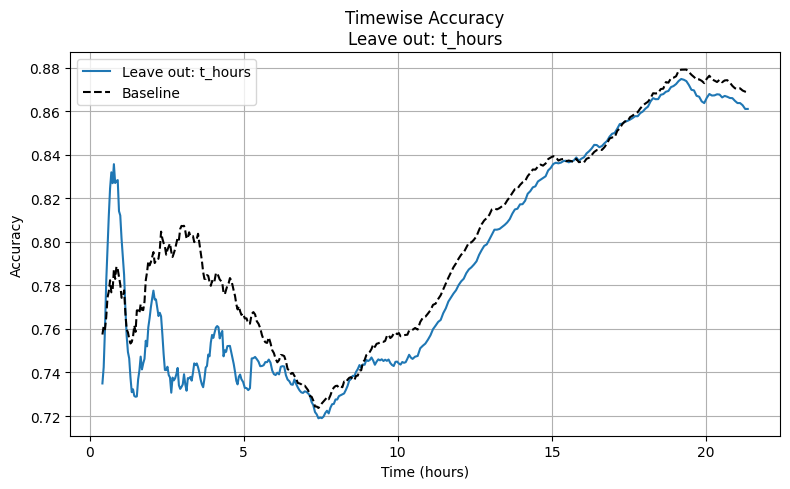

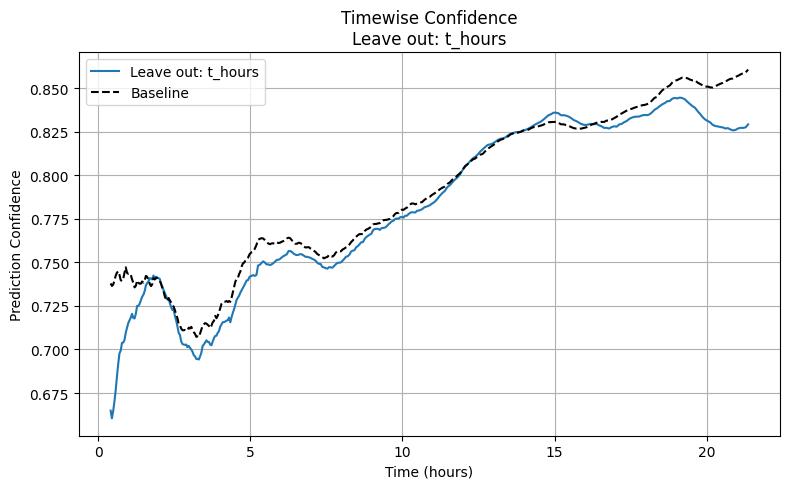

Processing feature: mem_nuc_offset


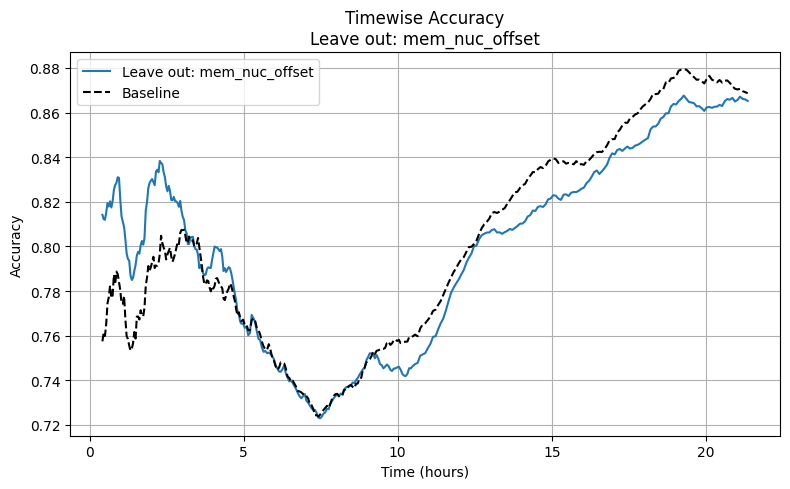

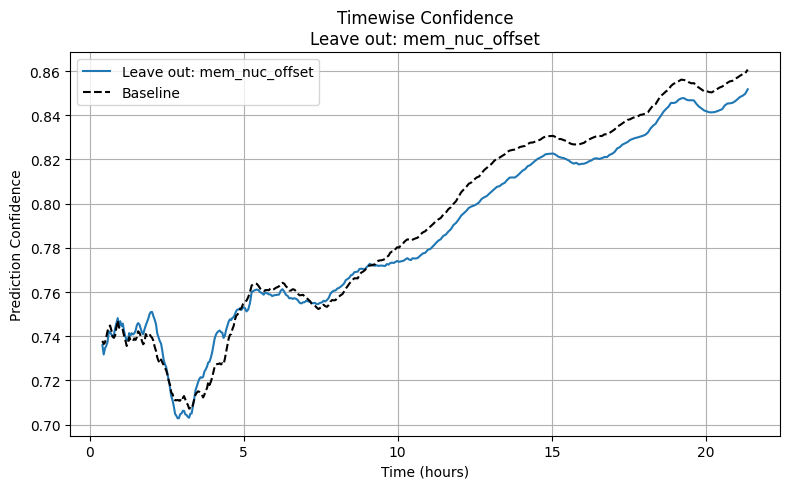

Processing feature: Distance_Cell_mask


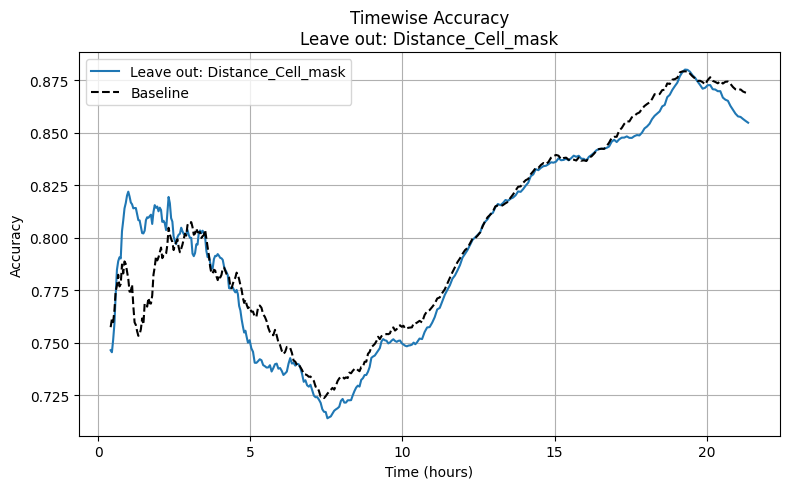

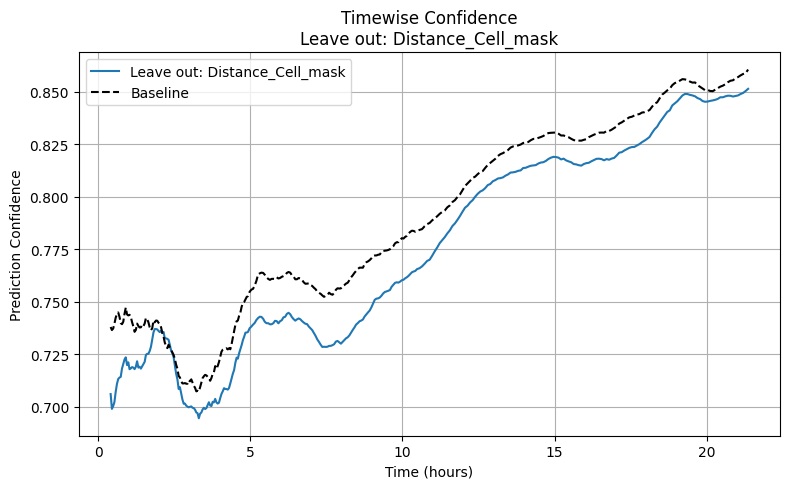

Processing feature: mem_Eccentricity_Comp_Third


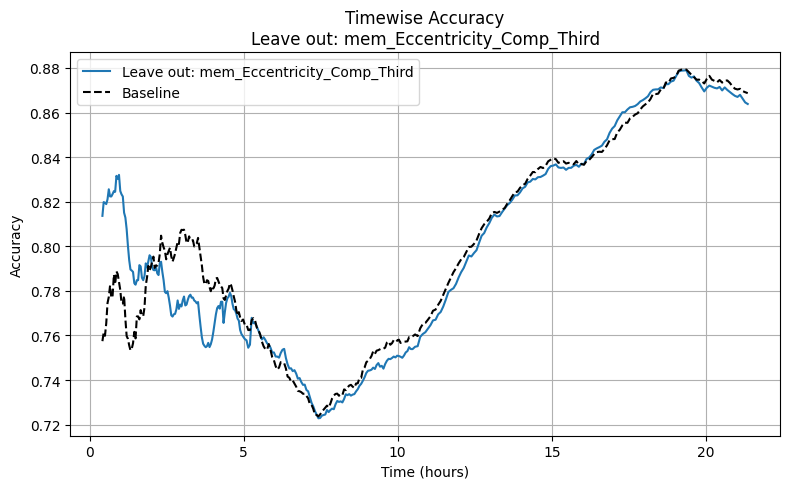

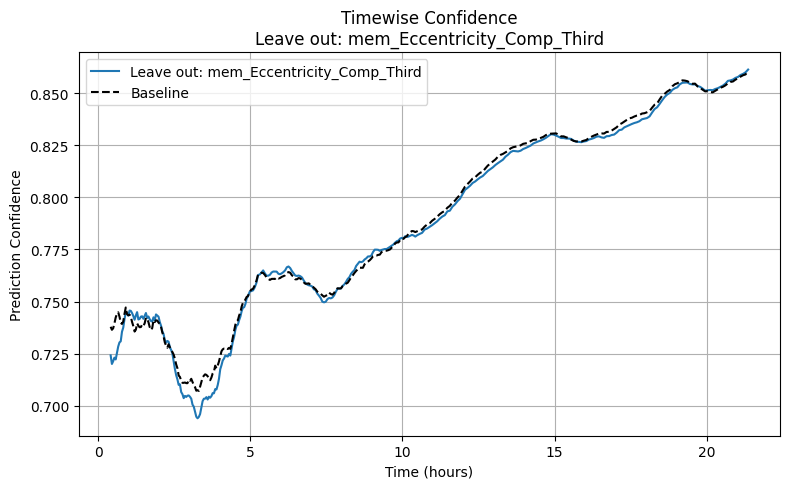

Processing feature: mem_2d_solidity


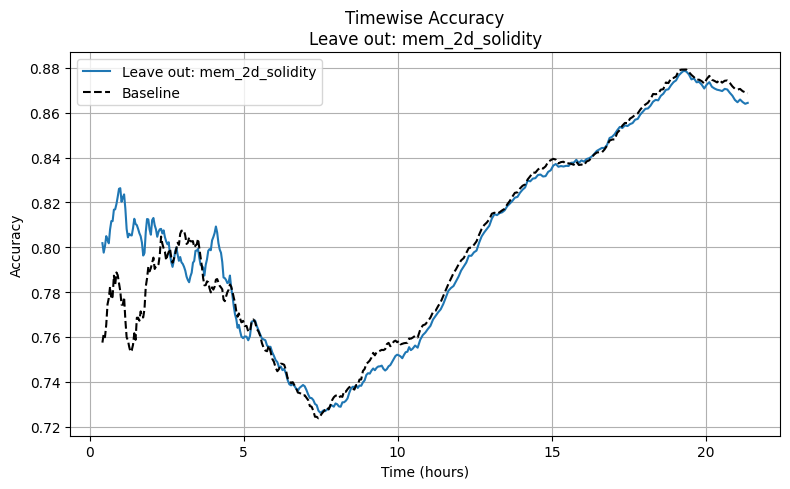

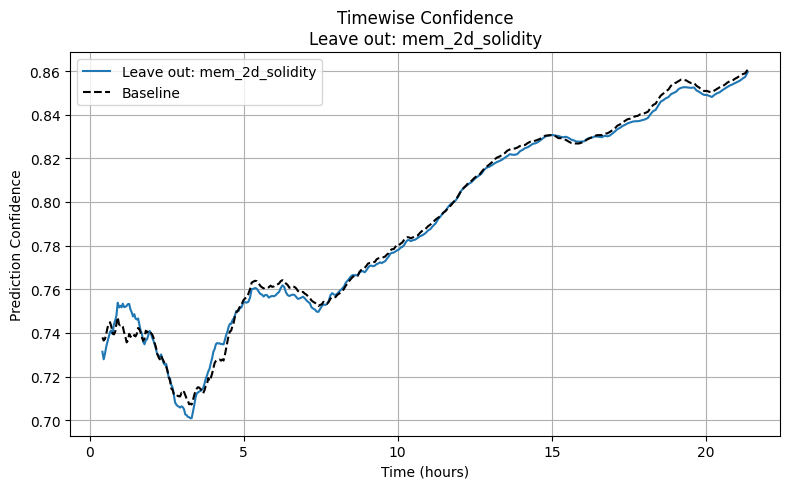

Processing feature: nuc_Cell_Axis_Z


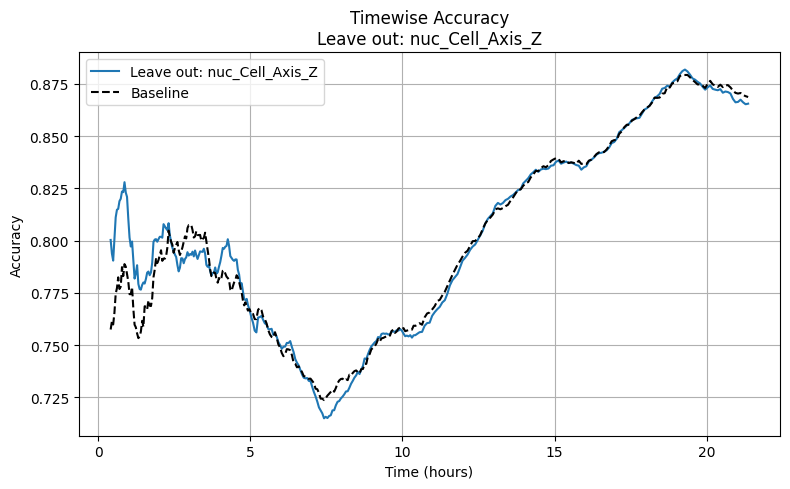

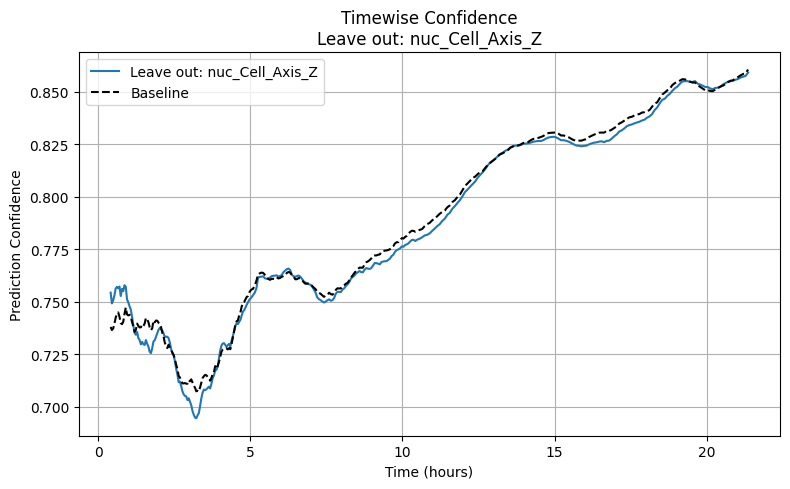

Processing feature: mem_2d_area


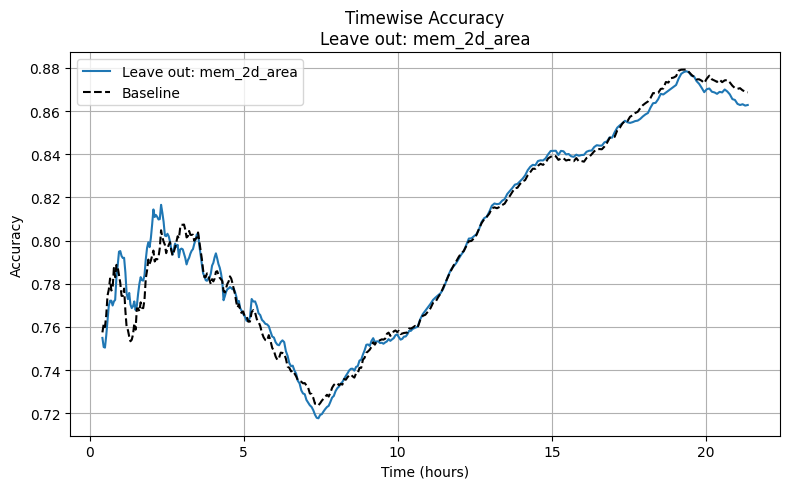

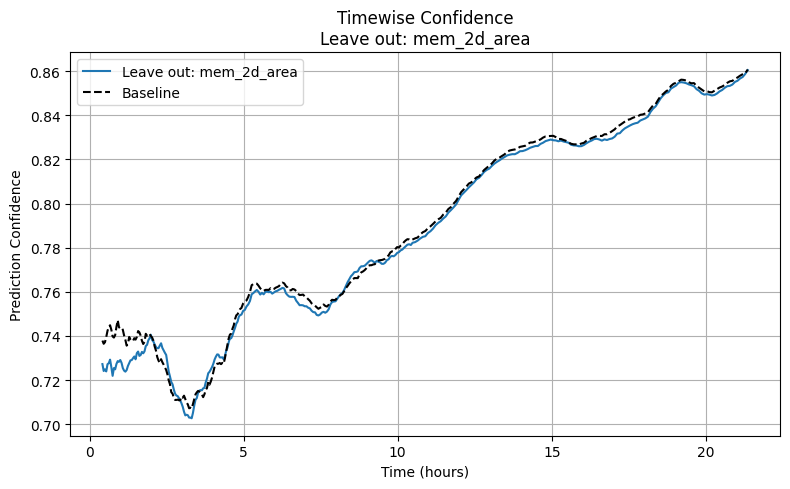

Processing feature: nuc_Eccentricity_Comp_First


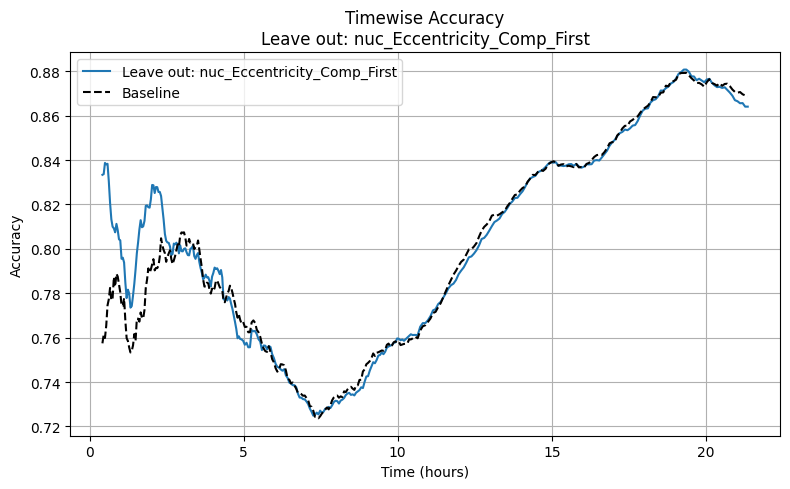

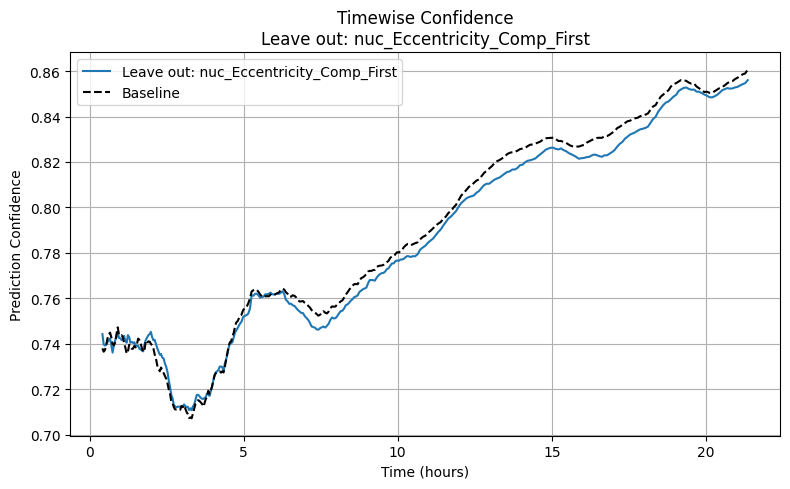

Processing feature: angle_difference_summed


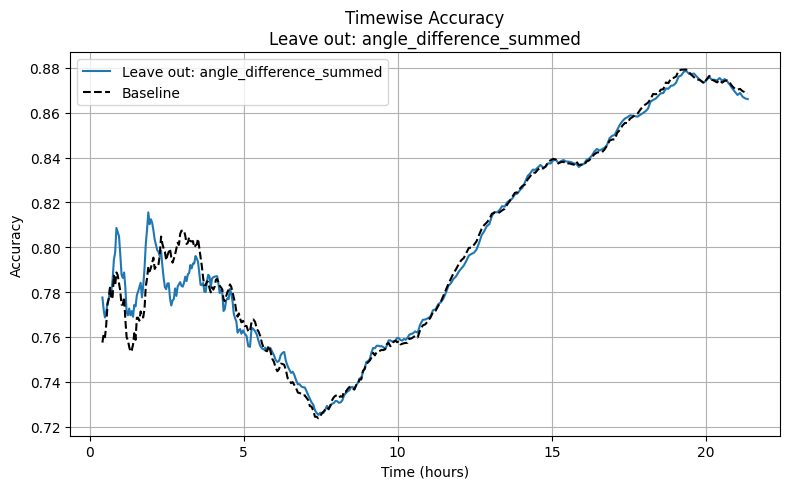

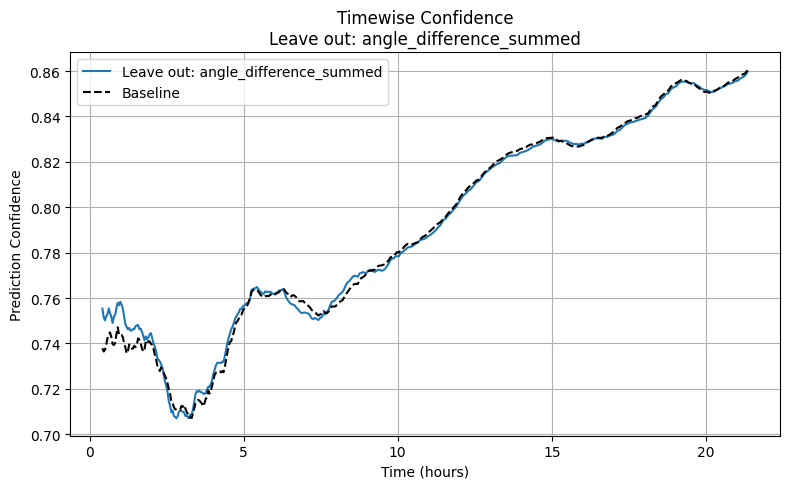

In [51]:
for feature in top_features:
    print(f"Processing feature: {feature}")
    
    # Drop feature
    X_train_reduced = train_independent_variables.drop(columns=[feature])
    X_test_reduced = test_independent_variables.drop(columns=[feature])
    
    # Train model
    model_reduced = xgb.XGBClassifier()
    model_reduced.fit(X_train_reduced, y_train)
    
    # Predict
    y_pred_reduced = model_reduced.predict(X_test_reduced)
    y_proba_reduced = model_reduced.predict_proba(X_test_reduced)
    
    # Accuracy per t
    temp_df = pd.DataFrame({
        't_hours': test_independent_variables['t_hours'],
        'is_correct': y_pred_reduced == y_test,
        'confidence': y_proba_reduced.max(axis=1)
    })

    # Timewise smoothed accuracy
    acc_df = (
        temp_df.groupby('t_hours')
        .agg(accuracy=('is_correct', 'mean'))
        .reset_index()
    )
    acc_df['smoothed'] = acc_df['accuracy'].rolling(window=20, center=True).mean()
    
    # Timewise smoothed confidence
    conf_df = (
        temp_df.groupby('t_hours')
        .agg(confidence=('confidence', 'mean'))
        .reset_index()
    )
    conf_df['smoothed'] = conf_df['confidence'].rolling(window=20, center=True).mean()
    
    # Plot Accuracy
    plt.figure(figsize=(8, 5))
    plt.plot(acc_df['t_hours'], acc_df['smoothed'], label=f'Leave out: {feature}')
    plt.plot(baseline_acc['t_hours'], baseline_acc['smoothed'], 'k--', label='Baseline')
    plt.xlabel('Time (hours)')
    plt.ylabel('Accuracy')
    plt.title(f'Timewise Accuracy\nLeave out: {feature}')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(f'plots_15_03/accuracy_leaveout_{feature}.pdf')
    plt.show()
    
    # Plot Confidence
    plt.figure(figsize=(8, 5))
    plt.plot(conf_df['t_hours'], conf_df['smoothed'], label=f'Leave out: {feature}')
    plt.plot(baseline_conf['t_hours'], baseline_conf['smoothed'], 'k--', label='Baseline')
    plt.xlabel('Time (hours)')
    plt.ylabel('Prediction Confidence')
    plt.title(f'Timewise Confidence\nLeave out: {feature}')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(f'plots_15_03/confidence_leaveout_{feature}.pdf')
    plt.show()


### Multiple iterations

In [42]:
def weighted_undersample_majorityclasses(data_frame, target_class, target_col, stratify_col, bins=10):
    # Bin continuous `t_hours` for stratification
    data_frame["t_hours_bin"] = pd.qcut(data_frame[stratify_col], q=bins, duplicates="drop")

    # Find class sizes
    class_counts = data_frame[target_col].value_counts()
    target_size = class_counts[target_class]  # Smallest class as reference

    # Perform weighted undersampling
    df_resampled = pd.concat([
        data_frame[data_frame[target_col] == c]
        .groupby("t_hours_bin", group_keys=False)
        .apply(lambda x: x.sample(frac=target_size / len(data_frame[data_frame[target_col] == c]))).reset_index(drop=True)
        for c in ['basal', 'goblet', 'mcc']]
    )

    return df_resampled.drop(columns=["t_hours_bin"]), target_size


def weighted_oversample_minorityclasses(data_frame, target_size, target_col, stratify_col, bins=10):
    df_encoded = data_frame[data_frame[target_col].isin(['ic', 'ssc'])]
    df_encoded["t_hours_bin"] = pd.qcut(df_encoded[stratify_col], q=bins, duplicates="drop")

    # Encode categorical variables if needed
    label_encoder = LabelEncoder()
    df_encoded[target_col] = label_encoder.fit_transform(df_encoded[target_col])

    # Select features and target
    X = df_encoded[['t_hours', 't_hours_bin'] + ordered_features]
    y = df_encoded[target_col]

    # Apply SMOTENC
    smote = SMOTENC(categorical_features=[X.columns.get_loc("t_hours_bin")], sampling_strategy={0 : target_size, 1 : target_size}, random_state=42)
    X_resampled, y_resampled = smote.fit_resample(X, y)

    # Convert back to DataFrame
    df_resampled = pd.DataFrame(X_resampled, columns=X.columns)
    df_resampled[target_col] = y_resampled

    df_resampled[target_col] = label_encoder.inverse_transform(df_resampled[target_col])

    return df_resampled.drop(columns=["t_hours_bin"])


In [219]:
def weighted_oversample_minorityclasses_withlog(data_frame, target_size, target_col, stratify_col, bins=10):
    df_encoded = data_frame[data_frame[target_col].isin(['ic', 'ssc'])].copy()
    df_encoded["t_hours_bin"] = pd.qcut(df_encoded[stratify_col], q=bins, duplicates="drop")

    # Encode
    label_encoder = LabelEncoder()
    df_encoded[target_col] = label_encoder.fit_transform(df_encoded[target_col])

    X = df_encoded[['t_hours', 't_hours_bin'] + ordered_features]
    y = df_encoded[target_col]

    smote = SMOTENC(
        categorical_features=[X.columns.get_loc("t_hours_bin")],
        sampling_strategy={0: target_size, 1: target_size},
        random_state=42
    )
    X_resampled, y_resampled = smote.fit_resample(X, y)

    # Identify synthetic samples
    n_original = len(X)
    n_resampled = len(X_resampled)
    n_synthetic = n_resampled - n_original
    synthetic_indices = list(range(n_original, n_resampled))

    # Convert back
    df_resampled = pd.DataFrame(X_resampled, columns=X.columns)
    df_resampled[target_col] = y_resampled
    df_resampled["source"] = "real"
    df_resampled.loc[synthetic_indices, "source"] = "synthetic"

    df_resampled[target_col] = label_encoder.inverse_transform(df_resampled[target_col])

    # Summary: count synthetic/real by class and bin
    summary = (
        df_resampled.groupby(["source", target_col, "t_hours_bin"])
        .size()
        .reset_index(name="count")
    )

    return df_resampled.drop(columns=["t_hours_bin"]), summary


In [178]:
from sklearn.metrics import classification_report, accuracy_score, precision_score, recall_score, f1_score
from sklearn.linear_model import LogisticRegression
import numpy as np

def run_single_iteration(train_df2, selected_features, class_labels, include_logreg=True, include_lofo=True, include_category_lofo = True, plot_tracks=False, cm_dict = defaultdict(list)):
    # Split into train/test
    train_tracks_df= pd.DataFrame(columns=train_df2.columns)
    test_tracks_df = pd.DataFrame(columns=train_df2.columns)

    for celltype in ['basal', 'goblet', 'mcc', 'ic', 'ssc']:
        data_frame = train_df2[train_df2['cell_type'] == celltype]
        track_counts = data_frame['Spot track ID relabelled'].value_counts()
        track_weights = track_counts / track_counts.sum()
        test_size = int(0.2 * len(track_counts))
        test_ids = np.random.choice(track_counts.index, size=test_size, replace=False, p=track_weights)
        train_ids = track_counts.index.difference(test_ids)

        train_df_celltype = data_frame[data_frame['Spot track ID relabelled'].isin(train_ids)]
        test_df_celltype = data_frame[data_frame['Spot track ID relabelled'].isin(test_ids)]

        train_tracks_df = pd.concat([train_tracks_df, train_df_celltype])
        test_tracks_df = pd.concat([test_tracks_df, test_df_celltype])

    # Balance training set
    train_tracks_df_balanced_undersampled, target_class_size = weighted_undersample_majorityclasses(
        train_tracks_df, target_class='mcc', target_col='cell_type', stratify_col='t_hours', bins=10
    )
    train_tracks_df_balanced_oversampled = weighted_oversample_minorityclasses(
        train_tracks_df, target_size=target_class_size, target_col='cell_type', stratify_col='t_hours', bins=10
    )

    train_tracks_df_balanced_undersampled_cropped = train_tracks_df_balanced_undersampled[
        train_tracks_df_balanced_oversampled.columns
    ]
    train_tracks_df_balanced = pd.concat([train_tracks_df_balanced_undersampled_cropped, train_tracks_df_balanced_oversampled])

    # Feature selection
    train_independent_variables = train_tracks_df_balanced[['t_hours'] + selected_features]
    test_independent_variables = test_tracks_df[['t_hours'] + selected_features]

    train_dependent_variables = train_tracks_df_balanced['cell_type']
    test_dependent_variables = test_tracks_df['cell_type']

    labelencoder = LabelEncoder()
    y_train = labelencoder.fit_transform(train_dependent_variables)
    y_test = labelencoder.transform(test_dependent_variables)

    # Train model
    model = xgb.XGBClassifier(objective='multi:softprob', num_class=5)
    model.fit(train_independent_variables, y_train)
    y_pred = model.predict(test_independent_variables)

    # Calculate metrics
    metrics = {
        'accuracy': accuracy_score(y_test, y_pred),
        'balanced_accuracy': balanced_accuracy_score(y_test, y_pred),
        'precision_macro': precision_score(y_test, y_pred, average='macro', zero_division=0),
        'recall_macro': recall_score(y_test, y_pred, average='macro', zero_division=0),
        'f1_macro': f1_score(y_test, y_pred, average='macro', zero_division=0)
    }

    # Confusion matrix
    cm = confusion_matrix(y_test, y_pred, labels=range(len(class_labels)))

    # Predict probabilities
    y_pred_proba = model.predict_proba(test_independent_variables)
    test_tracks_df = test_tracks_df.copy()  # to avoid SettingWithCopyWarning
    test_tracks_df['prediction_confidence'] = y_pred_proba.max(axis=1)

    # Group and average confidence
    confidence_df = (
        test_tracks_df.groupby(['t_hours', 'cell_type'])
        .agg(avg_confidence=('prediction_confidence', 'mean'))
        .reset_index()
    )

    # Apply smoothing and store
    window_size = 20
    smoothed_confidences = []
    for cell_type, group_df in confidence_df.groupby('cell_type'):
        group_df = group_df.sort_values('t_hours')
        group_df['smoothed_confidence'] = group_df['avg_confidence'].rolling(window=window_size, center=True).mean()
        group_df['cell_type'] = cell_type
        smoothed_confidences.append(group_df[['t_hours', 'cell_type', 'smoothed_confidence']])

    smoothed_conf_df = pd.concat(smoothed_confidences)

    # Add predicted labels to test dataframe
    test_tracks_df = test_tracks_df.copy()
    test_tracks_df['prediction_label'] = labelencoder.inverse_transform(y_pred)
    test_tracks_df['is_correct'] = test_tracks_df['cell_type'] == test_tracks_df['prediction_label']

    # Per-cell-type accuracy per timepoint
    accuracy_df = (
        test_tracks_df.groupby(['t_hours', 'cell_type'])
        .agg(accuracy=('is_correct', 'mean'))
        .reset_index()
    )

    # Overall accuracy per timepoint
    total_accuracy_df = (
        test_tracks_df.groupby('t_hours')
        .agg(total_accuracy=('is_correct', 'mean'))
        .reset_index()
    )

    test_tracks_df['prediction'] = y_pred
    test_tracks_df['prediction_label'] = labelencoder.inverse_transform(y_pred)

    # Bin time
    bin_size = 0.5
    test_tracks_df['t_bin'] = (test_tracks_df['t_hours'] // bin_size) * bin_size

    for t_bin, group in test_tracks_df.groupby("t_bin"):
        cm_t = confusion_matrix(group["cell_type"], group["prediction_label"], labels=class_labels)
        #cm_normalized = cm_t.astype('float') / cm_t.sum(axis=1)[:, np.newaxis]
        cm_dict[t_bin].append(cm_t)

    # Step: Aggregate to track level
    def most_frequent_label(labels):
        counts = labels.value_counts()
        #if counts.index[0] == "unknown" and len(counts) > 1:
        #    return counts.index[1]
        return counts.index[0]

    track_summary_auto = test_tracks_df.groupby('Spot track ID relabelled_auto').agg({
        'prediction_label': most_frequent_label
    }).reset_index()

    # Convert to dictionary
    pred_dict = dict(zip(track_summary_auto['Spot track ID relabelled_auto'], track_summary_auto['prediction_label']))

    test_tracks_df['prediction_trackwise'] = test_tracks_df['Spot track ID relabelled_auto'].map(pred_dict)

    # Compute confusion matrix
    cm_trackwise = confusion_matrix(test_tracks_df['cell_type'], test_tracks_df['prediction_trackwise'], labels=class_labels)

    if include_logreg:
        # Train model
        model_logreg = LogisticRegression(
            solver='saga',
            penalty='l1',
            multi_class='multinomial',
            max_iter=1000
        )
        model_logreg.fit(train_independent_variables, y_train)
        y_pred_logreg = model_logreg.predict(test_independent_variables)

        # Calculate metrics
        metrics_logreg = {
            'accuracy': accuracy_score(y_test, y_pred_logreg),
            'balanced_accuracy': balanced_accuracy_score(y_test, y_pred_logreg),
            'precision_macro': precision_score(y_test, y_pred_logreg, average='macro', zero_division=0),
            'recall_macro': recall_score(y_test, y_pred_logreg, average='macro', zero_division=0),
            'f1_macro': f1_score(y_test, y_pred_logreg, average='macro', zero_division=0)
        }

        # Confusion matrix
        cm_logreg = confusion_matrix(y_test, y_pred_logreg, labels=range(len(class_labels)))

        test_tracks_df['prediction_logreg'] = y_pred_logreg
        test_tracks_df['prediction_label_logreg'] = labelencoder.inverse_transform(y_pred_logreg)

        track_summary_auto_logreg = test_tracks_df.groupby('Spot track ID relabelled_auto').agg({
            'prediction_label_logreg': most_frequent_label
        }).reset_index()

        # Convert to dictionary
        pred_dict_logreg = dict(zip(track_summary_auto_logreg['Spot track ID relabelled_auto'], track_summary_auto_logreg['prediction_label_logreg']))

        test_tracks_df['prediction_trackwise_logreg'] = test_tracks_df['Spot track ID relabelled_auto'].map(pred_dict_logreg)

        cm_trackwise_logreg = confusion_matrix(test_tracks_df['cell_type'], test_tracks_df['prediction_trackwise_logreg'], labels=class_labels)
    else:
        model_logreg = None
        cm_logreg = None
        cm_trackwise_logreg = None
        metrics_logreg = None

    if include_lofo:
        baseline_overall_acc = accuracy_score(y_test, y_pred)
        baseline_balanced_acc = balanced_accuracy_score(y_test, y_pred)

        # Calculate baseline class-wise accuracy from confusion matrix
        baseline_cm = confusion_matrix(y_test, y_pred)
        baseline_classwise_acc = np.diag(baseline_cm) / baseline_cm.sum(axis=1)

        # Prepare results storage for decimal changes in accuracies
        results_matrix = pd.DataFrame(index=train_independent_variables.columns, columns=['Overall Acc', 'Balanced Acc'] + list(class_labels))

        lofo_accuracy_curves = {}
        lofo_confidence_curves = {}


        # Leave-one-feature-out loop
        for feature in tqdm(train_independent_variables.columns):
            # Remove one feature and retrain
            X_train_reduced = train_independent_variables.drop(columns=[feature])
            X_test_reduced = test_independent_variables.drop(columns=[feature])
            
            # Train model on reduced features
            model_reduced = xgb.XGBClassifier()
            model_reduced.fit(X_train_reduced, y_train)
            y_pred_reduced = model_reduced.predict(X_test_reduced)

            # Create temp DataFrame to store test results
            temp_df = test_tracks_df.copy()
            temp_df['prediction_label'] = labelencoder.inverse_transform(y_pred_reduced)
            temp_df['is_correct'] = temp_df['cell_type'] == temp_df['prediction_label']

            # --- Accuracy over time ---
            lofo_accuracy_df = (
                temp_df.groupby(['t_hours', 'cell_type'])
                .agg(accuracy=('is_correct', 'mean'))
                .reset_index()
            )

            # --- Confidence over time ---
            y_pred_proba_reduced = model_reduced.predict_proba(X_test_reduced)
            temp_df['prediction_confidence'] = y_pred_proba_reduced.max(axis=1)

            confidence_df = (
                temp_df.groupby(['t_hours', 'cell_type'])
                .agg(avg_confidence=('prediction_confidence', 'mean'))
                .reset_index()
            )

            # --- Smooth confidence ---
            smoothed = []
            for cell_type, group_df in confidence_df.groupby('cell_type'):
                group_df = group_df.sort_values('t_hours')
                group_df['smoothed_confidence'] = group_df['avg_confidence'].rolling(window=20, center=True).mean()
                group_df['cell_type'] = cell_type
                smoothed.append(group_df[['t_hours', 'cell_type', 'smoothed_confidence']])

            lofo_conf_df = pd.concat(smoothed)

            # --- Store results ---
            lofo_accuracy_curves[feature] = lofo_accuracy_df
            lofo_confidence_curves[feature] = lofo_conf_df

            
            # Calculate new accuracies after feature removal
            new_overall_acc = accuracy_score(y_test, y_pred_reduced)
            new_balanced_acc = balanced_accuracy_score(y_test, y_pred_reduced)
            
            # Compute new class-wise accuracy from confusion matrix
            new_cm = confusion_matrix(y_test, y_pred_reduced)
            new_classwise_acc = np.diag(new_cm) / new_cm.sum(axis=1)
            
            # Calculate decimal change for each accuracy metric and store in matrix
            for i, class_label in enumerate(class_labels):
                results_matrix.loc[feature, class_label] = new_classwise_acc[i] - baseline_classwise_acc[i]
            
            # Store overall accuracy changes
            results_matrix.loc[feature, 'Overall Acc'] = new_overall_acc - baseline_overall_acc
            results_matrix.loc[feature, 'Balanced Acc'] = new_balanced_acc - baseline_balanced_acc

        # Convert results to numeric values (for plotting purposes)
        results_matrix = results_matrix.astype(float)
    else:
        lofo_accuracy_curves = None
        lofo_confidence_curves = None
        results_matrix = None

    if include_category_lofo:
        # === Baseline metrics with all features ===
        baseline_overall_acc = accuracy_score(y_test, y_pred)
        baseline_balanced_acc = balanced_accuracy_score(y_test, y_pred)

        baseline_cm = confusion_matrix(y_test, y_pred)
        baseline_classwise_acc = np.diag(baseline_cm) / baseline_cm.sum(axis=1)

        # === Storage ===
        category_results_matrix = pd.DataFrame(index=feature_categories.keys(), columns=['Overall Acc', 'Balanced Acc'] + list(class_labels))

        # === Category-wise removal loop ===
        for category, feature_list in tqdm(feature_categories.items(), desc="Leave-One-Category-Out"):
            print(f"Removing category: {category}")

            # Drop entire category
            X_train_reduced = train_independent_variables.drop(columns=feature_list, errors='ignore')
            X_test_reduced = test_independent_variables.drop(columns=feature_list, errors='ignore')

            # Retrain model
            model_reduced = xgb.XGBClassifier()
            model_reduced.fit(X_train_reduced, y_train)
            y_pred_reduced = model_reduced.predict(X_test_reduced)


            # === Accuracy metrics ===
            new_overall_acc = accuracy_score(y_test, y_pred_reduced)
            new_balanced_acc = balanced_accuracy_score(y_test, y_pred_reduced)
            new_cm = confusion_matrix(y_test, y_pred_reduced)
            new_classwise_acc = np.diag(new_cm) / new_cm.sum(axis=1)

            for i, class_label in enumerate(class_labels):
                category_results_matrix.loc[category, class_label] = new_classwise_acc[i] - baseline_classwise_acc[i]

            category_results_matrix.loc[category, 'Overall Acc'] = new_overall_acc - baseline_overall_acc
            category_results_matrix.loc[category, 'Balanced Acc'] = new_balanced_acc - baseline_balanced_acc

        # Final conversion for plotting
        category_results_matrix = category_results_matrix.astype(float)
    else:
        category_results_matrix = None
    
    if plot_tracks:
        for celltype in test_tracks_df['cell_type'].unique():
            # Convert the unique TrackMate Track ID values to a list before sampling
            celltype_ids = test_tracks_df[test_tracks_df['cell_type'] == celltype]['Spot track ID relabelled'].unique()
            celltype_ids_to_plot = random.sample(list(celltype_ids), min(10, len(celltype_ids)))

            celltype_df = test_tracks_df[test_tracks_df['Spot track ID relabelled'].isin(celltype_ids_to_plot)]

            # Convert Tracklet ID to numeric for plotting
            celltype_df = convert_tracklet_to_numeric(celltype_df)

            plot_predictions(celltype_df, celltype)

    iteration_cm_by_time = {}

    return (
    metrics,
    metrics_logreg,
    cm,
    cm_logreg,
    smoothed_conf_df,
    accuracy_df,
    total_accuracy_df,
    iteration_cm_by_time,
    cm_trackwise,
    cm_trackwise_logreg,
    results_matrix,
    lofo_accuracy_curves,
    lofo_confidence_curves,
    category_results_matrix,
    cm_dict
    )



### plotting iteration results

In [179]:
import matplotlib as mpl

# Set global font style and sizes         
mpl.rcParams['font.size'] = 16                 # Base font size
mpl.rcParams['axes.titlesize'] = 16            # Title font size
mpl.rcParams['axes.labelsize'] = 16            # Axis label font size
mpl.rcParams['xtick.labelsize'] = 16           # X-tick font size
mpl.rcParams['ytick.labelsize'] = 16           # Y-tick font size
mpl.rcParams['legend.fontsize'] = 14            # Legend font size
mpl.rcParams['figure.titlesize'] = 16          # Figure title font size

In [180]:
from imblearn.over_sampling import SMOTENC

In [191]:
from collections import defaultdict

use_logreg = False  # Set to False to skip logistic regression
use_lofo = True
use_category_lofo = False
plot_tracks = False

n_iterations = 20
all_metrics = []
all_conf_matrices = []
all_smoothed_confidences = []
all_accuracy_dfs = []
all_total_accuracy_dfs = []
all_cm_by_time = []  # One dict per iteration
all_trackwise_confusion_matrices = []
raw_cm_by_time = defaultdict(list)
if use_lofo:
    all_lofo_accuracy_curves = []
    all_lofo_confidence_curves = []
if use_logreg:
    all_metrics_logreg = []
    all_conf_matrices_logreg = []
    all_trackwise_confusion_matrices_logreg = []

class_labels = ['basal', 'goblet', 'ic', 'mcc', 'ssc'] 
cell_type_dict = {'basal' : 0, 'goblet' : 1, 'ic' : 2, 'mcc' : 3, 'ssc' : 4}
num_classes = 5


# Initialize cumulative results matrix
feature_list = ordered_features + ['t_hours']
if use_lofo:
    metric_columns = ['Overall Acc', 'Balanced Acc'] + list(class_labels)
    cumulative_lofo_df = pd.DataFrame(0.0, index=feature_list, columns=metric_columns)

    valid_lofo_iterations = 0

if use_category_lofo:
    metric_columns = ['Overall Acc', 'Balanced Acc'] + list(class_labels)
    cumulative_category_lofo_df = pd.DataFrame(0.0, index=feature_categories.keys(), columns=metric_columns)

    valid_category_lofo_iterations = 0

for i in range(n_iterations):
    print(f"Running iteration {i+1}/{n_iterations}")
    
    metrics, metrics_logreg, cm, cm_logreg, smoothed_conf_df, accuracy_df, total_accuracy_df, cm_by_time, cm_trackwise, cm_trackwise_logreg, lofo_matrix, lofo_accuracy_curves, lofo_confidence_curves, category_lofo_matrix, raw_cm_by_time = run_single_iteration(train_df2, ordered_features, class_labels, include_logreg=use_logreg, include_lofo=use_lofo, include_category_lofo=use_category_lofo, plot_tracks=plot_tracks, cm_dict = raw_cm_by_time)
    if lofo_matrix is not None:  # Optional: Add try-except if necessary
        cumulative_lofo_df += lofo_matrix.astype(float)
        valid_lofo_iterations += 1
    if category_lofo_matrix is not None:
        cumulative_category_lofo_df += category_lofo_matrix.astype(float)
        valid_category_lofo_iterations += 1
    
    
    all_metrics.append(metrics)
    all_conf_matrices.append(cm)
    all_smoothed_confidences.append(smoothed_conf_df)
    all_accuracy_dfs.append(accuracy_df)
    all_total_accuracy_dfs.append(total_accuracy_df)
    all_cm_by_time.append(cm_by_time)
    all_trackwise_confusion_matrices.append(cm_trackwise)
    if use_lofo:
        all_lofo_accuracy_curves.append(lofo_accuracy_curves)
        all_lofo_confidence_curves.append(lofo_confidence_curves)
    if use_logreg:
        all_metrics_logreg.append(metrics_logreg)
        all_conf_matrices_logreg.append(cm_logreg)
        all_trackwise_confusion_matrices_logreg.append(cm_trackwise_logreg)

Running iteration 1/20


C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded["t_hours_bin"] = pd.qcut(df_encoded[stratify_col], q=bins, duplicates="drop")
C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded[target_col] = label_encoder.fit_transform(df_encoded[target_col])
100%|██████████| 38/38 [03:45<00:00,  5.93s/it]


Running iteration 2/20


C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded["t_hours_bin"] = pd.qcut(df_encoded[stratify_col], q=bins, duplicates="drop")
C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded[target_col] = label_encoder.fit_transform(df_encoded[target_col])
100%|██████████| 38/38 [03:46<00:00,  5.97s/it]


Running iteration 3/20


C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded["t_hours_bin"] = pd.qcut(df_encoded[stratify_col], q=bins, duplicates="drop")
C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded[target_col] = label_encoder.fit_transform(df_encoded[target_col])
100%|██████████| 38/38 [03:44<00:00,  5.92s/it]


Running iteration 4/20


C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded["t_hours_bin"] = pd.qcut(df_encoded[stratify_col], q=bins, duplicates="drop")
C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded[target_col] = label_encoder.fit_transform(df_encoded[target_col])
100%|██████████| 38/38 [03:46<00:00,  5.96s/it]


Running iteration 5/20


C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded["t_hours_bin"] = pd.qcut(df_encoded[stratify_col], q=bins, duplicates="drop")
C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded[target_col] = label_encoder.fit_transform(df_encoded[target_col])
100%|██████████| 38/38 [03:43<00:00,  5.87s/it]


Running iteration 6/20


C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded["t_hours_bin"] = pd.qcut(df_encoded[stratify_col], q=bins, duplicates="drop")
C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded[target_col] = label_encoder.fit_transform(df_encoded[target_col])
100%|██████████| 38/38 [03:42<00:00,  5.86s/it]


Running iteration 7/20


C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded["t_hours_bin"] = pd.qcut(df_encoded[stratify_col], q=bins, duplicates="drop")
C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded[target_col] = label_encoder.fit_transform(df_encoded[target_col])
100%|██████████| 38/38 [03:41<00:00,  5.82s/it]


Running iteration 8/20


C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded["t_hours_bin"] = pd.qcut(df_encoded[stratify_col], q=bins, duplicates="drop")
C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded[target_col] = label_encoder.fit_transform(df_encoded[target_col])
100%|██████████| 38/38 [03:46<00:00,  5.95s/it]


Running iteration 9/20


C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded["t_hours_bin"] = pd.qcut(df_encoded[stratify_col], q=bins, duplicates="drop")
C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded[target_col] = label_encoder.fit_transform(df_encoded[target_col])
100%|██████████| 38/38 [03:54<00:00,  6.18s/it]


Running iteration 10/20


C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded["t_hours_bin"] = pd.qcut(df_encoded[stratify_col], q=bins, duplicates="drop")
C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded[target_col] = label_encoder.fit_transform(df_encoded[target_col])
100%|██████████| 38/38 [03:49<00:00,  6.04s/it]


Running iteration 11/20


C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded["t_hours_bin"] = pd.qcut(df_encoded[stratify_col], q=bins, duplicates="drop")
C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded[target_col] = label_encoder.fit_transform(df_encoded[target_col])
100%|██████████| 38/38 [03:44<00:00,  5.91s/it]


Running iteration 12/20


C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded["t_hours_bin"] = pd.qcut(df_encoded[stratify_col], q=bins, duplicates="drop")
C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded[target_col] = label_encoder.fit_transform(df_encoded[target_col])
100%|██████████| 38/38 [03:43<00:00,  5.89s/it]


Running iteration 13/20


C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded["t_hours_bin"] = pd.qcut(df_encoded[stratify_col], q=bins, duplicates="drop")
C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded[target_col] = label_encoder.fit_transform(df_encoded[target_col])
100%|██████████| 38/38 [03:39<00:00,  5.77s/it]


Running iteration 14/20


C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded["t_hours_bin"] = pd.qcut(df_encoded[stratify_col], q=bins, duplicates="drop")
C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded[target_col] = label_encoder.fit_transform(df_encoded[target_col])
100%|██████████| 38/38 [03:33<00:00,  5.63s/it]


Running iteration 15/20


C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded["t_hours_bin"] = pd.qcut(df_encoded[stratify_col], q=bins, duplicates="drop")
C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded[target_col] = label_encoder.fit_transform(df_encoded[target_col])
100%|██████████| 38/38 [03:36<00:00,  5.69s/it]


Running iteration 16/20


C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded["t_hours_bin"] = pd.qcut(df_encoded[stratify_col], q=bins, duplicates="drop")
C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded[target_col] = label_encoder.fit_transform(df_encoded[target_col])
100%|██████████| 38/38 [03:38<00:00,  5.74s/it]


Running iteration 17/20


C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded["t_hours_bin"] = pd.qcut(df_encoded[stratify_col], q=bins, duplicates="drop")
C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded[target_col] = label_encoder.fit_transform(df_encoded[target_col])
100%|██████████| 38/38 [03:45<00:00,  5.94s/it]


Running iteration 18/20


C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded["t_hours_bin"] = pd.qcut(df_encoded[stratify_col], q=bins, duplicates="drop")
C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded[target_col] = label_encoder.fit_transform(df_encoded[target_col])
100%|██████████| 38/38 [03:41<00:00,  5.84s/it]


Running iteration 19/20


C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded["t_hours_bin"] = pd.qcut(df_encoded[stratify_col], q=bins, duplicates="drop")
C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded[target_col] = label_encoder.fit_transform(df_encoded[target_col])
100%|██████████| 38/38 [03:45<00:00,  5.94s/it]


Running iteration 20/20


C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded["t_hours_bin"] = pd.qcut(df_encoded[stratify_col], q=bins, duplicates="drop")
C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded[target_col] = label_encoder.fit_transform(df_encoded[target_col])
100%|██████████| 38/38 [03:48<00:00,  6.02s/it]


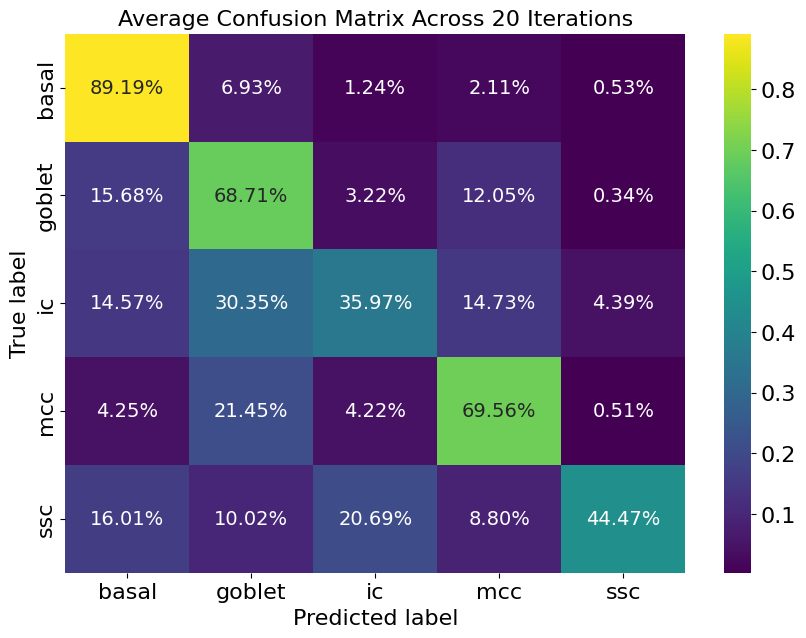

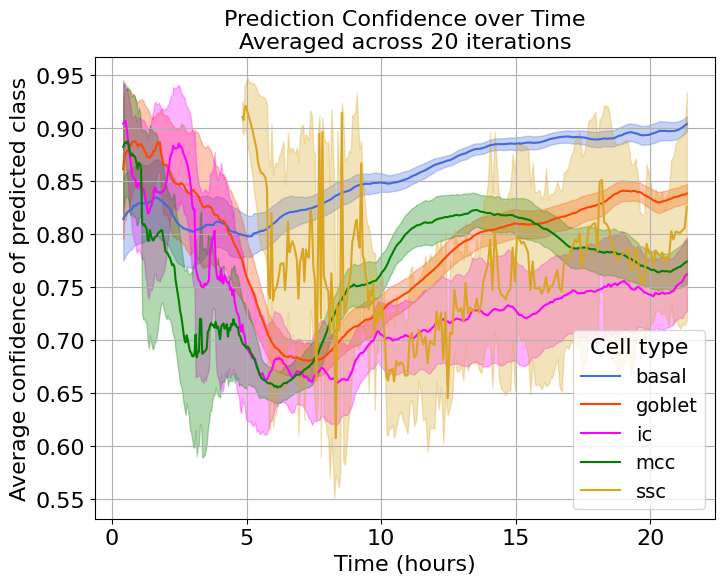

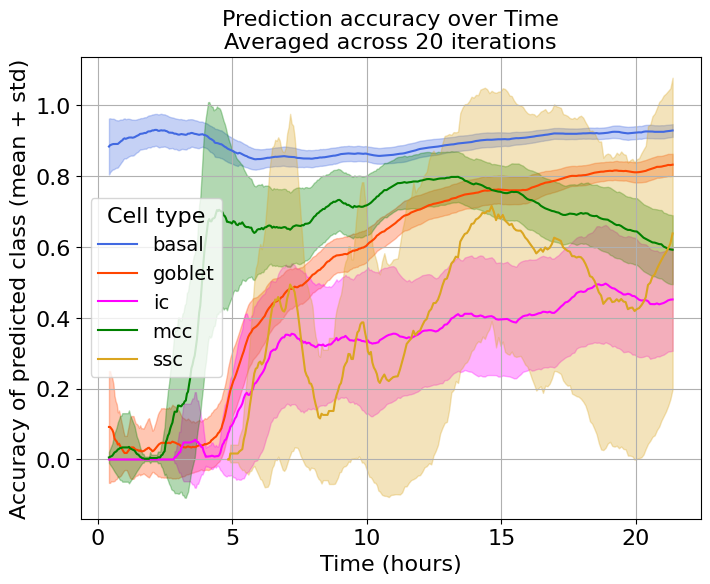

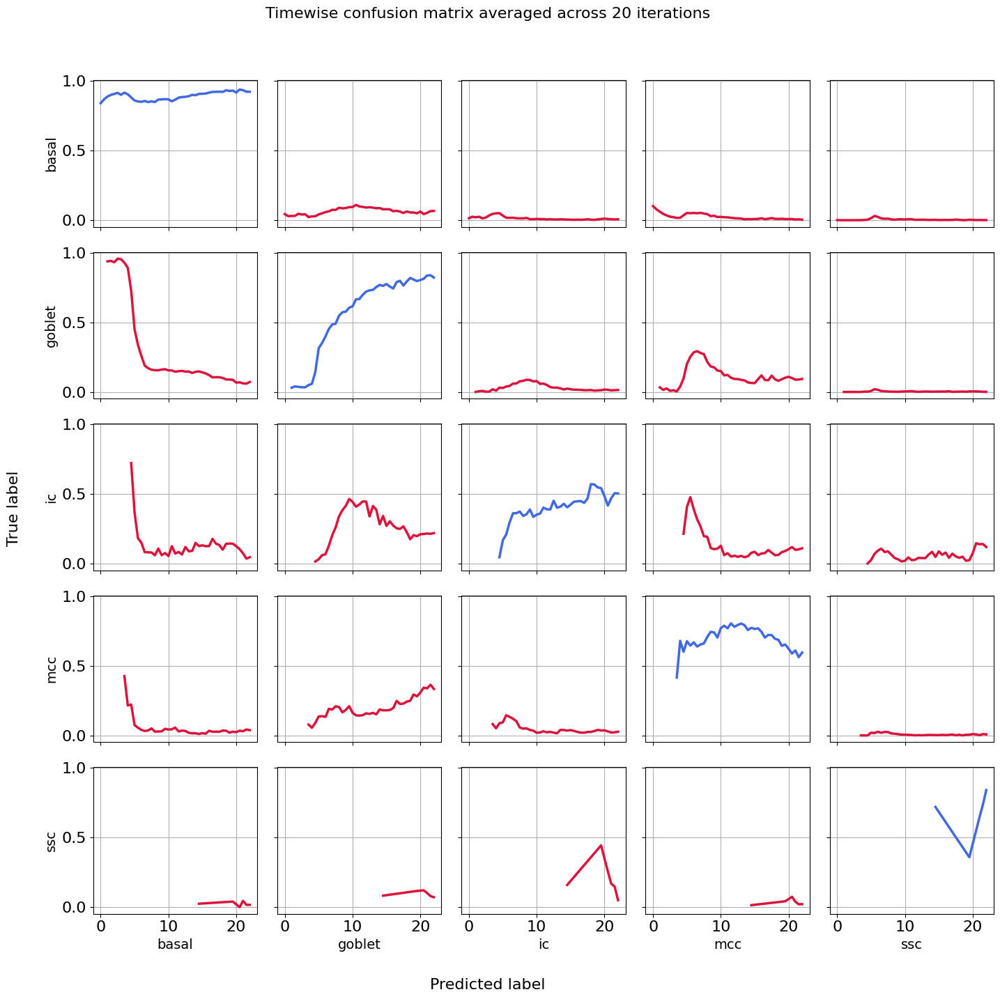

C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1146550046.py:217: RuntimeWarning: invalid value encountered in divide
  normalized_cm = summed_cm / summed_cm.sum(axis=1, keepdims=True)
C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1146550046.py:221: RuntimeWarning: invalid value encountered in divide
  cm.astype(float) / cm.sum(axis=1, keepdims=True) for cm in cm_list
c:\Users\ghr283\Anaconda3\envs\kapoorlabsenv3\lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


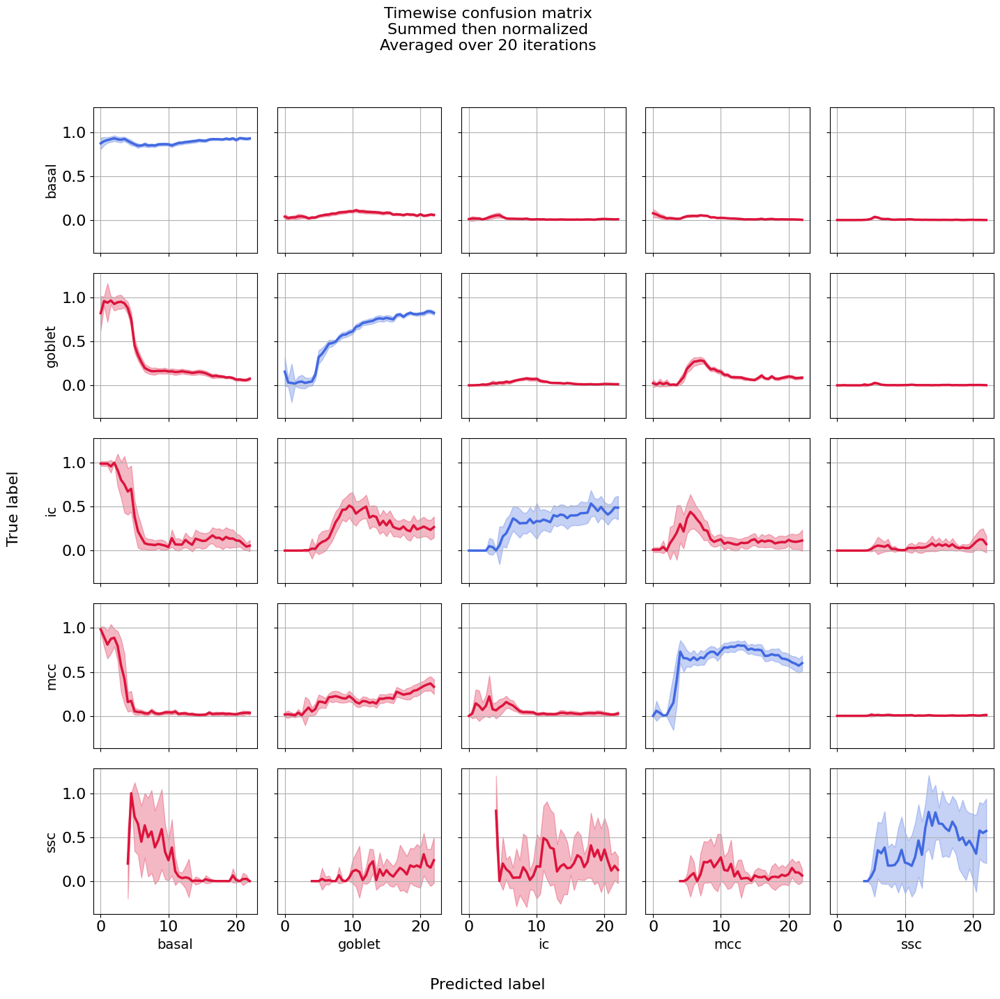

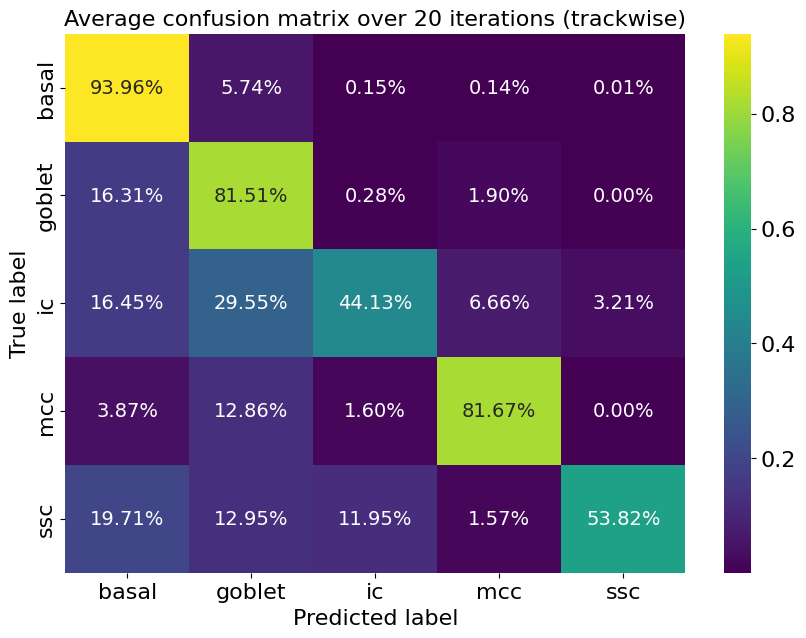

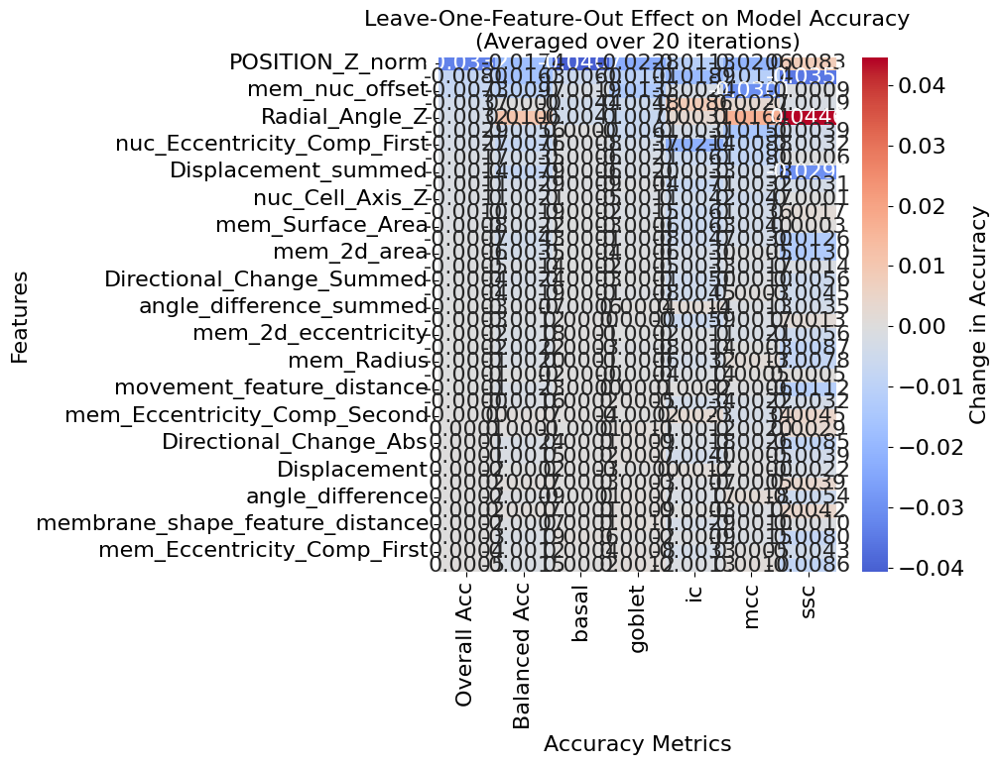

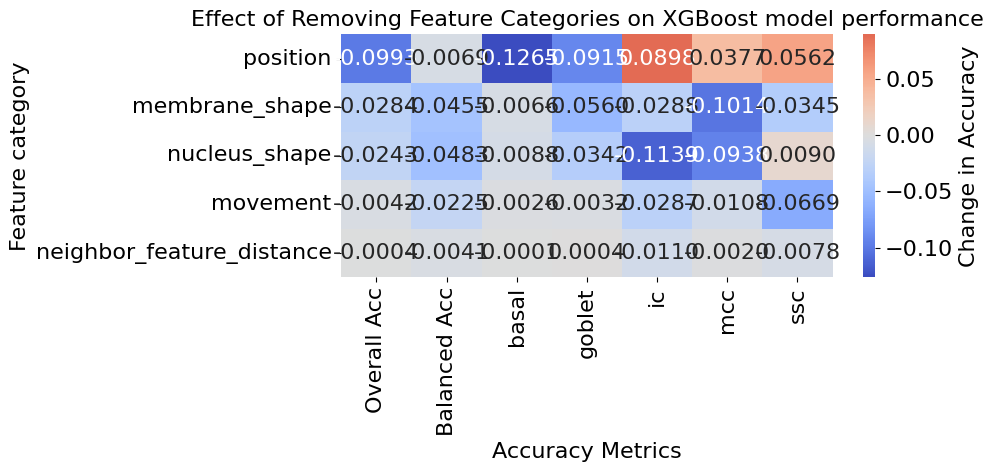

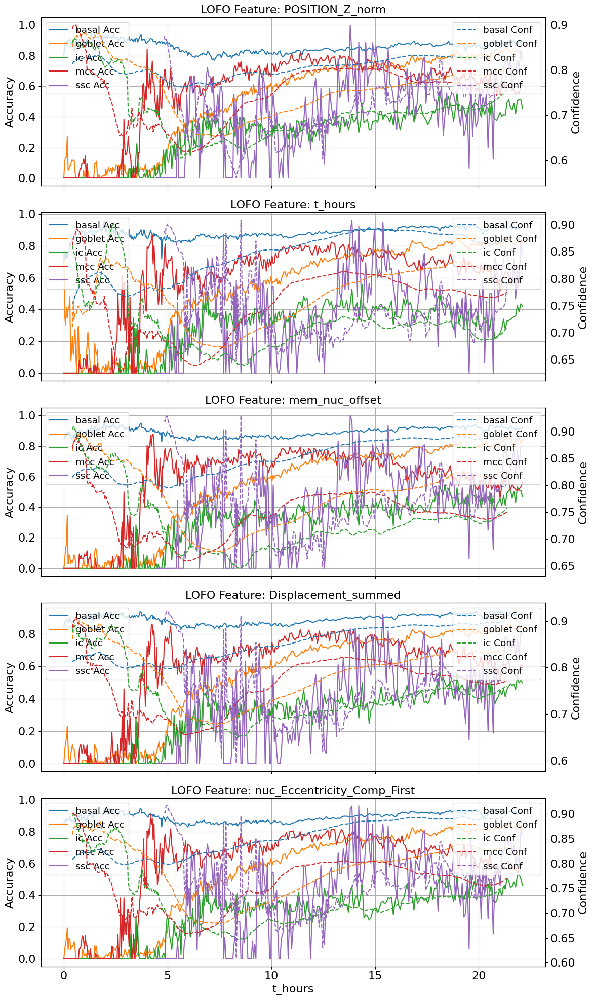

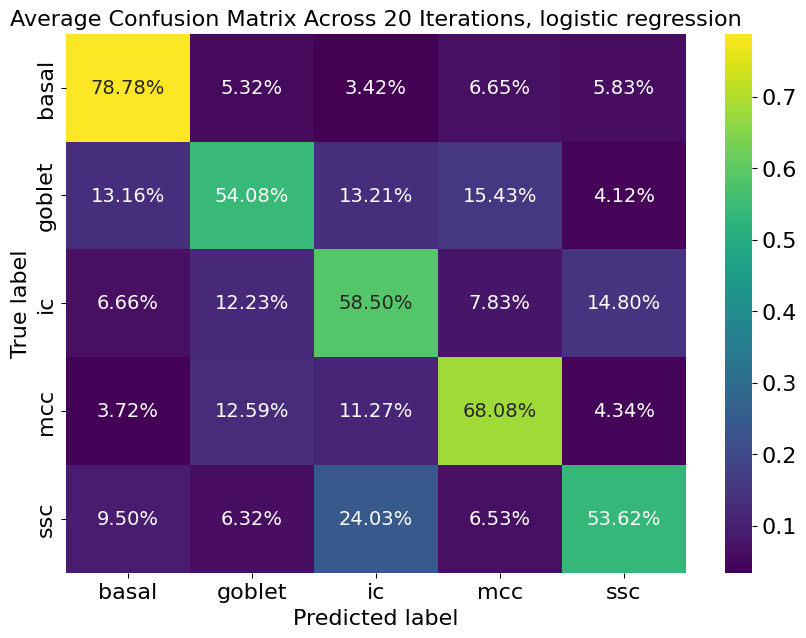

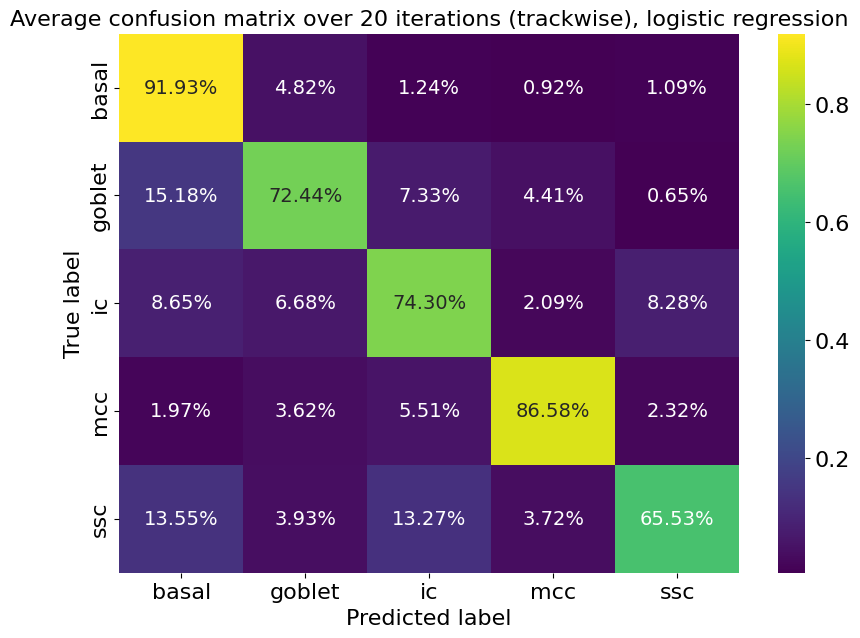

=== Mean Metrics Across Iterations, XGBoost ===
accuracy             0.804528
balanced_accuracy    0.620526
precision_macro      0.527153
recall_macro         0.620526
f1_macro             0.555798
dtype: float64
=== Mean Metrics Across Iterations, Logistic regression ===
accuracy             0.701471
balanced_accuracy    0.623962
precision_macro      0.449205
recall_macro         0.623962
f1_macro             0.452405
dtype: float64


In [196]:
colors_dict = {'basal' : 'royalblue', 'goblet' : 'orangered', 'ic' : 'magenta', 'mcc' : 'green', 'ssc' : 'goldenrod'}

# Metrics summary
metrics_df = pd.DataFrame(all_metrics)
mean_metrics = metrics_df.mean()
std_metrics = metrics_df.std()

if use_logreg:
    # Metrics summary
    metrics_df_logreg = pd.DataFrame(all_metrics_logreg)
    mean_metrics_logreg = metrics_df_logreg.mean()
    std_metrics_logreg = metrics_df_logreg.std()

# Average confusion matrix (normalized)
avg_cm = np.mean(all_conf_matrices, axis=0)
avg_cm_normalized = avg_cm.astype('float') / avg_cm.sum(axis=1)[:, np.newaxis]

# Combine all confidence curves
combined_conf_df = pd.concat(all_smoothed_confidences)

# Average across iterations
average_confidence_over_time = (
    combined_conf_df
    .groupby(['t_hours', 'cell_type'])
    .agg(avg_smoothed_conf=('smoothed_confidence', 'mean'))
    .reset_index()
)

# Combine per-iteration accuracy
combined_accuracy_df = pd.concat(all_accuracy_dfs)
combined_total_accuracy_df = pd.concat(all_total_accuracy_dfs)

# Average over iterations
average_accuracy_df = (
    combined_accuracy_df
    .groupby(['t_hours', 'cell_type'])
    .agg(avg_accuracy=('accuracy', 'mean'))
    .reset_index()
)

average_total_accuracy_df = (
    combined_total_accuracy_df
    .groupby('t_hours')
    .agg(avg_total_accuracy=('total_accuracy', 'mean'))
    .reset_index()
)

# Prepare structure to sum across iterations
#aggregated_cm_by_time = defaultdict(lambda: np.zeros((num_classes, num_classes)))

#for cm_by_time in all_cm_by_time:
#    for t_bin, cm in cm_by_time.items():
#        aggregated_cm_by_time[t_bin] += cm  # Add confusion matrices per bin

# Average them
#for t_bin in aggregated_cm_by_time:
#    aggregated_cm_by_time[t_bin] /= n_iterations

# Turn averaged CM into a time series DataFrame
#time_series_df = []

#for t_bin, cm in aggregated_cm_by_time.items():
#    for i, true_class in enumerate(class_labels):
#        for j, pred_class in enumerate(class_labels):
#            time_series_df.append({
#                "Time": t_bin,
#                "True Class": true_class,
#                "Predicted Class": pred_class,
#                "Value": cm[i, j]
#            })

#time_series_df = pd.DataFrame(time_series_df)

# Step 1: Sum all confusion matrices
summed_cm = np.sum(all_trackwise_confusion_matrices, axis=0)

# Step 2: Normalize by row (i.e., true class) to get proportions
avg_trackwise_cm = summed_cm.astype(float) / summed_cm.sum(axis=1, keepdims=True)



average_lofo_df = cumulative_lofo_df / valid_lofo_iterations

# Average category-wise LOFO results
average_category_lofo_df = cumulative_category_lofo_df / valid_category_lofo_iterations

# Plot averaged confusion matrix
plt.figure(figsize=(10, 7))
sns.heatmap(avg_cm_normalized, annot=True, fmt='.2%', cmap='viridis',
            xticklabels=class_labels, yticklabels=class_labels, annot_kws={"size": 14})
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title(f'Average Confusion Matrix Across {n_iterations} Iterations')
plt.show()

# Compute mean and std of smoothed confidence
confidence_stats_df = (
    combined_conf_df
    .groupby(['t_hours', 'cell_type'])['smoothed_confidence']
    .agg(['mean', 'std'])
    .reset_index()
    .rename(columns={'mean': 'avg_smoothed_conf', 'std': 'std_smoothed_conf'})
)

# Plot with confidence intervals
plt.figure(figsize=(8, 6))

for cell_type, group_df in confidence_stats_df.groupby('cell_type'):
    plt.plot(group_df['t_hours'], group_df['avg_smoothed_conf'], label=cell_type, color=colors_dict[cell_type])
    plt.fill_between(
        group_df['t_hours'],
        group_df['avg_smoothed_conf'] - group_df['std_smoothed_conf'],
        group_df['avg_smoothed_conf'] + group_df['std_smoothed_conf'],
        alpha=0.3,
        color=colors_dict[cell_type]
    )

plt.xlabel('Time (hours)')
plt.ylabel('Average confidence of predicted class')
plt.title(f'Prediction Confidence over Time\nAveraged across {n_iterations} iterations')
plt.legend(title='Cell type')
plt.grid(True)
plt.show()


# Plot average timewise prediction accuracy
# Compute mean and std
accuracy_stats_df = (
    combined_accuracy_df
    .groupby(['t_hours', 'cell_type'])['accuracy']
    .agg(['mean', 'std'])
    .reset_index()
    .rename(columns={'mean': 'avg_accuracy', 'std': 'std_accuracy'})
)

# Apply smoothing
window_size = 20
plt.figure(figsize=(8, 6))

for cell_type, group_df in accuracy_stats_df.groupby('cell_type'):
    group_df = group_df.sort_values('t_hours')
    group_df['smoothed_accuracy'] = group_df['avg_accuracy'].rolling(window=window_size, center=True).mean()
    group_df['smoothed_std'] = group_df['std_accuracy'].rolling(window=window_size, center=True).mean()
    
    plt.plot(group_df['t_hours'], group_df['smoothed_accuracy'], label=cell_type, color=colors_dict[cell_type])
    plt.fill_between(
        group_df['t_hours'],
        group_df['smoothed_accuracy'] - group_df['smoothed_std'],
        group_df['smoothed_accuracy'] + group_df['smoothed_std'],
        alpha=0.3,
        color=colors_dict[cell_type]
    )

plt.xlabel('Time (hours)')
plt.ylabel('Accuracy of predicted class (mean + std)')
plt.title(f'Prediction accuracy over Time\nAveraged across {n_iterations} iterations')
plt.legend(title='Cell type')
plt.grid(True)
plt.show()

#Plot average timewise confusion matrix
fig, axes = plt.subplots(num_classes, num_classes, figsize=(15, 15), sharex=True, sharey=True)

for i, true_class in enumerate(class_labels):
    for j, pred_class in enumerate(class_labels):
        ax = axes[i, j]
        plot_data = time_series_df[(time_series_df["True Class"] == true_class) & 
                                   (time_series_df["Predicted Class"] == pred_class)]
        sns.lineplot(data=plot_data, x="Time", y="Value", ax=ax, 
                     color='royalblue' if i == j else 'crimson', linewidth=2.5)
        if j == 0:
            ax.set_ylabel(true_class, fontsize=14)
        if i == num_classes - 1:
            ax.set_xlabel(pred_class, fontsize=14)
        ax.grid(True)

fig.text(0.04, 0.5, "True label", va='center', rotation=90, fontsize=16)
fig.text(0.5, 0.04, "Predicted label", ha='center', fontsize=16)
plt.suptitle(f"Timewise confusion matrix averaged across {n_iterations} iterations", fontsize=16)
plt.tight_layout(rect=[0.06, 0.06, 1, 0.96])
plt.show()

# New structure to store values across iterations
cm_time_series_dict = defaultdict(list)  # key: (t_bin, true_class, pred_class) -> list of values

# Collect all values from each iteration
for cm_by_time in all_cm_by_time:
    for t_bin, cm in cm_by_time.items():
        for i in range(num_classes):
            for j in range(num_classes):
                cm_time_series_dict[(t_bin, i, j)].append(cm[i, j])

time_series_stats = []

for (t_bin, i, j), values in cm_time_series_dict.items():
    time_series_stats.append({
        "Time": t_bin,
        "True Class": class_labels[i],
        "Predicted Class": class_labels[j],
        "Mean": np.mean(values),
        "Std": np.std(values),
    })

time_series_stats_df = pd.DataFrame(time_series_stats)

time_series_stats_df['Smoothed_Mean'] = np.nan
time_series_stats_df['Smoothed_Std'] = np.nan


# new way to calculate timewise confusion matrix
plot_rows = []

for t_bin, cm_list in raw_cm_by_time.items():
    cm_array = np.array(cm_list)  # shape (n_iter, num_classes, num_classes)
    
    summed_cm = cm_array.sum(axis=0)
    normalized_cm = summed_cm / summed_cm.sum(axis=1, keepdims=True)

    # std across normalized-per-iteration matrices
    per_iter_norm = np.array([
        cm.astype(float) / cm.sum(axis=1, keepdims=True) for cm in cm_list
    ])
    std_cm = np.nanstd(per_iter_norm, axis=0)

    for i in range(num_classes):
        for j in range(num_classes):
            plot_rows.append({
                "Time": t_bin,
                "True Class": class_labels[i],
                "Predicted Class": class_labels[j],
                "Mean": normalized_cm[i, j],
                "Std": std_cm[i, j]
            })

cm_plot_df = pd.DataFrame(plot_rows)
cm_plot_df = cm_plot_df.sort_values("Time")

fig, axes = plt.subplots(num_classes, num_classes, figsize=(15, 15), sharex=True, sharey=True)

for i, true_class in enumerate(class_labels):
    for j, pred_class in enumerate(class_labels):
        ax = axes[i, j]
        plot_data = cm_plot_df[
            (cm_plot_df["True Class"] == true_class) &
            (cm_plot_df["Predicted Class"] == pred_class)
        ].dropna(subset=["Mean", "Std"])

        color = 'royalblue' if i == j else 'crimson'

        ax.plot(plot_data["Time"], plot_data["Mean"], color=color, linewidth=2.5)

        ax.fill_between(
            plot_data["Time"],
            plot_data["Mean"] - plot_data["Std"],
            plot_data["Mean"] + plot_data["Std"],
            color=color,
            alpha=0.3
        )

        if j == 0:
            ax.set_ylabel(true_class, fontsize=14)
        if i == num_classes - 1:
            ax.set_xlabel(pred_class, fontsize=14)
        ax.grid(True)

fig.text(0.04, 0.5, "True label", va='center', rotation=90, fontsize=16)
fig.text(0.5, 0.04, "Predicted label", ha='center', fontsize=16)
plt.suptitle(f"Timewise confusion matrix\nSummed then normalized\nAveraged over {n_iterations} iterations", fontsize=16)
plt.tight_layout(rect=[0.06, 0.06, 1, 0.96])
plt.show()


#Plot trackwise average confusion matrix

plt.figure(figsize=(10, 7))
sns.heatmap(
    avg_trackwise_cm,
    annot=True,
    fmt='.2%',
    cmap='viridis',
    xticklabels=class_labels,
    yticklabels=class_labels,
    annot_kws={"size": 14}
)
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title(f'Average confusion matrix over {n_iterations} iterations (trackwise)')
# plt.savefig("plots/model_trackwise_confusion_avg.pdf")
plt.show()

#Plot average feature importance heatmap
# Sort features by overall accuracy impact
sorted_lofo_df = average_lofo_df.sort_values(by='Overall Acc', ascending=True)

plt.figure(figsize=(10, 8))
sns.heatmap(sorted_lofo_df, annot=True, fmt=".4f", cmap='coolwarm', center=0, cbar_kws={'label': 'Change in Accuracy'})
plt.title(f'Leave-One-Feature-Out Effect on Model Accuracy\n(Averaged over {valid_lofo_iterations} iterations)')
plt.xlabel('Accuracy Metrics')
plt.ylabel('Features')
plt.tight_layout()
# plt.savefig('plots/feature_importance_lofo_avg.pdf')
plt.show()

#Plot average feature importance heatmap
# Sort features by overall accuracy impact
sorted_category_lofo_df = average_category_lofo_df.sort_values(by='Overall Acc', ascending=True)

plt.figure(figsize=(10, 5))
sns.heatmap(sorted_category_lofo_df, annot=True, fmt=".4f", cmap='coolwarm', center=0, cbar_kws={'label': 'Change in Accuracy'})
plt.title('Effect of Removing Feature Categories on XGBoost model performance')
plt.xlabel('Accuracy Metrics')
plt.ylabel('Feature category')
plt.tight_layout()
# plt.savefig('plots/feature_importance_category_lofo_avg.pdf')
plt.show()


# ---- Settings ----
top_n = 5
top_features = average_lofo_df.mean(axis=1).sort_values().head(top_n).index.tolist()

fig, axes = plt.subplots(top_n, 1, figsize=(12, 4 * top_n), sharex=True)

if top_n == 1:
    axes = [axes]  # Ensure iterable

# ---- Plot loop ----
for i, feature in enumerate(top_features):
    # Gather accuracy and confidence curves for this feature across iterations
    all_acc_dfs = [d[feature] for d in all_lofo_accuracy_curves if feature in d]
    all_conf_dfs = [d[feature] for d in all_lofo_confidence_curves if feature in d]

    # Concatenate and average
    acc_concat = pd.concat(all_acc_dfs)
    conf_concat = pd.concat(all_conf_dfs)

    acc_avg = acc_concat.groupby(['t_hours', 'cell_type']).mean().reset_index()
    conf_avg = conf_concat.groupby(['t_hours', 'cell_type']).mean().reset_index()

    ax1 = axes[i]
    ax2 = ax1.twinx()

    for cell_type in acc_avg['cell_type'].unique():
        acc_vals = acc_avg[acc_avg['cell_type'] == cell_type]
        conf_vals = conf_avg[conf_avg['cell_type'] == cell_type]

        # Plot accuracy
        sns.lineplot(
            data=acc_vals,
            x='t_hours',
            y='accuracy',
            ax=ax1,
            label=f'{cell_type} Acc',
            linestyle='-'
        )

        # Plot confidence (dashed)
        sns.lineplot(
            data=conf_vals,
            x='t_hours',
            y='smoothed_confidence',
            ax=ax2,
            label=f'{cell_type} Conf',
            linestyle='--'
        )

    ax1.set_ylabel('Accuracy')
    ax2.set_ylabel('Confidence')
    ax1.set_title(f"LOFO Feature: {feature}")
    ax1.grid(True)
    ax1.legend(loc='upper left', fontsize='small')
    ax2.legend(loc='upper right', fontsize='small')

plt.xlabel('Time (t_hours)')
plt.tight_layout()
plt.show()

use_logreg = True
if use_logreg:
    # Average confusion matrix (normalized)
    avg_cm_logreg = np.mean(all_conf_matrices_logreg, axis=0)
    avg_cm_normalized_logreg = avg_cm_logreg.astype('float') / avg_cm_logreg.sum(axis=1)[:, np.newaxis]

    # Step 1: Sum all confusion matrices
    summed_cm_logreg = np.sum(all_trackwise_confusion_matrices_logreg, axis=0)

    # Step 2: Normalize by row (i.e., true class) to get proportions
    avg_trackwise_cm_logreg = summed_cm_logreg.astype(float) / summed_cm_logreg.sum(axis=1, keepdims=True)

    # Plot averaged confusion matrix
    plt.figure(figsize=(10, 7))
    sns.heatmap(avg_cm_normalized_logreg, annot=True, fmt='.2%', cmap='viridis',
                xticklabels=class_labels, yticklabels=class_labels, annot_kws={"size": 14})
    plt.xlabel('Predicted label')
    plt.ylabel('True label')
    plt.title(f'Average Confusion Matrix Across {n_iterations} Iterations, logistic regression')
    plt.show()

    #Plot trackwise average confusion matrix

    plt.figure(figsize=(10, 7))
    sns.heatmap(
        avg_trackwise_cm_logreg,
        annot=True,
        fmt='.2%',
        cmap='viridis',
        xticklabels=class_labels,
        yticklabels=class_labels,
        annot_kws={"size": 14}
    )
    plt.xlabel('Predicted label')
    plt.ylabel('True label')
    plt.title(f'Average confusion matrix over {n_iterations} iterations (trackwise), logistic regression')
    # plt.savefig("plots/model_trackwise_confusion_avg.pdf")
    plt.show()


# Optionally print the average metrics
print("=== Mean Metrics Across Iterations, XGBoost ===")
print(mean_metrics)

if use_logreg:
    # Optionally print the average metrics
    print("=== Mean Metrics Across Iterations, Logistic regression ===")
    print(mean_metrics_logreg)

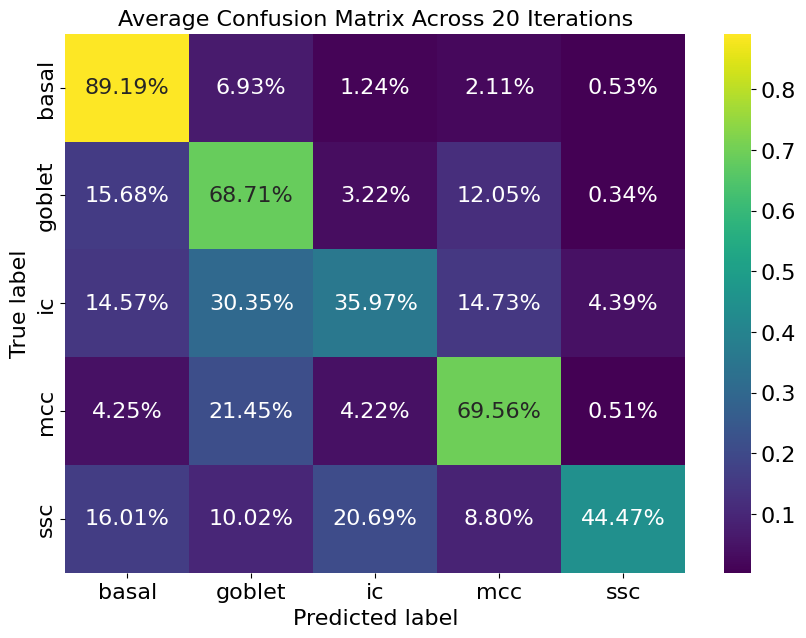

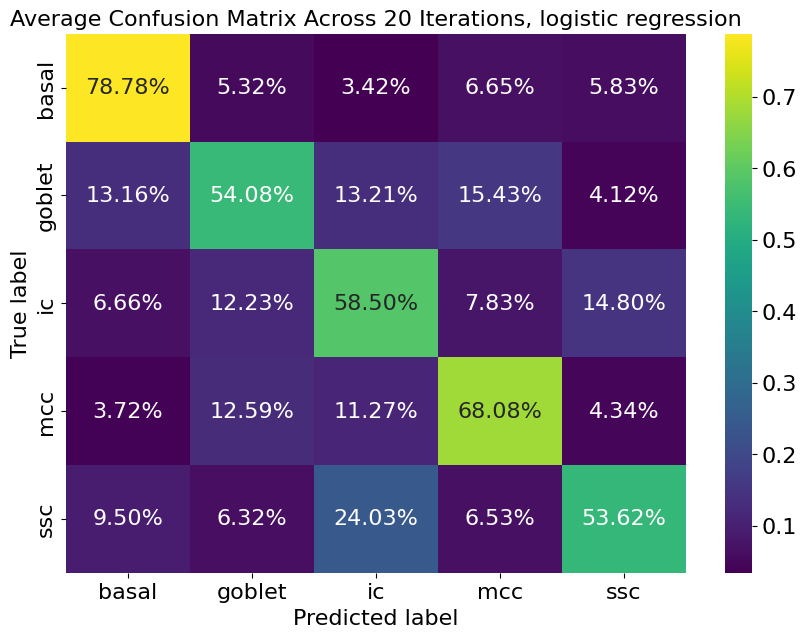

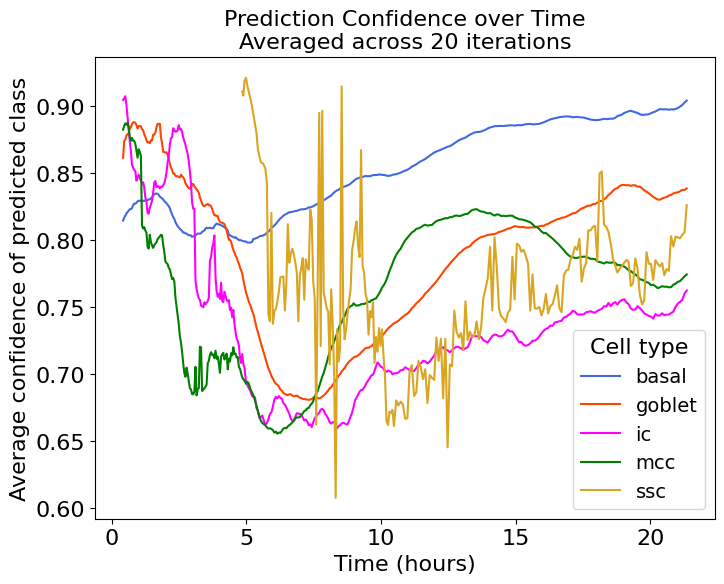

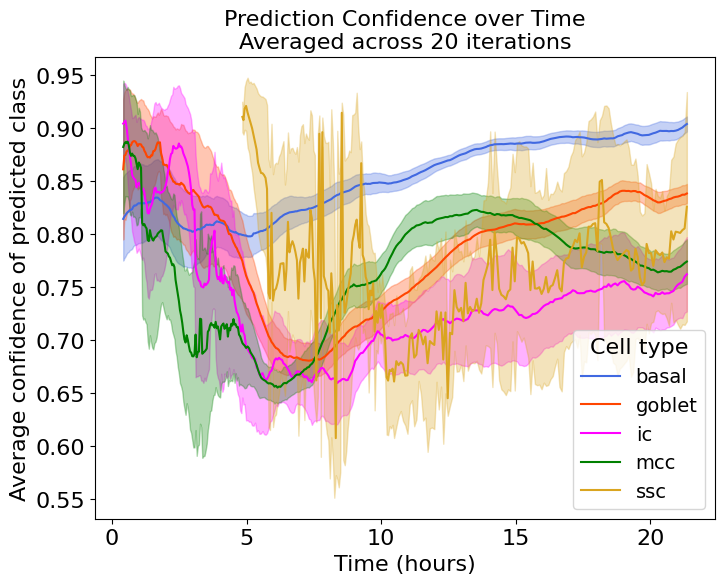

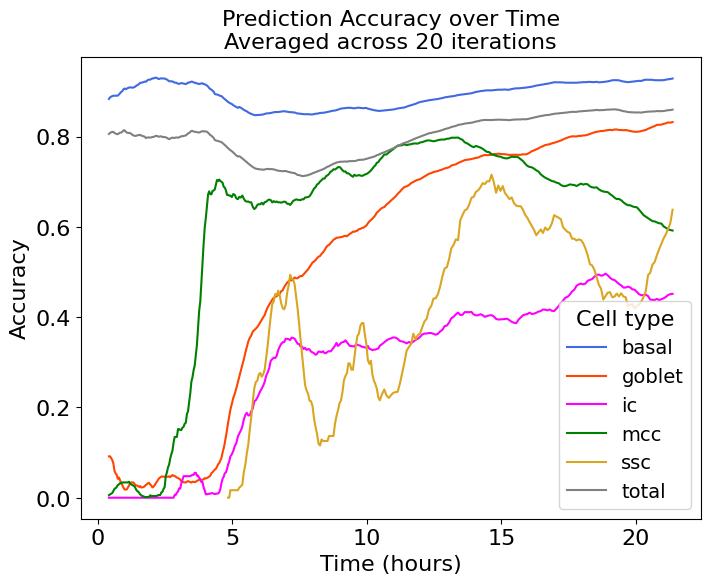

...

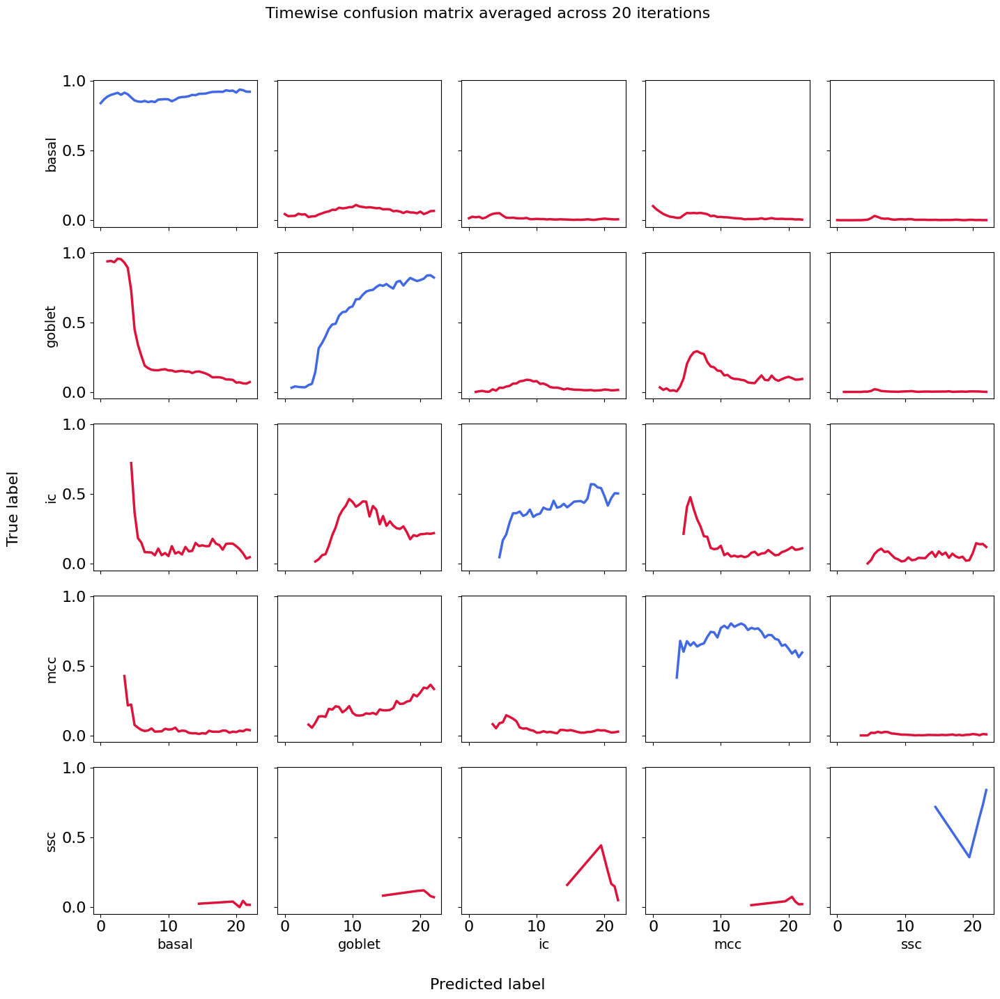

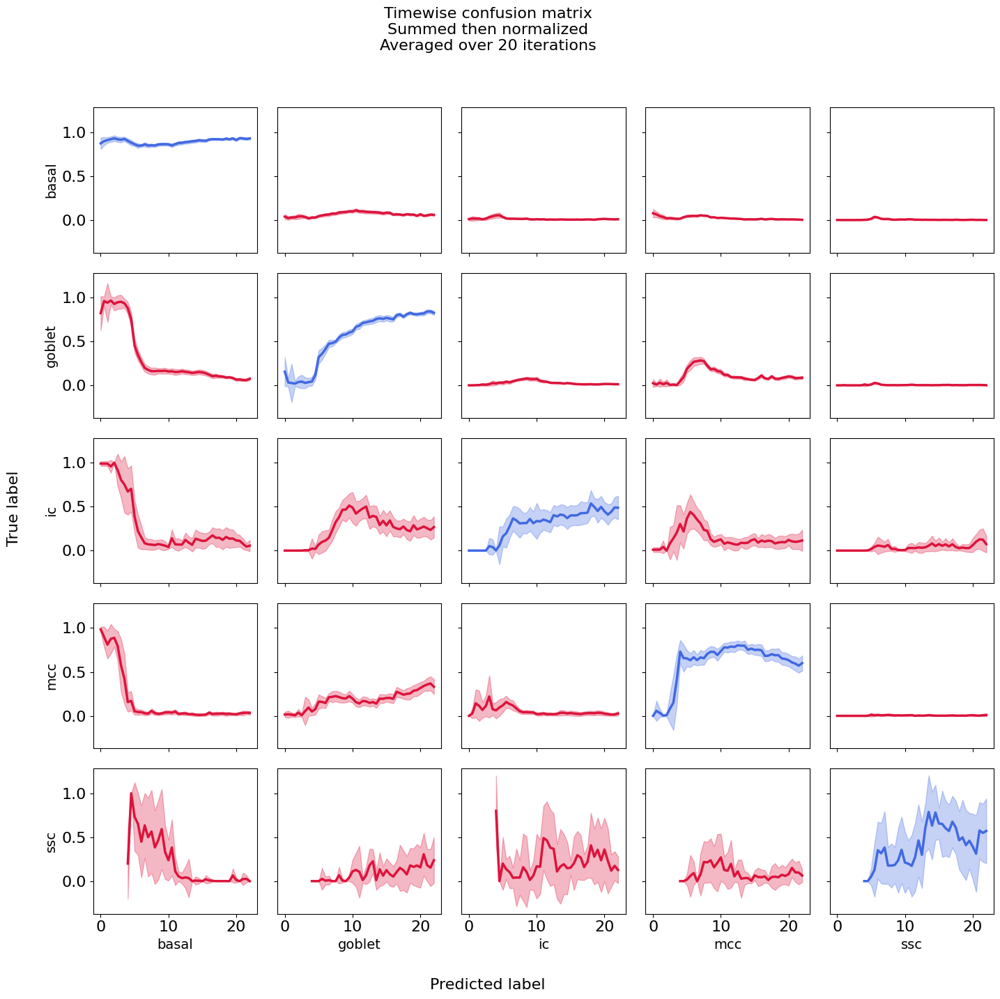

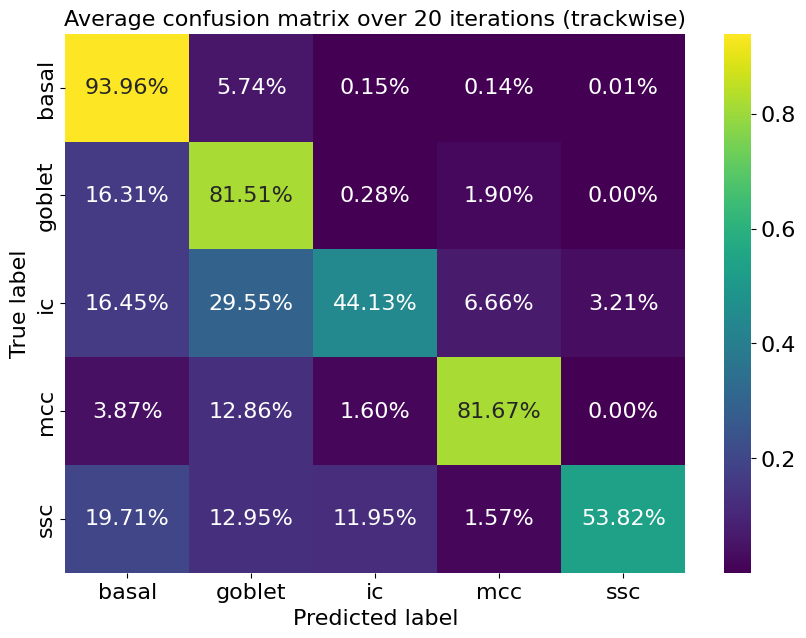

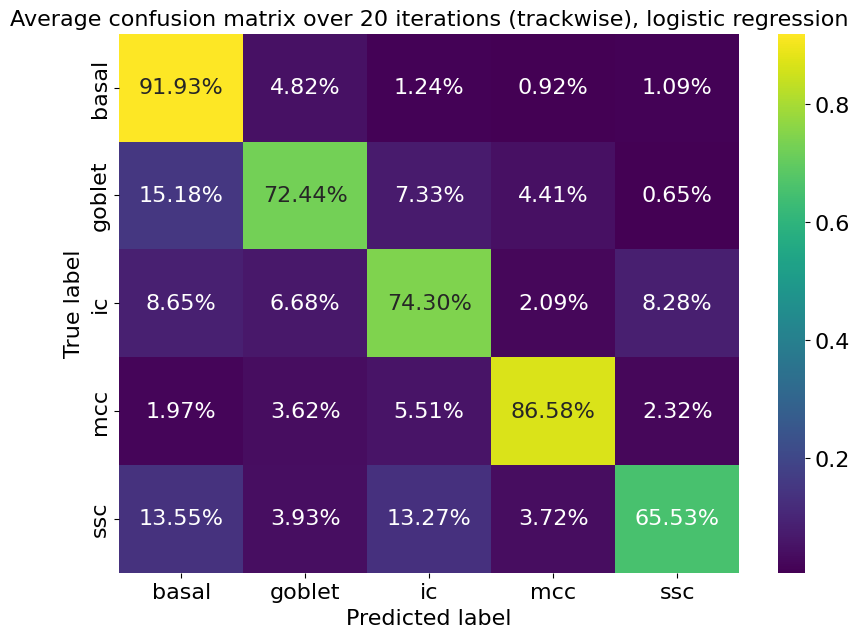

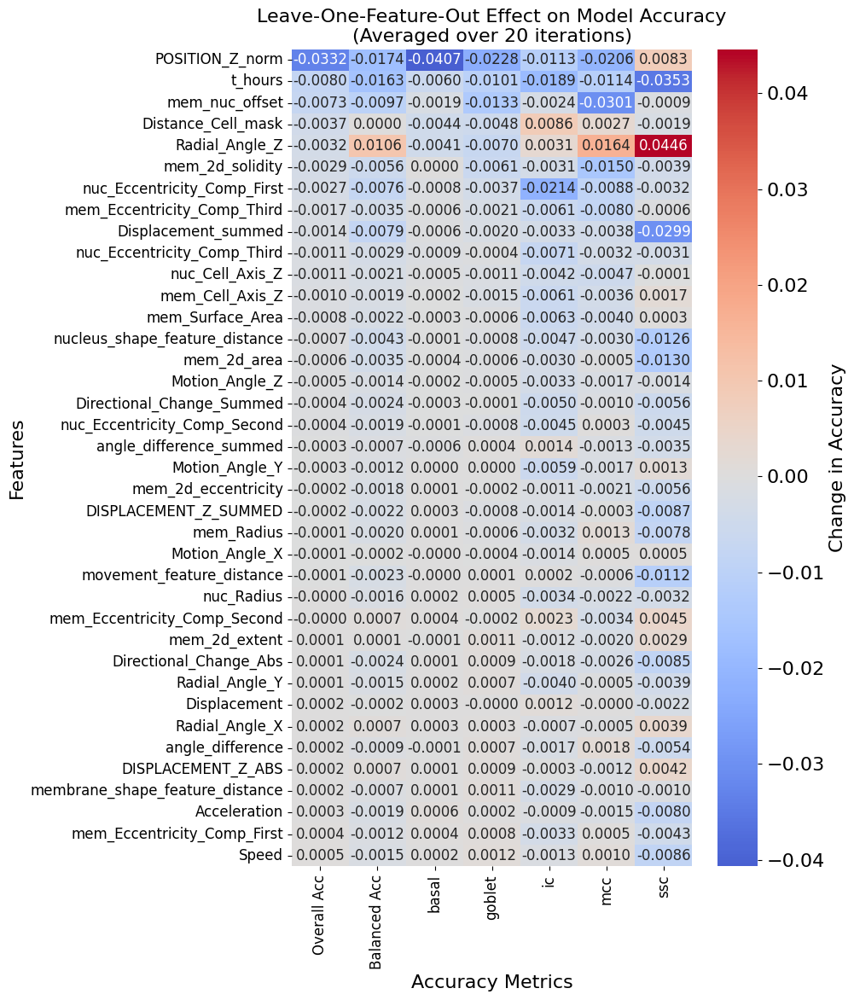

In [197]:
# Plot averaged confusion matrix
plt.figure(figsize=(10, 7))
sns.heatmap(avg_cm_normalized, annot=True, fmt='.2%', cmap='viridis',
            xticklabels=class_labels, yticklabels=class_labels, annot_kws={"size": 16})
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title(f'Average Confusion Matrix Across {n_iterations} Iterations')
#plt.savefig('iteration_plots_10_04/confusion_matrix.pdf')
plt.show()

# Plot averaged confusion matrix
plt.figure(figsize=(10, 7))
sns.heatmap(avg_cm_normalized_logreg, annot=True, fmt='.2%', cmap='viridis',
            xticklabels=class_labels, yticklabels=class_labels, annot_kws={"size": 16})
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title(f'Average Confusion Matrix Across {n_iterations} Iterations, logistic regression')
#plt.savefig('iteration_plots_10_04/confusion_matrix_logreg.pdf')
plt.show()

# Plot average timewise prediction confidence
plt.figure(figsize=(8, 6))

for cell_type, group_df in average_confidence_over_time.groupby('cell_type'):
    plt.plot(group_df['t_hours'], group_df['avg_smoothed_conf'], label=cell_type, color=colors_dict[cell_type])

plt.xlabel('Time (hours)')
plt.ylabel('Average confidence of predicted class')
plt.title(f'Prediction Confidence over Time\nAveraged across {n_iterations} iterations')
plt.legend(title='Cell type', loc='best')
plt.grid(False)
#plt.savefig('iteration_plots_10_04/prediction_confidence.pdf')
plt.show()

# Plot with confidence intervals
plt.figure(figsize=(8, 6))

for cell_type, group_df in confidence_stats_df.groupby('cell_type'):
    plt.plot(group_df['t_hours'], group_df['avg_smoothed_conf'], label=cell_type, color=colors_dict[cell_type])
    plt.fill_between(
        group_df['t_hours'],
        group_df['avg_smoothed_conf'] - group_df['std_smoothed_conf'],
        group_df['avg_smoothed_conf'] + group_df['std_smoothed_conf'],
        alpha=0.3,
        color=colors_dict[cell_type]
    )

plt.xlabel('Time (hours)')
plt.ylabel('Average confidence of predicted class')
plt.title(f'Prediction Confidence over Time\nAveraged across {n_iterations} iterations')
plt.legend(title='Cell type')
plt.grid(False)
#plt.savefig('iteration_plots_10_04/prediction_confidence_withconfidence.pdf')
plt.show()

# Plot average timewise prediction accuracy
# Apply smoothing
window_size = 20
plt.figure(figsize=(8, 6))

for cell_type, group_df in average_accuracy_df.groupby('cell_type'):
    group_df = group_df.sort_values('t_hours')
    group_df['smoothed_accuracy'] = group_df['avg_accuracy'].rolling(window=window_size, center=True).mean()
    plt.plot(group_df['t_hours'], group_df['smoothed_accuracy'], label=cell_type, color=colors_dict[cell_type])

# Plot overall accuracy
average_total_accuracy_df = average_total_accuracy_df.sort_values('t_hours')
average_total_accuracy_df['smoothed_total_accuracy'] = average_total_accuracy_df['avg_total_accuracy'].rolling(window=window_size, center=True).mean()
plt.plot(average_total_accuracy_df['t_hours'], average_total_accuracy_df['smoothed_total_accuracy'], label='total', color='gray', linewidth=1.5)

plt.xlabel('Time (hours)')
plt.ylabel('Accuracy')
plt.title(f'Prediction Accuracy over Time\nAveraged across {n_iterations} iterations')
plt.legend(title='Cell type', loc='best')
plt.grid(False)
#plt.savefig('iteration_plots_10_04/prediction_accuracy_timewise.pdf')
plt.show()

# Plot average timewise prediction accuracy
# Compute mean and std
accuracy_stats_df = (
    combined_accuracy_df
    .groupby(['t_hours', 'cell_type'])['accuracy']
    .agg(['mean', 'std'])
    .reset_index()
    .rename(columns={'mean': 'avg_accuracy', 'std': 'std_accuracy'})
)

# Apply smoothing
window_size = 20
plt.figure(figsize=(8, 6))

for cell_type, group_df in accuracy_stats_df.groupby('cell_type'):
    group_df = group_df.sort_values('t_hours')
    group_df['smoothed_accuracy'] = group_df['avg_accuracy'].rolling(window=window_size, center=True).mean()
    group_df['smoothed_std'] = group_df['std_accuracy'].rolling(window=window_size, center=True).mean()
    
    plt.plot(group_df['t_hours'], group_df['smoothed_accuracy'], label=cell_type, color=colors_dict[cell_type])
    plt.fill_between(
        group_df['t_hours'],
        group_df['smoothed_accuracy'] - group_df['smoothed_std'],
        group_df['smoothed_accuracy'] + group_df['smoothed_std'],
        alpha=0.3,
        color=colors_dict[cell_type]
    )

plt.xlabel('Time (hours)')
plt.ylabel('Accuracy of predicted class (mean + std)')
plt.title(f'Prediction accuracy over Time\nAveraged across {n_iterations} iterations')
plt.legend(title='Cell type')
plt.grid(True)
#plt.savefig('iteration_plots_10_04/prediction_accuracy_timewise_withconfidence.pdf')
plt.show()

#Plot average timewise confusion matrix
fig, axes = plt.subplots(num_classes, num_classes, figsize=(15, 15), sharex=True, sharey=True)

for i, true_class in enumerate(class_labels):
    for j, pred_class in enumerate(class_labels):
        ax = axes[i, j]
        plot_data = time_series_df[(time_series_df["True Class"] == true_class) & 
                                   (time_series_df["Predicted Class"] == pred_class)]
        sns.lineplot(data=plot_data, x="Time", y="Value", ax=ax, 
                     color='royalblue' if i == j else 'crimson', linewidth=2.5)
        if j == 0:
            ax.set_ylabel(true_class, fontsize=14)
        if i == num_classes - 1:
            ax.set_xlabel(pred_class, fontsize=14)
        ax.grid(False)

fig.text(0.04, 0.5, "True label", va='center', rotation=90, fontsize=16)
fig.text(0.5, 0.04, "Predicted label", ha='center', fontsize=16)
plt.suptitle(f"Timewise confusion matrix averaged across {n_iterations} iterations", fontsize=16)
plt.tight_layout(rect=[0.06, 0.06, 1, 0.96])
#plt.savefig('iteration_plots_10_04/prediction_accuracy_matrix.pdf')
plt.show()

fig, axes = plt.subplots(num_classes, num_classes, figsize=(15, 15), sharex=True, sharey=True)

for i, true_class in enumerate(class_labels):
    for j, pred_class in enumerate(class_labels):
        ax = axes[i, j]
        plot_data = cm_plot_df[
            (cm_plot_df["True Class"] == true_class) &
            (cm_plot_df["Predicted Class"] == pred_class)
        ].dropna(subset=["Mean", "Std"])

        color = 'royalblue' if i == j else 'crimson'

        ax.plot(plot_data["Time"], plot_data["Mean"], color=color, linewidth=2.5)

        ax.fill_between(
            plot_data["Time"],
            plot_data["Mean"] - plot_data["Std"],
            plot_data["Mean"] + plot_data["Std"],
            color=color,
            alpha=0.3
        )

        if j == 0:
            ax.set_ylabel(true_class, fontsize=14)
        if i == num_classes - 1:
            ax.set_xlabel(pred_class, fontsize=14)
        ax.grid(False)

fig.text(0.04, 0.5, "True label", va='center', rotation=90, fontsize=16)
fig.text(0.5, 0.04, "Predicted label", ha='center', fontsize=16)
plt.suptitle(f"Timewise confusion matrix\nSummed then normalized\nAveraged over {n_iterations} iterations", fontsize=16)
plt.tight_layout(rect=[0.06, 0.06, 1, 0.96])
#plt.savefig('iteration_plots_10_04/prediction_accuracy_matrix_withconfidence.pdf')
plt.show()

#Plot trackwise average confusion matrix

plt.figure(figsize=(10, 7))
sns.heatmap(
    avg_trackwise_cm,
    annot=True,
    fmt='.2%',
    cmap='viridis',
    xticklabels=class_labels,
    yticklabels=class_labels,
    annot_kws={"size": 16}
)
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title(f'Average confusion matrix over {n_iterations} iterations (trackwise)')
#plt.savefig('iteration_plots_10_04/trackwise_confusion_matrix.pdf')
plt.show()

plt.figure(figsize=(10, 7))
sns.heatmap(
    avg_trackwise_cm_logreg,
    annot=True,
    fmt='.2%',
    cmap='viridis',
    xticklabels=class_labels,
    yticklabels=class_labels,
    annot_kws={"size": 16}
)
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title(f'Average confusion matrix over {n_iterations} iterations (trackwise), logistic regression')
#plt.savefig('iteration_plots_10_04/trackwise_confusion_matrix_logreg.pdf')
plt.show()

#Plot average feature importance heatmap
# Sort features by overall accuracy impact
sorted_lofo_df = average_lofo_df.sort_values(by='Overall Acc', ascending=True)

plt.figure(figsize=(10, 12))
ax = sns.heatmap(sorted_lofo_df, annot=True, fmt=".4f", cmap='coolwarm', center=0, cbar_kws={'label': 'Change in Accuracy'}, annot_kws={"size": 12})
ax.set_title(f'Leave-One-Feature-Out Effect on Model Accuracy\n(Averaged over {valid_lofo_iterations} iterations)')
ax.set_xlabel('Accuracy Metrics')
ax.set_ylabel('Features')
# Override tick label sizes locally
ax.set_xticklabels(ax.get_xticklabels(), fontsize=12)  # X-axis tick font size
ax.set_yticklabels(ax.get_yticklabels(), fontsize=12)  # Y-axis tick font size
plt.tight_layout()
#plt.savefig('iteration_plots_10_04/feature_importances.pdf')
plt.show()

In [202]:
ordered_names = {'mem_Radius' : 'Membrane radius',
 'mem_Eccentricity_Comp_First' : 'Membrane major axis length', 
 'mem_Eccentricity_Comp_Second' : 'Membrane intermediate axis length',
 'mem_Eccentricity_Comp_Third' : 'Membrane minor axis length',
 'mem_Surface_Area' : 'Membrane surface area',
 'mem_Cell_Axis_Z' : 'Membrane cell axis Z',   
 'mem_2d_area' : 'Membrane center slice area',
 'mem_2d_eccentricity' : 'Membrane center slice eccentricity',
 'mem_2d_solidity' : 'Membrane center slice solidity',
 'mem_2d_extent' : 'Membrane center slice extent',
 'nuc_Radius' : 'Nucleus radius',
 'nuc_Eccentricity_Comp_First' : 'Nucleus major axis length',
 'nuc_Eccentricity_Comp_Second' : 'Nucleus intermediate axis length',   
 'nuc_Eccentricity_Comp_Third' : 'Nucleus minor axis length',
 'nuc_Cell_Axis_Z' : 'Nucleus cell axis Z',
 'mem_nuc_offset' : 'Membrane-nucleus offset',
 'POSITION_Z_norm' : 'Normalized Z position',
 'Distance_Cell_mask' : ' Distance to tissue boundary',
 'Radial_Angle_Z' : 'Radial angle Z',
 'Radial_Angle_Y' : 'Radial angle Y',
 'Radial_Angle_X' : 'Radial angle X',
 'Speed' : 'Speed',
 'Motion_Angle_Z' : 'Motion angle Z',
 'Motion_Angle_Y' : 'Motion angle Y',
 'Motion_Angle_X' : 'Motion angle X',
 'Acceleration' : 'Acceleration',
 'DISPLACEMENT_Z_ABS' : 'Z displacement',
 'DISPLACEMENT_Z_SUMMED' : 'Summed Z displacement',
 'Displacement' : 'Displacement',
 'Directional_Change_Abs' : 'Directional change',
 'Displacement_summed': 'Summed displacement',
 'Directional_Change_Summed' : 'Summed directional change',
 'angle_difference' : 'Radial divergence',
 'angle_difference_summed' : 'Summed radial divergence',
 'nucleus_shape_feature_distance' : 'Nucleus shape feature distance',	
 'membrane_shape_feature_distance' : 'Membrane shape feature distance',
 'movement_feature_distance' : 'Movement feature distance',
 't_hours' : 'Time (hours)'
 }

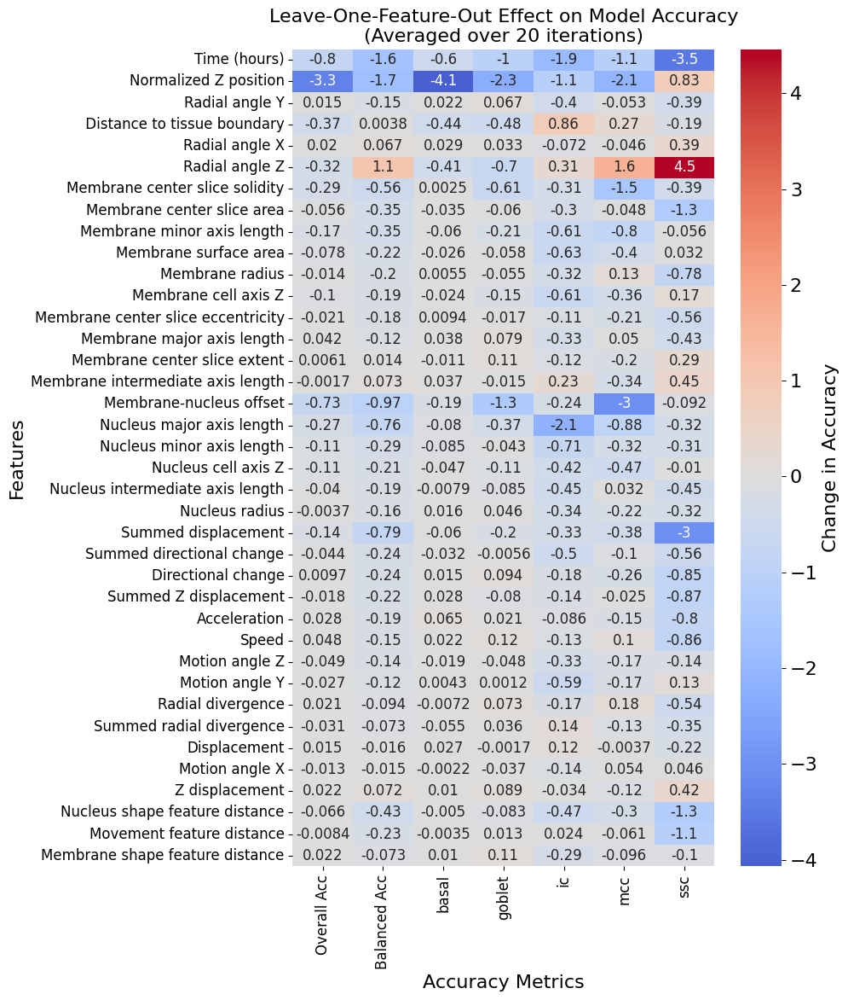

In [203]:
# Create a mapping from feature name to category
feature_to_category = {}
for category, features in feature_categories.items():
    for feature in features:
        feature_to_category[feature] = category
feature_to_category['t_hours'] = 'time'

# Add category to the LOFO DataFrame
average_lofo_df = average_lofo_df.copy()
average_lofo_df['Category'] = average_lofo_df.index.map(feature_to_category.get)

# Define your custom category order
category_order = ['time', 'position', 'membrane_shape', 'nucleus_shape', 'movement', 'neighbor_feature_distance']

# Convert 'Category' column to a categorical with this specific order
average_lofo_df['Category'] = pd.Categorical(
    average_lofo_df['Category'],
    categories=category_order,
    ordered=True
)

# Sort by Category (in defined order), then by 'Overall Acc'
sorted_lofo_df = average_lofo_df.sort_values(['Category', 'Balanced Acc'], ascending=[True, True])

sorted_lofo_df_cleaned = sorted_lofo_df.drop(columns=['Category'])

# Multiply values by 100
sorted_lofo_df_cleaned_pct = sorted_lofo_df_cleaned * 100

# Replace feature names in the index with descriptive names
sorted_lofo_df_cleaned_pct.index = sorted_lofo_df_cleaned_pct.index.map(ordered_names.get)

plt.figure(figsize=(10, 12))
ax = sns.heatmap(
    sorted_lofo_df_cleaned_pct,
    annot=True,
    cmap='coolwarm',
    center=0,
    cbar_kws={'label': 'Change in Accuracy'},
    annot_kws={"size": 12}
)
ax.set_title(f'Leave-One-Feature-Out Effect on Model Accuracy\n(Averaged over {valid_lofo_iterations} iterations)')
ax.set_xlabel('Accuracy Metrics')
ax.set_ylabel('Features')

# Update tick font sizes
ax.set_xticklabels(ax.get_xticklabels(), fontsize=12)
ax.set_yticklabels(ax.get_yticklabels(), fontsize=12)

plt.tight_layout()
plt.savefig('iteration_plots_10_04/feature_importances_by_category.pdf')
plt.show()




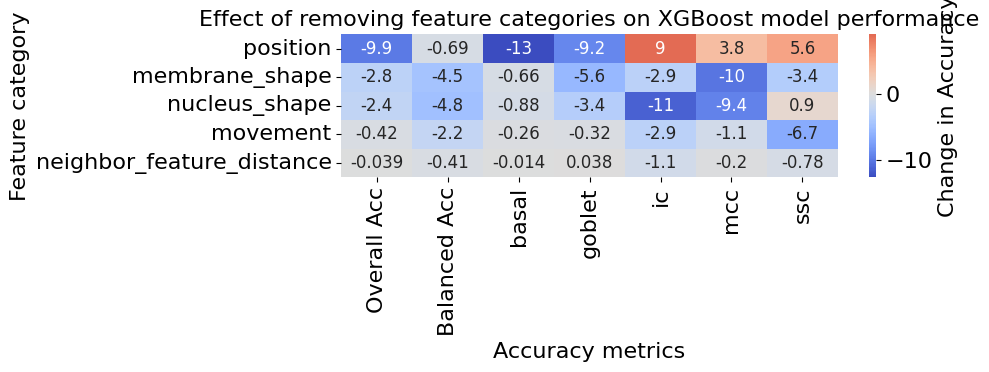

In [154]:
#Plot average feature importance heatmap
# Sort features by overall accuracy impact
sorted_category_lofo_df = average_category_lofo_df.sort_values(by='Overall Acc', ascending=True)

# Multiply values by 100
sorted_category_lofo_df_pct = sorted_category_lofo_df * 100

plt.figure(figsize=(10, 4))
sns.heatmap(sorted_category_lofo_df_pct, annot=True, cmap='coolwarm', center=0, cbar_kws={'label': 'Change in Accuracy'}, annot_kws={"size": 12})
plt.title('Effect of removing feature categories on XGBoost model performance')
plt.xlabel('Accuracy metrics')
plt.ylabel('Feature category')
plt.tight_layout()
plt.savefig('feature_importance_category_lofo_avg.pdf')
plt.show()


In [ ]:
# Create a mapping from feature name to category
feature_to_category = {}
for category, features in feature_categories.items():
    for feature in features:
        feature_to_category[feature] = category


# Add category to the LOFO DataFrame
average_lofo_df = average_lofo_df.copy()
average_lofo_df['Category'] = average_lofo_df.index.map(feature_to_category.get)

# Define your custom category order
category_order = ['position', 'membrane_shape', 'nucleus_shape', 'movement', 'neighbor_feature_distance']

# Convert 'Category' column to a categorical with this specific order
average_lofo_df['Category'] = pd.Categorical(
    average_lofo_df['Category'],
    categories=category_order,
    ordered=True
)

# Sort by Category (in defined order), then by 'Overall Acc'
sorted_lofo_df = average_lofo_df.sort_values(['Category', 'Balanced Acc'], ascending=[True, True])

sorted_lofo_df_cleaned = sorted_lofo_df.drop(columns=['Category'])

# Multiply values by 100
sorted_lofo_df_cleaned_pct = sorted_lofo_df_cleaned * 100

# Replace feature names in the index with descriptive names
sorted_lofo_df_cleaned_pct.index = sorted_lofo_df_cleaned_pct.index.map(ordered_names.get)

plt.figure(figsize=(10, 12))
ax = sns.heatmap(
    sorted_lofo_df_cleaned_pct,
    annot=True,
    cmap='coolwarm',
    center=0,
    cbar_kws={'label': 'Change in Accuracy'},
    annot_kws={"size": 12}
)
ax.set_title(f'Leave-One-Feature-Out Effect on Model Accuracy\n(Averaged over {valid_lofo_iterations} iterations)')
ax.set_xlabel('Accuracy Metrics')
ax.set_ylabel('Features')

# Update tick font sizes
ax.set_xticklabels(ax.get_xticklabels(), fontsize=12)
ax.set_yticklabels(ax.get_yticklabels(), fontsize=12)

plt.tight_layout()
plt.savefig('iteration_plots_10_04/feature_importances_by_category.pdf')
plt.show()




### Multiple iterations with reduced features

In [142]:
feature_categories

{'membrane_shape': ['mem_Radius',
  'mem_Eccentricity_Comp_First',
  'mem_Eccentricity_Comp_Second',
  'mem_Eccentricity_Comp_Third',
  'mem_Surface_Area',
  'mem_Cell_Axis_Z',
  'mem_2d_area',
  'mem_2d_eccentricity',
  'mem_2d_solidity',
  'mem_2d_extent'],
 'nucleus_shape': ['nuc_Radius',
  'nuc_Eccentricity_Comp_First',
  'nuc_Eccentricity_Comp_Second',
  'nuc_Eccentricity_Comp_Third',
  'nuc_Cell_Axis_Z',
  'mem_nuc_offset'],
 'position': ['POSITION_Z_norm',
  'Distance_Cell_mask',
  'Radial_Angle_Z',
  'Radial_Angle_Y',
  'Radial_Angle_X'],
 'movement': ['Speed',
  'Motion_Angle_Z',
  'Motion_Angle_Y',
  'Motion_Angle_X',
  'Acceleration',
  'DISPLACEMENT_Z_ABS',
  'DISPLACEMENT_Z_SUMMED',
  'Displacement',
  'Directional_Change_Abs',
  'Displacement_summed',
  'Directional_Change_Summed',
  'angle_difference',
  'angle_difference_summed'],
 'neighbor_feature_distance': ['nucleus_shape_feature_distance',
  'membrane_shape_feature_distance',
  'movement_feature_distance']}

In [162]:
#cross-correlating features are left commented, but also features that affect the model performance negatively are left commented, as they are not used in the final model 
feature_categories_cropped = {'membrane_shape' : [
 'mem_Radius',
 'mem_Eccentricity_Comp_First',
 'mem_Eccentricity_Comp_Second',
 'mem_Eccentricity_Comp_Third',
 'mem_Surface_Area',
 'mem_Cell_Axis_Z',
 'mem_2d_area',
 'mem_2d_eccentricity',
 'mem_2d_solidity',
 'mem_2d_extent',
 #'mem_2d_feret_diameter_max',
 #'mem_2d_axis_major_length',
 #'mem_2d_axis_minor_length',
 #'mem_2d_perimeter',
 #'mem_Cell_Axis_Y',
 #'mem_Cell_Axis_X',
 ],

'nucleus_shape' : [
 'nuc_Radius',
 #'nuc_Surface_Area',
 'nuc_Eccentricity_Comp_First',
 'nuc_Eccentricity_Comp_Second',
 'nuc_Eccentricity_Comp_Third',
 #'nuc_Cell_Axis_X',
 #'nuc_Cell_Axis_Y',  
 'nuc_Cell_Axis_Z',
 'mem_nuc_offset'],

 'position' : [
 'POSITION_Z_norm',
 #'Distance_Cell_mask',
 #'Radial_Angle_Z',
 #'Radial_Angle_Y',
 #'Radial_Angle_X',
 ],

'movement' : ['Speed',
 'Motion_Angle_Z',
 'Motion_Angle_Y',
 'Motion_Angle_X',
 'Acceleration',
 'DISPLACEMENT_Z_ABS',
 'DISPLACEMENT_Z_SUMMED',
 'Displacement', 
 'Directional_Change_Abs',
 'Displacement_summed',
 'Directional_Change_Summed',
 'angle_difference',
 'angle_difference_summed'],

'neighbor_feature_distance' : ['nucleus_shape_feature_distance',	
 'membrane_shape_feature_distance',
 'movement_feature_distance']
}

In [163]:
ordered_features_cropped = []
for category, features in feature_categories_cropped.items():
    ordered_features_cropped.extend(features)

In [164]:
use_logreg = False  # Set to False to skip logistic regression
use_lofo = True
use_category_lofo = True
plot_tracks = False

n_iterations = 20
all_metrics_cropped = []
all_conf_matrices_cropped = []
all_smoothed_confidences_cropped = []
all_accuracy_dfs_cropped = []
all_total_accuracy_dfs_cropped = []
all_cm_by_time_cropped = []  # One dict per iteration
all_trackwise_confusion_matrices_cropped = []
if use_lofo:
    all_lofo_accuracy_curves_cropped = []
    all_lofo_confidence_curves_cropped = []
if use_logreg:
    all_metrics_logreg_cropped = []
    all_conf_matrices_logreg_cropped = []
    all_trackwise_confusion_matrices_logreg_cropped = []

class_labels = ['basal', 'goblet', 'ic', 'mcc', 'ssc'] 
cell_type_dict = {'basal' : 0, 'goblet' : 1, 'ic' : 2, 'mcc' : 3, 'ssc' : 4}
num_classes = 5

# Initialize cumulative results matrix
feature_list = ordered_features_cropped
if use_lofo:
    metric_columns = ['Overall Acc', 'Balanced Acc'] + list(class_labels)
    cumulative_lofo_df_cropped = pd.DataFrame(0.0, index=feature_list, columns=metric_columns)

    valid_lofo_iterations_cropped = 0

if use_category_lofo:
    metric_columns = ['Overall Acc', 'Balanced Acc'] + list(class_labels)
    cumulative_category_lofo_df_cropped = pd.DataFrame(0.0, index=feature_categories.keys(), columns=metric_columns)

    valid_category_lofo_iterations_cropped = 0

for i in range(n_iterations):
    print(f"Running iteration {i+1}/{n_iterations}")
    
    metrics_cropped, metrics_logreg_cropped, cm_cropped, cm_logreg_cropped, smoothed_conf_df_cropped, accuracy_df_cropped, total_accuracy_df_cropped, cm_by_time_cropped, cm_trackwise_cropped, cm_trackwise_logreg_cropped, lofo_matrix_cropped, lofo_accuracy_curves_cropped, lofo_confidence_curves_cropped, category_lofo_matrix_cropped = run_single_iteration(train_df2, ordered_features_cropped, class_labels, include_logreg=use_logreg, include_lofo=use_lofo, include_category_lofo=use_category_lofo, plot_tracks=plot_tracks)
    if lofo_matrix_cropped is not None:  # Optional: Add try-except if necessary
        cumulative_lofo_df_cropped += lofo_matrix_cropped.astype(float)
        valid_lofo_iterations_cropped += 1
    if category_lofo_matrix_cropped is not None:
        cumulative_category_lofo_df_cropped += category_lofo_matrix_cropped.astype(float)
        valid_category_lofo_iterations_cropped += 1
    
    
    all_metrics_cropped.append(metrics_cropped)
    all_conf_matrices_cropped.append(cm_cropped)
    all_smoothed_confidences_cropped.append(smoothed_conf_df_cropped)
    all_accuracy_dfs_cropped.append(accuracy_df_cropped)
    all_total_accuracy_dfs_cropped.append(total_accuracy_df_cropped)
    all_cm_by_time_cropped.append(cm_by_time_cropped)
    all_trackwise_confusion_matrices_cropped.append(cm_trackwise_cropped)
    if use_lofo:
        all_lofo_accuracy_curves_cropped.append(lofo_accuracy_curves_cropped)
        all_lofo_confidence_curves_cropped.append(lofo_confidence_curves_cropped)
    if use_logreg:
        all_metrics_logreg_cropped.append(metrics_logreg_cropped)
        all_conf_matrices_logreg_cropped.append(cm_logreg_cropped)
        all_trackwise_confusion_matrices_logreg_cropped.append(cm_trackwise_logreg_cropped)

Running iteration 1/20


C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded["t_hours_bin"] = pd.qcut(df_encoded[stratify_col], q=bins, duplicates="drop")
C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded[target_col] = label_encoder.fit_transform(df_encoded[target_col])
C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1043904498.py:119: RuntimeWarning: invalid value encountered in d

Removing category: membrane_shape


Leave-One-Category-Out:  20%|██        | 1/5 [00:04<00:17,  4.29s/it]

Removing category: nucleus_shape


Leave-One-Category-Out:  40%|████      | 2/5 [00:09<00:13,  4.56s/it]

Removing category: position


Leave-One-Category-Out:  60%|██████    | 3/5 [00:14<00:09,  4.99s/it]

Removing category: movement


Leave-One-Category-Out:  80%|████████  | 4/5 [00:18<00:04,  4.64s/it]

Removing category: neighbor_feature_distance


Leave-One-Category-Out: 100%|██████████| 5/5 [00:23<00:00,  4.72s/it]


Running iteration 2/20


C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded["t_hours_bin"] = pd.qcut(df_encoded[stratify_col], q=bins, duplicates="drop")
C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded[target_col] = label_encoder.fit_transform(df_encoded[target_col])
C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1043904498.py:119: RuntimeWarning: invalid value encountered in d

Removing category: membrane_shape


Leave-One-Category-Out:  20%|██        | 1/5 [00:04<00:17,  4.27s/it]

Removing category: nucleus_shape


Leave-One-Category-Out:  40%|████      | 2/5 [00:08<00:13,  4.48s/it]

Removing category: position


Leave-One-Category-Out:  60%|██████    | 3/5 [00:14<00:10,  5.08s/it]

Removing category: movement


Leave-One-Category-Out:  80%|████████  | 4/5 [00:18<00:04,  4.75s/it]

Removing category: neighbor_feature_distance


Leave-One-Category-Out: 100%|██████████| 5/5 [00:24<00:00,  4.83s/it]


Running iteration 3/20


C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded["t_hours_bin"] = pd.qcut(df_encoded[stratify_col], q=bins, duplicates="drop")
C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded[target_col] = label_encoder.fit_transform(df_encoded[target_col])
C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1043904498.py:119: RuntimeWarning: invalid value encountered in d

Removing category: membrane_shape


Leave-One-Category-Out:  20%|██        | 1/5 [00:04<00:16,  4.00s/it]

Removing category: nucleus_shape


Leave-One-Category-Out:  40%|████      | 2/5 [00:08<00:12,  4.30s/it]

Removing category: position


Leave-One-Category-Out:  60%|██████    | 3/5 [00:13<00:09,  4.72s/it]

Removing category: movement


Leave-One-Category-Out:  80%|████████  | 4/5 [00:17<00:04,  4.42s/it]

Removing category: neighbor_feature_distance


Leave-One-Category-Out: 100%|██████████| 5/5 [00:22<00:00,  4.48s/it]


Running iteration 4/20


C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded["t_hours_bin"] = pd.qcut(df_encoded[stratify_col], q=bins, duplicates="drop")
C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded[target_col] = label_encoder.fit_transform(df_encoded[target_col])
C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1043904498.py:119: RuntimeWarning: invalid value encountered in d

Removing category: membrane_shape


Leave-One-Category-Out:  20%|██        | 1/5 [00:04<00:16,  4.25s/it]

Removing category: nucleus_shape


Leave-One-Category-Out:  40%|████      | 2/5 [00:08<00:13,  4.44s/it]

Removing category: position


Leave-One-Category-Out:  60%|██████    | 3/5 [00:13<00:09,  4.74s/it]

Removing category: movement


Leave-One-Category-Out:  80%|████████  | 4/5 [00:17<00:04,  4.39s/it]

Removing category: neighbor_feature_distance


Leave-One-Category-Out: 100%|██████████| 5/5 [00:22<00:00,  4.52s/it]


Running iteration 5/20


C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded["t_hours_bin"] = pd.qcut(df_encoded[stratify_col], q=bins, duplicates="drop")
C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded[target_col] = label_encoder.fit_transform(df_encoded[target_col])
C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1043904498.py:119: RuntimeWarning: invalid value encountered in d

Removing category: membrane_shape


Leave-One-Category-Out:  20%|██        | 1/5 [00:04<00:16,  4.22s/it]

Removing category: nucleus_shape


Leave-One-Category-Out:  40%|████      | 2/5 [00:08<00:13,  4.43s/it]

Removing category: position


Leave-One-Category-Out:  60%|██████    | 3/5 [00:13<00:09,  4.70s/it]

Removing category: movement


Leave-One-Category-Out:  80%|████████  | 4/5 [00:17<00:04,  4.39s/it]

Removing category: neighbor_feature_distance


Leave-One-Category-Out: 100%|██████████| 5/5 [00:22<00:00,  4.52s/it]


Running iteration 6/20


C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded["t_hours_bin"] = pd.qcut(df_encoded[stratify_col], q=bins, duplicates="drop")
C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded[target_col] = label_encoder.fit_transform(df_encoded[target_col])
C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1043904498.py:119: RuntimeWarning: invalid value encountered in d

Removing category: membrane_shape


Leave-One-Category-Out:  20%|██        | 1/5 [00:04<00:16,  4.18s/it]

Removing category: nucleus_shape


Leave-One-Category-Out:  40%|████      | 2/5 [00:08<00:13,  4.42s/it]

Removing category: position


Leave-One-Category-Out:  60%|██████    | 3/5 [00:13<00:09,  4.68s/it]

Removing category: movement


Leave-One-Category-Out:  80%|████████  | 4/5 [00:17<00:04,  4.42s/it]

Removing category: neighbor_feature_distance


Leave-One-Category-Out: 100%|██████████| 5/5 [00:22<00:00,  4.52s/it]


Running iteration 7/20


C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded["t_hours_bin"] = pd.qcut(df_encoded[stratify_col], q=bins, duplicates="drop")
C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded[target_col] = label_encoder.fit_transform(df_encoded[target_col])
C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1043904498.py:119: RuntimeWarning: invalid value encountered in d

Removing category: membrane_shape


Leave-One-Category-Out:  20%|██        | 1/5 [00:04<00:16,  4.22s/it]

Removing category: nucleus_shape


Leave-One-Category-Out:  40%|████      | 2/5 [00:08<00:13,  4.44s/it]

Removing category: position


Leave-One-Category-Out:  60%|██████    | 3/5 [00:14<00:09,  4.80s/it]

Removing category: movement


Leave-One-Category-Out:  80%|████████  | 4/5 [00:17<00:04,  4.41s/it]

Removing category: neighbor_feature_distance


Leave-One-Category-Out: 100%|██████████| 5/5 [00:22<00:00,  4.58s/it]


Running iteration 8/20


C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded["t_hours_bin"] = pd.qcut(df_encoded[stratify_col], q=bins, duplicates="drop")
C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded[target_col] = label_encoder.fit_transform(df_encoded[target_col])
C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1043904498.py:119: RuntimeWarning: invalid value encountered in d

Removing category: membrane_shape


Leave-One-Category-Out:  20%|██        | 1/5 [00:04<00:17,  4.27s/it]

Removing category: nucleus_shape


Leave-One-Category-Out:  40%|████      | 2/5 [00:08<00:13,  4.52s/it]

Removing category: position


Leave-One-Category-Out:  60%|██████    | 3/5 [00:14<00:09,  4.86s/it]

Removing category: movement


Leave-One-Category-Out:  80%|████████  | 4/5 [00:18<00:04,  4.61s/it]

Removing category: neighbor_feature_distance


Leave-One-Category-Out: 100%|██████████| 5/5 [00:23<00:00,  4.65s/it]


Running iteration 9/20


C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded["t_hours_bin"] = pd.qcut(df_encoded[stratify_col], q=bins, duplicates="drop")
C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded[target_col] = label_encoder.fit_transform(df_encoded[target_col])
C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1043904498.py:119: RuntimeWarning: invalid value encountered in d

Removing category: membrane_shape


Leave-One-Category-Out:  20%|██        | 1/5 [00:04<00:17,  4.30s/it]

Removing category: nucleus_shape


Leave-One-Category-Out:  40%|████      | 2/5 [00:08<00:13,  4.52s/it]

Removing category: position


Leave-One-Category-Out:  60%|██████    | 3/5 [00:14<00:10,  5.05s/it]

Removing category: movement


Leave-One-Category-Out:  80%|████████  | 4/5 [00:18<00:04,  4.74s/it]

Removing category: neighbor_feature_distance


Leave-One-Category-Out: 100%|██████████| 5/5 [00:24<00:00,  4.81s/it]


Running iteration 10/20


C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded["t_hours_bin"] = pd.qcut(df_encoded[stratify_col], q=bins, duplicates="drop")
C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded[target_col] = label_encoder.fit_transform(df_encoded[target_col])
C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1043904498.py:119: RuntimeWarning: invalid value encountered in d

Removing category: membrane_shape


Leave-One-Category-Out:  20%|██        | 1/5 [00:04<00:17,  4.27s/it]

Removing category: nucleus_shape


Leave-One-Category-Out:  40%|████      | 2/5 [00:08<00:13,  4.52s/it]

Removing category: position


Leave-One-Category-Out:  60%|██████    | 3/5 [00:14<00:09,  4.89s/it]

Removing category: movement


Leave-One-Category-Out:  80%|████████  | 4/5 [00:18<00:04,  4.57s/it]

Removing category: neighbor_feature_distance


Leave-One-Category-Out: 100%|██████████| 5/5 [00:23<00:00,  4.68s/it]


Running iteration 11/20


C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded["t_hours_bin"] = pd.qcut(df_encoded[stratify_col], q=bins, duplicates="drop")
C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded[target_col] = label_encoder.fit_transform(df_encoded[target_col])
C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1043904498.py:119: RuntimeWarning: invalid value encountered in d

Removing category: membrane_shape


Leave-One-Category-Out:  20%|██        | 1/5 [00:04<00:16,  4.07s/it]

Removing category: nucleus_shape


Leave-One-Category-Out:  40%|████      | 2/5 [00:08<00:12,  4.26s/it]

Removing category: position


Leave-One-Category-Out:  60%|██████    | 3/5 [00:13<00:08,  4.43s/it]

Removing category: movement


Leave-One-Category-Out:  80%|████████  | 4/5 [00:16<00:04,  4.11s/it]

Removing category: neighbor_feature_distance


Leave-One-Category-Out: 100%|██████████| 5/5 [00:21<00:00,  4.27s/it]


Running iteration 12/20


C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded["t_hours_bin"] = pd.qcut(df_encoded[stratify_col], q=bins, duplicates="drop")
C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded[target_col] = label_encoder.fit_transform(df_encoded[target_col])
C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1043904498.py:119: RuntimeWarning: invalid value encountered in d

Removing category: membrane_shape


Leave-One-Category-Out:  20%|██        | 1/5 [00:04<00:18,  4.60s/it]

Removing category: nucleus_shape


Leave-One-Category-Out:  40%|████      | 2/5 [00:09<00:14,  4.74s/it]

Removing category: position


Leave-One-Category-Out:  60%|██████    | 3/5 [00:15<00:10,  5.14s/it]

Removing category: movement


Leave-One-Category-Out:  80%|████████  | 4/5 [00:19<00:04,  4.73s/it]

Removing category: neighbor_feature_distance


Leave-One-Category-Out: 100%|██████████| 5/5 [00:24<00:00,  4.94s/it]


Running iteration 13/20


C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded["t_hours_bin"] = pd.qcut(df_encoded[stratify_col], q=bins, duplicates="drop")
C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded[target_col] = label_encoder.fit_transform(df_encoded[target_col])
C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1043904498.py:119: RuntimeWarning: invalid value encountered in d

Removing category: membrane_shape


Leave-One-Category-Out:  20%|██        | 1/5 [00:04<00:17,  4.34s/it]

Removing category: nucleus_shape


Leave-One-Category-Out:  40%|████      | 2/5 [00:09<00:13,  4.55s/it]

Removing category: position


Leave-One-Category-Out:  60%|██████    | 3/5 [00:14<00:09,  4.88s/it]

Removing category: movement


Leave-One-Category-Out:  80%|████████  | 4/5 [00:18<00:04,  4.60s/it]

Removing category: neighbor_feature_distance


Leave-One-Category-Out: 100%|██████████| 5/5 [00:23<00:00,  4.70s/it]


Running iteration 14/20


C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded["t_hours_bin"] = pd.qcut(df_encoded[stratify_col], q=bins, duplicates="drop")
C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded[target_col] = label_encoder.fit_transform(df_encoded[target_col])
C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1043904498.py:119: RuntimeWarning: invalid value encountered in d

Removing category: membrane_shape


Leave-One-Category-Out:  20%|██        | 1/5 [00:04<00:17,  4.31s/it]

Removing category: nucleus_shape


Leave-One-Category-Out:  40%|████      | 2/5 [00:08<00:13,  4.52s/it]

Removing category: position


Leave-One-Category-Out:  60%|██████    | 3/5 [00:14<00:09,  4.85s/it]

Removing category: movement


Leave-One-Category-Out:  80%|████████  | 4/5 [00:18<00:04,  4.60s/it]

Removing category: neighbor_feature_distance


Leave-One-Category-Out: 100%|██████████| 5/5 [00:23<00:00,  4.68s/it]


Running iteration 15/20


C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded["t_hours_bin"] = pd.qcut(df_encoded[stratify_col], q=bins, duplicates="drop")
C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded[target_col] = label_encoder.fit_transform(df_encoded[target_col])
C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1043904498.py:119: RuntimeWarning: invalid value encountered in d

Removing category: membrane_shape


Leave-One-Category-Out:  20%|██        | 1/5 [00:04<00:16,  4.03s/it]

Removing category: nucleus_shape


Leave-One-Category-Out:  40%|████      | 2/5 [00:08<00:13,  4.40s/it]

Removing category: position


Leave-One-Category-Out:  60%|██████    | 3/5 [00:13<00:09,  4.74s/it]

Removing category: movement


Leave-One-Category-Out:  80%|████████  | 4/5 [00:17<00:04,  4.50s/it]

Removing category: neighbor_feature_distance


Leave-One-Category-Out: 100%|██████████| 5/5 [00:23<00:00,  4.62s/it]


Running iteration 16/20


C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded["t_hours_bin"] = pd.qcut(df_encoded[stratify_col], q=bins, duplicates="drop")
C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded[target_col] = label_encoder.fit_transform(df_encoded[target_col])
C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1043904498.py:119: RuntimeWarning: invalid value encountered in d

Removing category: membrane_shape


Leave-One-Category-Out:  20%|██        | 1/5 [00:04<00:16,  4.02s/it]

Removing category: nucleus_shape


Leave-One-Category-Out:  40%|████      | 2/5 [00:08<00:12,  4.22s/it]

Removing category: position


Leave-One-Category-Out:  60%|██████    | 3/5 [00:13<00:09,  4.53s/it]

Removing category: movement


Leave-One-Category-Out:  80%|████████  | 4/5 [00:16<00:04,  4.19s/it]

Removing category: neighbor_feature_distance


Leave-One-Category-Out: 100%|██████████| 5/5 [00:21<00:00,  4.32s/it]


Running iteration 17/20


C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded["t_hours_bin"] = pd.qcut(df_encoded[stratify_col], q=bins, duplicates="drop")
C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded[target_col] = label_encoder.fit_transform(df_encoded[target_col])
C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1043904498.py:119: RuntimeWarning: invalid value encountered in d

Removing category: membrane_shape


Leave-One-Category-Out:  20%|██        | 1/5 [00:04<00:16,  4.04s/it]

Removing category: nucleus_shape


Leave-One-Category-Out:  40%|████      | 2/5 [00:08<00:12,  4.29s/it]

Removing category: position


Leave-One-Category-Out:  60%|██████    | 3/5 [00:13<00:09,  4.56s/it]

Removing category: movement


Leave-One-Category-Out:  80%|████████  | 4/5 [00:17<00:04,  4.21s/it]

Removing category: neighbor_feature_distance


Leave-One-Category-Out: 100%|██████████| 5/5 [00:21<00:00,  4.36s/it]


Running iteration 18/20


C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded["t_hours_bin"] = pd.qcut(df_encoded[stratify_col], q=bins, duplicates="drop")
C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded[target_col] = label_encoder.fit_transform(df_encoded[target_col])
C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1043904498.py:119: RuntimeWarning: invalid value encountered in d

Removing category: membrane_shape


Leave-One-Category-Out:  20%|██        | 1/5 [00:04<00:16,  4.00s/it]

Removing category: nucleus_shape


Leave-One-Category-Out:  40%|████      | 2/5 [00:08<00:12,  4.25s/it]

Removing category: position


Leave-One-Category-Out:  60%|██████    | 3/5 [00:13<00:09,  4.57s/it]

Removing category: movement


Leave-One-Category-Out:  80%|████████  | 4/5 [00:16<00:04,  4.20s/it]

Removing category: neighbor_feature_distance


Leave-One-Category-Out: 100%|██████████| 5/5 [00:21<00:00,  4.33s/it]


Running iteration 19/20


C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded["t_hours_bin"] = pd.qcut(df_encoded[stratify_col], q=bins, duplicates="drop")
C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded[target_col] = label_encoder.fit_transform(df_encoded[target_col])
C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1043904498.py:119: RuntimeWarning: invalid value encountered in d

Removing category: membrane_shape


Leave-One-Category-Out:  20%|██        | 1/5 [00:04<00:16,  4.16s/it]

Removing category: nucleus_shape


Leave-One-Category-Out:  40%|████      | 2/5 [00:08<00:13,  4.35s/it]

Removing category: position


Leave-One-Category-Out:  60%|██████    | 3/5 [00:13<00:09,  4.57s/it]

Removing category: movement


Leave-One-Category-Out:  80%|████████  | 4/5 [00:17<00:04,  4.23s/it]

Removing category: neighbor_feature_distance


Leave-One-Category-Out: 100%|██████████| 5/5 [00:21<00:00,  4.39s/it]


Running iteration 20/20


C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded["t_hours_bin"] = pd.qcut(df_encoded[stratify_col], q=bins, duplicates="drop")
C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded[target_col] = label_encoder.fit_transform(df_encoded[target_col])
C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1043904498.py:119: RuntimeWarning: invalid value encountered in d

Removing category: membrane_shape


Leave-One-Category-Out:  20%|██        | 1/5 [00:03<00:15,  3.97s/it]

Removing category: nucleus_shape


Leave-One-Category-Out:  40%|████      | 2/5 [00:08<00:12,  4.19s/it]

Removing category: position


Leave-One-Category-Out:  60%|██████    | 3/5 [00:13<00:09,  4.55s/it]

Removing category: movement


Leave-One-Category-Out:  80%|████████  | 4/5 [00:16<00:04,  4.22s/it]

Removing category: neighbor_feature_distance


Leave-One-Category-Out: 100%|██████████| 5/5 [00:21<00:00,  4.33s/it]


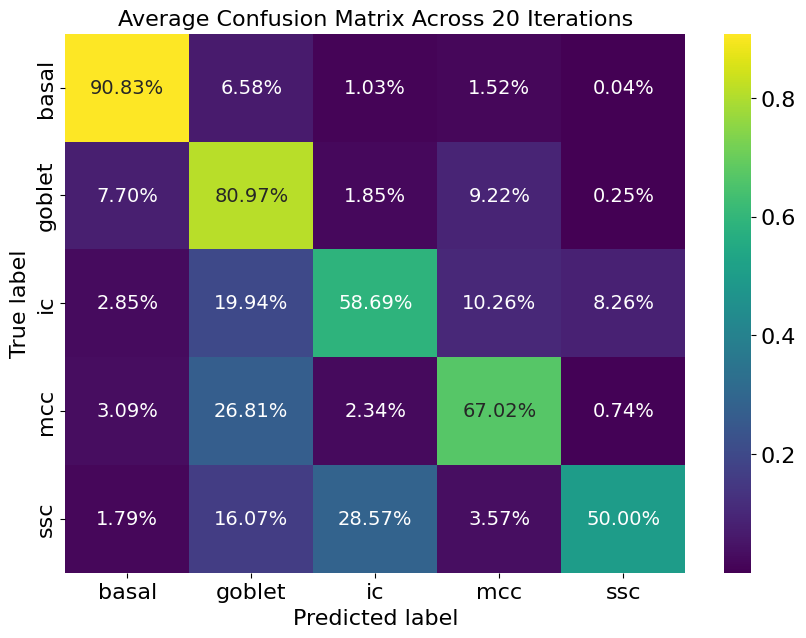

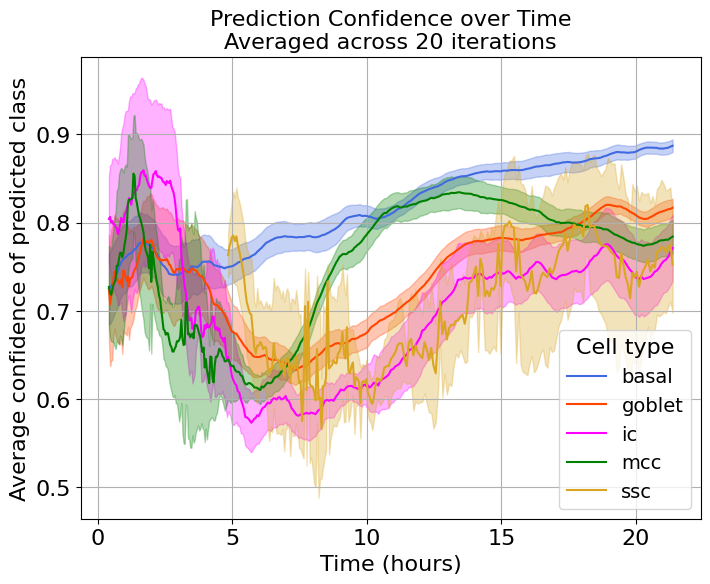

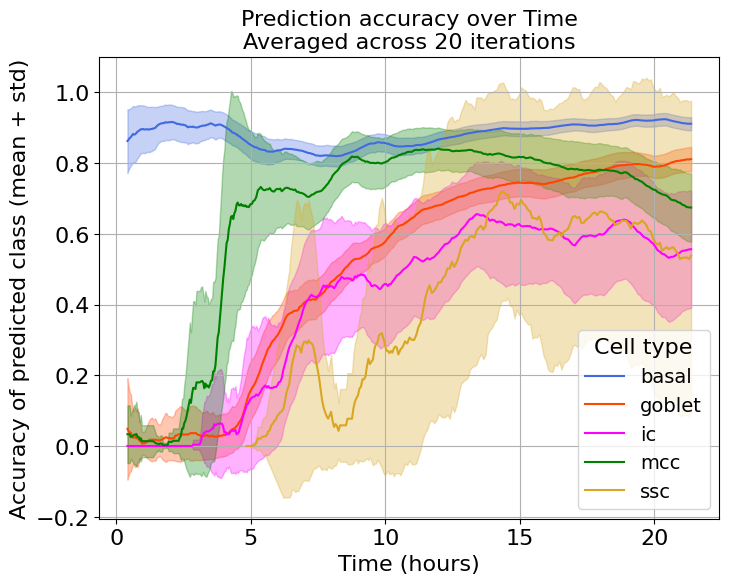

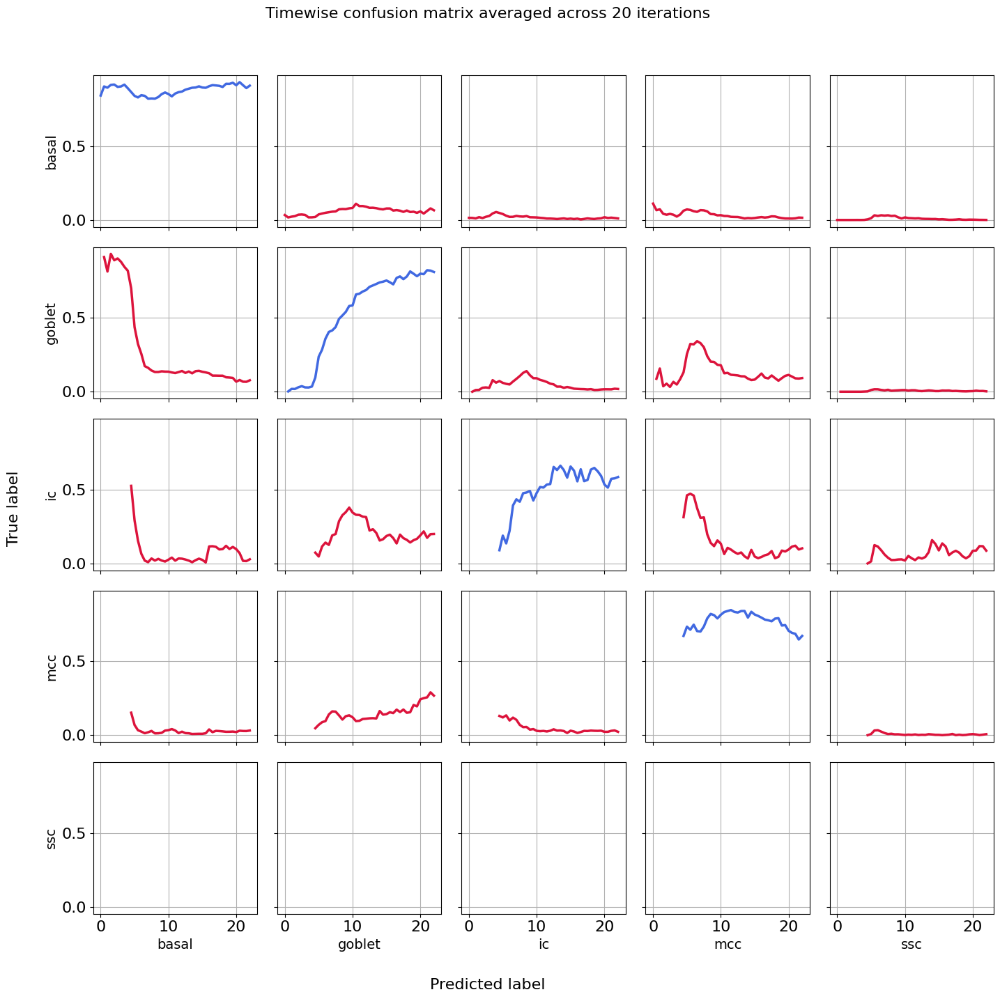

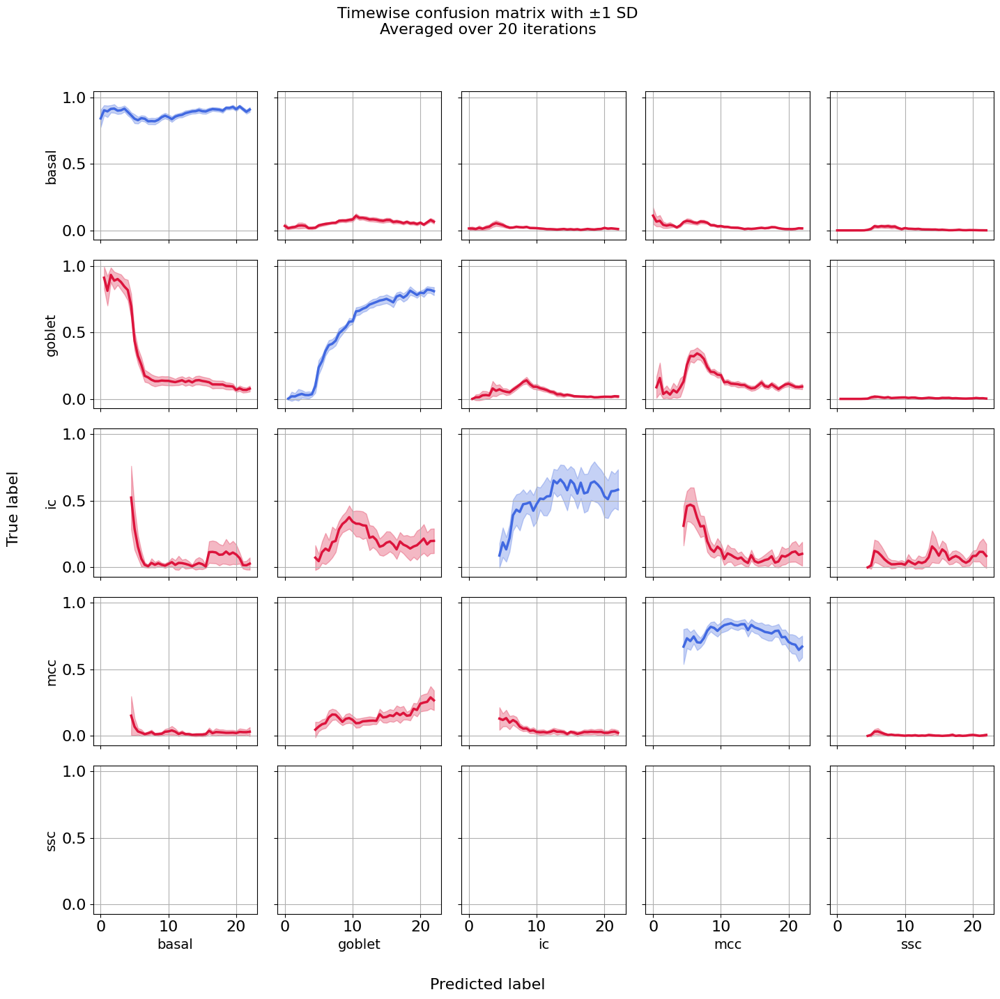

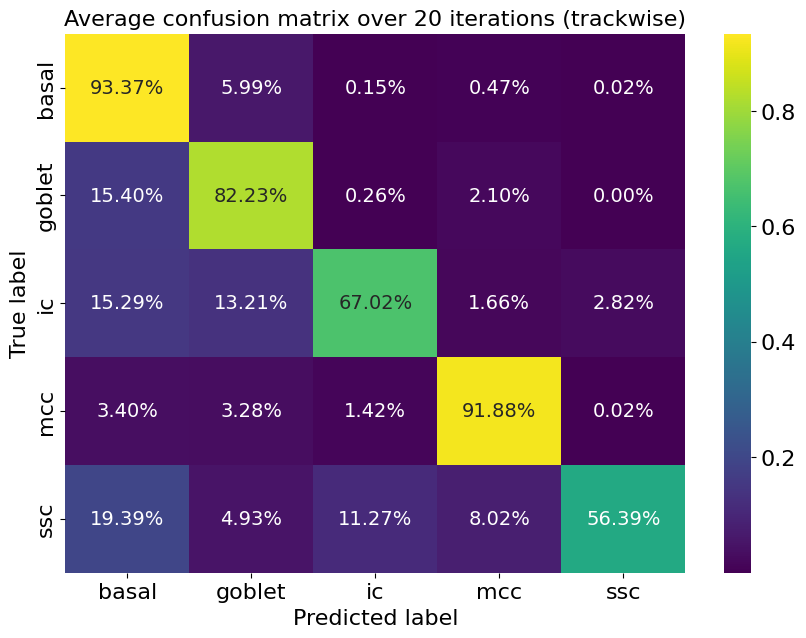

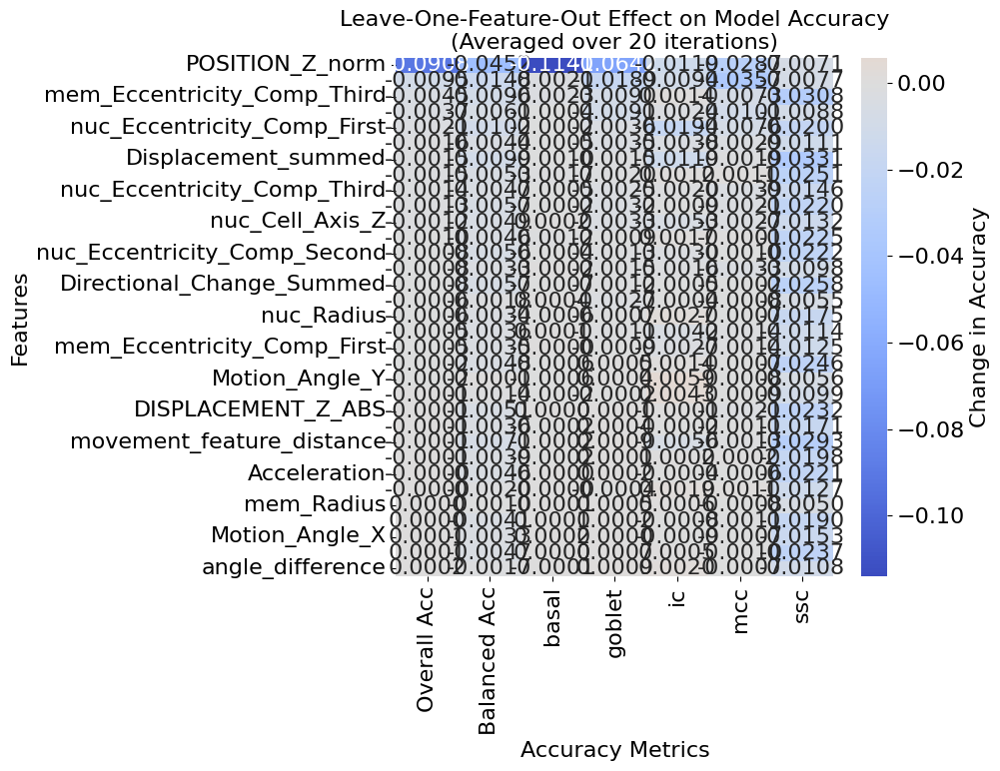

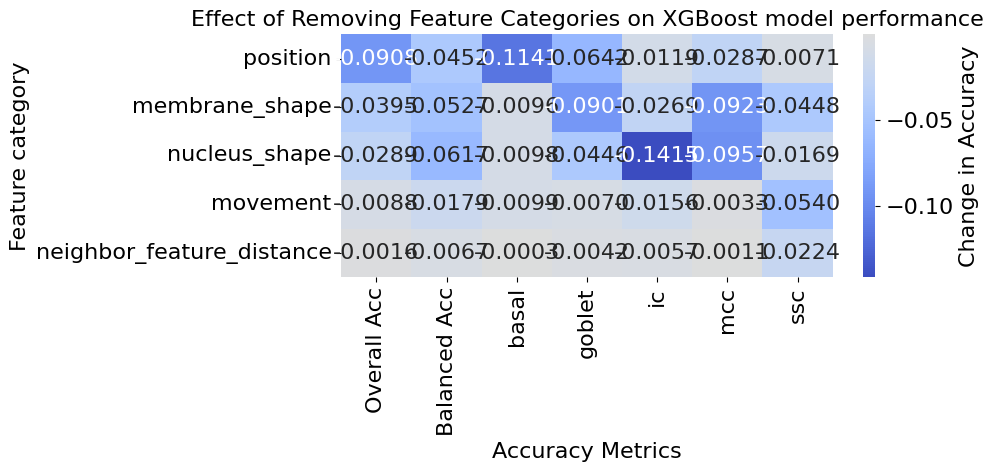

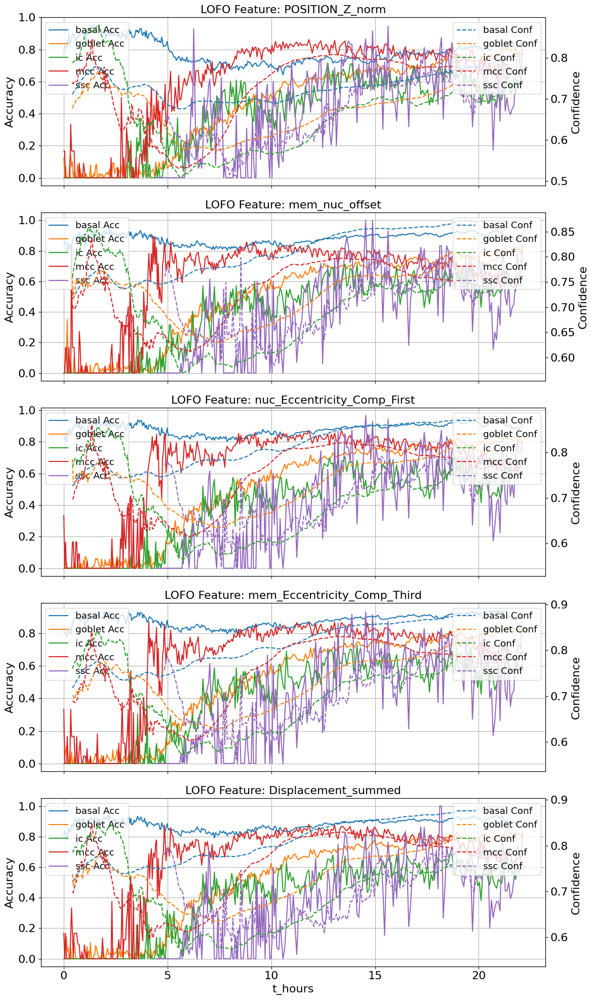

=== Mean Metrics Across Iterations, XGBoost ===
accuracy             0.796769
balanced_accuracy    0.657288
precision_macro      0.513967
recall_macro         0.657288
f1_macro             0.546719
dtype: float64


In [167]:
# Metrics summary
metrics_df_cropped = pd.DataFrame(all_metrics_cropped)
mean_metrics_cropped = metrics_df_cropped.mean()
std_metrics_cropped = metrics_df_cropped.std()

if use_logreg:
    # Metrics summary
    metrics_df_logreg_cropped = pd.DataFrame(all_metrics_logreg_cropped)
    mean_metrics_logreg_cropped = metrics_df_logreg_cropped.mean()
    std_metrics_logreg_cropped = metrics_df_logreg_cropped.std()

# Average confusion matrix (normalized)
avg_cm_cropped = np.mean(all_conf_matrices_cropped, axis=0)
avg_cm_normalized_cropped = avg_cm_cropped.astype('float') / avg_cm_cropped.sum(axis=1)[:, np.newaxis]

# Combine all confidence curves
combined_conf_df_cropped = pd.concat(all_smoothed_confidences_cropped)

# Average across iterations
average_confidence_over_time_cropped = (
    combined_conf_df_cropped
    .groupby(['t_hours', 'cell_type'])
    .agg(avg_smoothed_conf=('smoothed_confidence', 'mean'))
    .reset_index()
)

# Combine per-iteration accuracy
combined_accuracy_df_cropped = pd.concat(all_accuracy_dfs_cropped)
combined_total_accuracy_df_cropped = pd.concat(all_total_accuracy_dfs_cropped)

# Average over iterations
average_accuracy_df_cropped = (
    combined_accuracy_df_cropped
    .groupby(['t_hours', 'cell_type'])
    .agg(avg_accuracy=('accuracy', 'mean'))
    .reset_index()
)

average_total_accuracy_df_cropped = (
    combined_total_accuracy_df_cropped
    .groupby('t_hours')
    .agg(avg_total_accuracy=('total_accuracy', 'mean'))
    .reset_index()
)

# Prepare structure to sum across iterations
aggregated_cm_by_time_cropped = defaultdict(lambda: np.zeros((num_classes, num_classes)))

for cm_by_time in all_cm_by_time_cropped:
    for t_bin, cm in cm_by_time.items():
        aggregated_cm_by_time_cropped[t_bin] += cm  # Add confusion matrices per bin

# Average them
for t_bin in aggregated_cm_by_time_cropped:
    aggregated_cm_by_time_cropped[t_bin] /= n_iterations

# Turn averaged CM into a time series DataFrame
time_series_df_cropped = []

for t_bin, cm in aggregated_cm_by_time_cropped.items():
    for i, true_class in enumerate(class_labels):
        for j, pred_class in enumerate(class_labels):
            time_series_df_cropped.append({
                "Time": t_bin,
                "True Class": true_class,
                "Predicted Class": pred_class,
                "Value": cm[i, j]
            })

time_series_df_cropped = pd.DataFrame(time_series_df_cropped)

# Step 1: Sum all confusion matrices
summed_cm_cropped = np.sum(all_trackwise_confusion_matrices_cropped, axis=0)

# Step 2: Normalize by row (i.e., true class) to get proportions
avg_trackwise_cm_cropped = summed_cm_cropped.astype(float) / summed_cm_cropped.sum(axis=1, keepdims=True)



average_lofo_df_cropped = cumulative_lofo_df_cropped / valid_lofo_iterations_cropped

# Average category-wise LOFO results
average_category_lofo_df_cropped = cumulative_category_lofo_df_cropped / valid_category_lofo_iterations_cropped

# Plot averaged confusion matrix
plt.figure(figsize=(10, 7))
sns.heatmap(avg_cm_normalized_cropped, annot=True, fmt='.2%', cmap='viridis',
            xticklabels=class_labels, yticklabels=class_labels, annot_kws={"size": 14})
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title(f'Average Confusion Matrix Across {n_iterations} Iterations')
plt.show()

# Compute mean and std of smoothed confidence
confidence_stats_df_cropped = (
    combined_conf_df_cropped
    .groupby(['t_hours', 'cell_type'])['smoothed_confidence']
    .agg(['mean', 'std'])
    .reset_index()
    .rename(columns={'mean': 'avg_smoothed_conf', 'std': 'std_smoothed_conf'})
)

# Plot with confidence intervals
plt.figure(figsize=(8, 6))

for cell_type, group_df in confidence_stats_df_cropped.groupby('cell_type'):
    plt.plot(group_df['t_hours'], group_df['avg_smoothed_conf'], label=cell_type, color=colors_dict[cell_type])
    plt.fill_between(
        group_df['t_hours'],
        group_df['avg_smoothed_conf'] - group_df['std_smoothed_conf'],
        group_df['avg_smoothed_conf'] + group_df['std_smoothed_conf'],
        alpha=0.3,
        color=colors_dict[cell_type]
    )

plt.xlabel('Time (hours)')
plt.ylabel('Average confidence of predicted class')
plt.title(f'Prediction Confidence over Time\nAveraged across {n_iterations} iterations')
plt.legend(title='Cell type')
plt.grid(True)
plt.show()


# Plot average timewise prediction accuracy
# Compute mean and std
accuracy_stats_df_cropped = (
    combined_accuracy_df_cropped
    .groupby(['t_hours', 'cell_type'])['accuracy']
    .agg(['mean', 'std'])
    .reset_index()
    .rename(columns={'mean': 'avg_accuracy', 'std': 'std_accuracy'})
)

# Apply smoothing
window_size = 20
plt.figure(figsize=(8, 6))

for cell_type, group_df in accuracy_stats_df_cropped.groupby('cell_type'):
    group_df = group_df.sort_values('t_hours')
    group_df['smoothed_accuracy'] = group_df['avg_accuracy'].rolling(window=window_size, center=True).mean()
    group_df['smoothed_std'] = group_df['std_accuracy'].rolling(window=window_size, center=True).mean()
    
    plt.plot(group_df['t_hours'], group_df['smoothed_accuracy'], label=cell_type, color=colors_dict[cell_type])
    plt.fill_between(
        group_df['t_hours'],
        group_df['smoothed_accuracy'] - group_df['smoothed_std'],
        group_df['smoothed_accuracy'] + group_df['smoothed_std'],
        alpha=0.3,
        color=colors_dict[cell_type]
    )

plt.xlabel('Time (hours)')
plt.ylabel('Accuracy of predicted class (mean + std)')
plt.title(f'Prediction accuracy over Time\nAveraged across {n_iterations} iterations')
plt.legend(title='Cell type')
plt.grid(True)
plt.show()

#Plot average timewise confusion matrix
fig, axes = plt.subplots(num_classes, num_classes, figsize=(15, 15), sharex=True, sharey=True)

for i, true_class in enumerate(class_labels):
    for j, pred_class in enumerate(class_labels):
        ax = axes[i, j]
        plot_data = time_series_df_cropped[(time_series_df_cropped["True Class"] == true_class) & 
                                   (time_series_df_cropped["Predicted Class"] == pred_class)]
        sns.lineplot(data=plot_data, x="Time", y="Value", ax=ax, 
                     color='royalblue' if i == j else 'crimson', linewidth=2.5)
        if j == 0:
            ax.set_ylabel(true_class, fontsize=14)
        if i == num_classes - 1:
            ax.set_xlabel(pred_class, fontsize=14)
        ax.grid(True)

fig.text(0.04, 0.5, "True label", va='center', rotation=90, fontsize=16)
fig.text(0.5, 0.04, "Predicted label", ha='center', fontsize=16)
plt.suptitle(f"Timewise confusion matrix averaged across {n_iterations} iterations", fontsize=16)
plt.tight_layout(rect=[0.06, 0.06, 1, 0.96])
plt.show()

# New structure to store values across iterations
cm_time_series_dict_cropped = defaultdict(list)  # key: (t_bin, true_class, pred_class) -> list of values

# Collect all values from each iteration
for cm_by_time in all_cm_by_time_cropped:
    for t_bin, cm in cm_by_time.items():
        for i in range(num_classes):
            for j in range(num_classes):
                cm_time_series_dict_cropped[(t_bin, i, j)].append(cm[i, j])

time_series_stats_cropped = []

for (t_bin, i, j), values in cm_time_series_dict_cropped.items():
    time_series_stats_cropped.append({
        "Time": t_bin,
        "True Class": class_labels[i],
        "Predicted Class": class_labels[j],
        "Mean": np.mean(values),
        "Std": np.std(values),
    })

time_series_stats_df_cropped = pd.DataFrame(time_series_stats_cropped)

fig, axes = plt.subplots(num_classes, num_classes, figsize=(15, 15), sharex=True, sharey=True)

for i, true_class in enumerate(class_labels):
    for j, pred_class in enumerate(class_labels):
        ax = axes[i, j]
        plot_data = time_series_stats_df_cropped[
            (time_series_stats_df_cropped["True Class"] == true_class) &
            (time_series_stats_df_cropped["Predicted Class"] == pred_class)
        ].sort_values("Time")
        plot_data = plot_data.dropna(subset=["Mean", "Std"])
        
        color = 'royalblue' if i == j else 'crimson'

        # Plot the mean line
        ax.plot(plot_data["Time"], plot_data["Mean"], color=color, linewidth=2.5)

        # Plot the confidence interval
        ax.fill_between(
            plot_data["Time"],
            plot_data["Mean"] - plot_data["Std"],
            plot_data["Mean"] + plot_data["Std"],
            color=color,
            alpha=0.3
        )

        if j == 0:
            ax.set_ylabel(true_class, fontsize=14)
        if i == num_classes - 1:
            ax.set_xlabel(pred_class, fontsize=14)
        ax.grid(True)

fig.text(0.04, 0.5, "True label", va='center', rotation=90, fontsize=16)
fig.text(0.5, 0.04, "Predicted label", ha='center', fontsize=16)
plt.suptitle(f"Timewise confusion matrix with ±1 SD\nAveraged over {n_iterations} iterations", fontsize=16)
plt.tight_layout(rect=[0.06, 0.06, 1, 0.96])
plt.show()


#Plot trackwise average confusion matrix

plt.figure(figsize=(10, 7))
sns.heatmap(
    avg_trackwise_cm_cropped,
    annot=True,
    fmt='.2%',
    cmap='viridis',
    xticklabels=class_labels,
    yticklabels=class_labels,
    annot_kws={"size": 14}
)
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title(f'Average confusion matrix over {n_iterations} iterations (trackwise)')
# plt.savefig("plots/model_trackwise_confusion_avg.pdf")
plt.show()

#Plot average feature importance heatmap
# Sort features by overall accuracy impact
sorted_lofo_df_cropped = average_lofo_df_cropped.sort_values(by='Overall Acc', ascending=True)

plt.figure(figsize=(10, 8))
sns.heatmap(sorted_lofo_df_cropped, annot=True, fmt=".4f", cmap='coolwarm', center=0, cbar_kws={'label': 'Change in Accuracy'})
plt.title(f'Leave-One-Feature-Out Effect on Model Accuracy\n(Averaged over {valid_lofo_iterations_cropped} iterations)')
plt.xlabel('Accuracy Metrics')
plt.ylabel('Features')
plt.tight_layout()
# plt.savefig('plots/feature_importance_lofo_avg.pdf')
plt.show()

#Plot average feature importance heatmap
# Sort features by overall accuracy impact
sorted_category_lofo_df_cropped = average_category_lofo_df_cropped.sort_values(by='Overall Acc', ascending=True)

plt.figure(figsize=(10, 5))
sns.heatmap(sorted_category_lofo_df_cropped, annot=True, fmt=".4f", cmap='coolwarm', center=0, cbar_kws={'label': 'Change in Accuracy'})
plt.title('Effect of Removing Feature Categories on XGBoost model performance')
plt.xlabel('Accuracy Metrics')
plt.ylabel('Feature category')
plt.tight_layout()
# plt.savefig('plots/feature_importance_lofo_avg.pdf')
plt.show()


# ---- Settings ----
top_n = 5
top_features_cropped = average_lofo_df_cropped.mean(axis=1).sort_values().head(top_n).index.tolist()

fig, axes = plt.subplots(top_n, 1, figsize=(12, 4 * top_n), sharex=True)

if top_n == 1:
    axes = [axes]  # Ensure iterable

# ---- Plot loop ----
for i, feature in enumerate(top_features_cropped):
    # Gather accuracy and confidence curves for this feature across iterations
    all_acc_dfs_cropped = [d[feature] for d in all_lofo_accuracy_curves_cropped if feature in d]
    all_conf_dfs_cropped = [d[feature] for d in all_lofo_confidence_curves_cropped if feature in d]

    # Concatenate and average
    acc_concat_cropped = pd.concat(all_acc_dfs_cropped)
    conf_concat_cropped = pd.concat(all_conf_dfs_cropped)

    acc_avg_cropped = acc_concat_cropped.groupby(['t_hours', 'cell_type']).mean().reset_index()
    conf_avg_cropped = conf_concat_cropped.groupby(['t_hours', 'cell_type']).mean().reset_index()

    ax1 = axes[i]
    ax2 = ax1.twinx()

    for cell_type in acc_avg_cropped['cell_type'].unique():
        acc_vals_cropped = acc_avg_cropped[acc_avg_cropped['cell_type'] == cell_type]
        conf_vals_cropped = conf_avg_cropped[conf_avg_cropped['cell_type'] == cell_type]

        # Plot accuracy
        sns.lineplot(
            data=acc_vals_cropped,
            x='t_hours',
            y='accuracy',
            ax=ax1,
            label=f'{cell_type} Acc',
            linestyle='-'
        )

        # Plot confidence (dashed)
        sns.lineplot(
            data=conf_vals_cropped,
            x='t_hours',
            y='smoothed_confidence',
            ax=ax2,
            label=f'{cell_type} Conf',
            linestyle='--'
        )

    ax1.set_ylabel('Accuracy')
    ax2.set_ylabel('Confidence')
    ax1.set_title(f"LOFO Feature: {feature}")
    ax1.grid(True)
    ax1.legend(loc='upper left', fontsize='small')
    ax2.legend(loc='upper right', fontsize='small')

plt.xlabel('Time (t_hours)')
plt.tight_layout()
plt.show()

#use_logreg = True
if use_logreg:
    # Average confusion matrix (normalized)
    avg_cm_logreg_cropped = np.mean(all_conf_matrices_logreg_cropped, axis=0)
    avg_cm_normalized_logreg_cropped = avg_cm_logreg_cropped.astype('float') / avg_cm_logreg_cropped.sum(axis=1)[:, np.newaxis]

    # Step 1: Sum all confusion matrices
    summed_cm_logreg_cropped = np.sum(all_trackwise_confusion_matrices_logreg_cropped, axis=0)

    # Step 2: Normalize by row (i.e., true class) to get proportions
    avg_trackwise_cm_logreg_cropped = summed_cm_logreg_cropped.astype(float) / summed_cm_logreg_cropped.sum(axis=1, keepdims=True)

    # Plot averaged confusion matrix
    plt.figure(figsize=(10, 7))
    sns.heatmap(avg_cm_normalized_logreg_cropped, annot=True, fmt='.2%', cmap='viridis',
                xticklabels=class_labels, yticklabels=class_labels, annot_kws={"size": 14})
    plt.xlabel('Predicted label')
    plt.ylabel('True label')
    plt.title(f'Average Confusion Matrix Across {n_iterations} Iterations, logistic regression')
    plt.show()

    #Plot trackwise average confusion matrix

    plt.figure(figsize=(10, 7))
    sns.heatmap(
        avg_trackwise_cm_logreg_cropped,
        annot=True,
        fmt='.2%',
        cmap='viridis',
        xticklabels=class_labels,
        yticklabels=class_labels,
        annot_kws={"size": 14}
    )
    plt.xlabel('Predicted label')
    plt.ylabel('True label')
    plt.title(f'Average confusion matrix over {n_iterations} iterations (trackwise), logistic regression')
    # plt.savefig("plots/model_trackwise_confusion_avg.pdf")
    plt.show()


# Optionally print the average metrics
print("=== Mean Metrics Across Iterations, XGBoost ===")
print(mean_metrics_cropped)

if use_logreg:
    # Optionally print the average metrics
    print("=== Mean Metrics Across Iterations, Logistic regression ===")
    print(mean_metrics_logreg_cropped)

### Multiple iterations with logistic regressor only

In [204]:
def run_single_iteration_logreg(train_df2, selected_features, class_labels):
    # Split into train/test
    train_tracks_df= pd.DataFrame(columns=train_df2.columns)
    test_tracks_df = pd.DataFrame(columns=train_df2.columns)

    for celltype in ['basal', 'goblet', 'mcc', 'ic', 'ssc']:
        data_frame = train_df2[train_df2['cell_type'] == celltype]
        track_counts = data_frame['Spot track ID relabelled'].value_counts()
        track_weights = track_counts / track_counts.sum()
        test_size = int(0.2 * len(track_counts))
        test_ids = np.random.choice(track_counts.index, size=test_size, replace=False, p=track_weights)
        train_ids = track_counts.index.difference(test_ids)

        train_df_celltype = data_frame[data_frame['Spot track ID relabelled'].isin(train_ids)]
        test_df_celltype = data_frame[data_frame['Spot track ID relabelled'].isin(test_ids)]

        train_tracks_df = pd.concat([train_tracks_df, train_df_celltype])
        test_tracks_df = pd.concat([test_tracks_df, test_df_celltype])

    # Balance training set
    train_tracks_df_balanced_undersampled, target_class_size = weighted_undersample_majorityclasses(
        train_tracks_df, target_class='mcc', target_col='cell_type', stratify_col='t_hours', bins=10
    )
    train_tracks_df_balanced_oversampled = weighted_oversample_minorityclasses(
        train_tracks_df, target_size=target_class_size, target_col='cell_type', stratify_col='t_hours', bins=10
    )

    train_tracks_df_balanced_undersampled_cropped = train_tracks_df_balanced_undersampled[
        train_tracks_df_balanced_oversampled.columns
    ]
    train_tracks_df_balanced = pd.concat([train_tracks_df_balanced_undersampled_cropped, train_tracks_df_balanced_oversampled])

    # Feature selection
    train_independent_variables = train_tracks_df_balanced[['t_hours'] + selected_features]
    test_independent_variables = test_tracks_df[['t_hours'] + selected_features]

    train_dependent_variables = train_tracks_df_balanced['cell_type']
    test_dependent_variables = test_tracks_df['cell_type']

    labelencoder = LabelEncoder()
    y_train = labelencoder.fit_transform(train_dependent_variables)
    y_test = labelencoder.transform(test_dependent_variables)

    # Train model
    model = LogisticRegression(
        solver='saga',
        penalty='l1',
        multi_class='multinomial',
        max_iter=1000
    )
    model.fit(train_independent_variables, y_train)
    y_pred = model.predict(test_independent_variables)

    # Calculate metrics
    metrics = {
        'accuracy': accuracy_score(y_test, y_pred),
        'precision_macro': precision_score(y_test, y_pred, average='macro', zero_division=0),
        'recall_macro': recall_score(y_test, y_pred, average='macro', zero_division=0),
        'f1_macro': f1_score(y_test, y_pred, average='macro', zero_division=0)
    }

    # Confusion matrix
    cm = confusion_matrix(y_test, y_pred, labels=range(len(class_labels)))

    # Add predicted labels to test dataframe
    test_tracks_df = test_tracks_df.copy()
    test_tracks_df['prediction_label'] = labelencoder.inverse_transform(y_pred)
    test_tracks_df['is_correct'] = test_tracks_df['cell_type'] == test_tracks_df['prediction_label']


    test_tracks_df['prediction'] = y_pred
    test_tracks_df['prediction_label'] = labelencoder.inverse_transform(y_pred)

    # Step: Aggregate to track level
    def most_frequent_label(labels):
        counts = labels.value_counts()
        #if counts.index[0] == "unknown" and len(counts) > 1:
        #    return counts.index[1]
        return counts.index[0]

    track_summary_auto = test_tracks_df.groupby('Spot track ID relabelled_auto').agg({
        'prediction_label': most_frequent_label
    }).reset_index()

    # Convert to dictionary
    pred_dict = dict(zip(track_summary_auto['Spot track ID relabelled_auto'], track_summary_auto['prediction_label']))

    test_tracks_df['prediction_trackwise'] = test_tracks_df['Spot track ID relabelled_auto'].map(pred_dict)

    # Compute confusion matrix
    cm_trackwise = confusion_matrix(test_tracks_df['cell_type'], test_tracks_df['prediction_trackwise'], labels=class_labels)

    coefficients = model.coef_  # Shape: (n_classes, n_features)


    return (
    metrics,
    cm,
    cm_trackwise,
    coefficients
    )



In [205]:
n_iterations = 20
all_metrics_logreg = []
all_conf_matrices_logreg = []
all_trackwise_confusion_matrices_logreg = []
all_coefficients = []

class_labels = ['basal', 'goblet', 'ic', 'mcc', 'ssc'] 
cell_type_dict = {'basal' : 0, 'goblet' : 1, 'ic' : 2, 'mcc' : 3, 'ssc' : 4}
num_classes = 5


for i in range(n_iterations):
    print(f"Running iteration {i+1}/{n_iterations}")
    metrics, cm, cm_trackwise, coefs = run_single_iteration_logreg(train_df2, ordered_features, class_labels)
    
    all_metrics_logreg.append(metrics)
    all_conf_matrices_logreg.append(cm)
    all_trackwise_confusion_matrices_logreg.append(cm_trackwise)
    all_coefficients.append(coefs)

Running iteration 1/20


C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded["t_hours_bin"] = pd.qcut(df_encoded[stratify_col], q=bins, duplicates="drop")
C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded[target_col] = label_encoder.fit_transform(df_encoded[target_col])
c:\Users\ghr283\Anaconda3\envs\kapoorlabsenv3\lib\site-packages\sklearn\linear_model\_logistic.py:1247: FutureWarnin

Running iteration 2/20


C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded["t_hours_bin"] = pd.qcut(df_encoded[stratify_col], q=bins, duplicates="drop")
C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded[target_col] = label_encoder.fit_transform(df_encoded[target_col])
c:\Users\ghr283\Anaconda3\envs\kapoorlabsenv3\lib\site-packages\sklearn\linear_model\_logistic.py:1247: FutureWarnin

Running iteration 3/20


C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded["t_hours_bin"] = pd.qcut(df_encoded[stratify_col], q=bins, duplicates="drop")
C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded[target_col] = label_encoder.fit_transform(df_encoded[target_col])
c:\Users\ghr283\Anaconda3\envs\kapoorlabsenv3\lib\site-packages\sklearn\linear_model\_logistic.py:1247: FutureWarnin

Running iteration 4/20


C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded["t_hours_bin"] = pd.qcut(df_encoded[stratify_col], q=bins, duplicates="drop")
C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded[target_col] = label_encoder.fit_transform(df_encoded[target_col])
c:\Users\ghr283\Anaconda3\envs\kapoorlabsenv3\lib\site-packages\sklearn\linear_model\_logistic.py:1247: FutureWarnin

Running iteration 5/20


C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded["t_hours_bin"] = pd.qcut(df_encoded[stratify_col], q=bins, duplicates="drop")
C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded[target_col] = label_encoder.fit_transform(df_encoded[target_col])
c:\Users\ghr283\Anaconda3\envs\kapoorlabsenv3\lib\site-packages\sklearn\linear_model\_logistic.py:1247: FutureWarnin

Running iteration 6/20


C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded["t_hours_bin"] = pd.qcut(df_encoded[stratify_col], q=bins, duplicates="drop")
C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded[target_col] = label_encoder.fit_transform(df_encoded[target_col])
c:\Users\ghr283\Anaconda3\envs\kapoorlabsenv3\lib\site-packages\sklearn\linear_model\_logistic.py:1247: FutureWarnin

Running iteration 7/20


C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded["t_hours_bin"] = pd.qcut(df_encoded[stratify_col], q=bins, duplicates="drop")
C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded[target_col] = label_encoder.fit_transform(df_encoded[target_col])
c:\Users\ghr283\Anaconda3\envs\kapoorlabsenv3\lib\site-packages\sklearn\linear_model\_logistic.py:1247: FutureWarnin

Running iteration 8/20


C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded["t_hours_bin"] = pd.qcut(df_encoded[stratify_col], q=bins, duplicates="drop")
C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded[target_col] = label_encoder.fit_transform(df_encoded[target_col])
c:\Users\ghr283\Anaconda3\envs\kapoorlabsenv3\lib\site-packages\sklearn\linear_model\_logistic.py:1247: FutureWarnin

Running iteration 9/20


C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded["t_hours_bin"] = pd.qcut(df_encoded[stratify_col], q=bins, duplicates="drop")
C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded[target_col] = label_encoder.fit_transform(df_encoded[target_col])
c:\Users\ghr283\Anaconda3\envs\kapoorlabsenv3\lib\site-packages\sklearn\linear_model\_logistic.py:1247: FutureWarnin

Running iteration 10/20


C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded["t_hours_bin"] = pd.qcut(df_encoded[stratify_col], q=bins, duplicates="drop")
C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded[target_col] = label_encoder.fit_transform(df_encoded[target_col])
c:\Users\ghr283\Anaconda3\envs\kapoorlabsenv3\lib\site-packages\sklearn\linear_model\_logistic.py:1247: FutureWarnin

Running iteration 11/20


C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded["t_hours_bin"] = pd.qcut(df_encoded[stratify_col], q=bins, duplicates="drop")
C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded[target_col] = label_encoder.fit_transform(df_encoded[target_col])
c:\Users\ghr283\Anaconda3\envs\kapoorlabsenv3\lib\site-packages\sklearn\linear_model\_logistic.py:1247: FutureWarnin

Running iteration 12/20


C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded["t_hours_bin"] = pd.qcut(df_encoded[stratify_col], q=bins, duplicates="drop")
C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded[target_col] = label_encoder.fit_transform(df_encoded[target_col])
c:\Users\ghr283\Anaconda3\envs\kapoorlabsenv3\lib\site-packages\sklearn\linear_model\_logistic.py:1247: FutureWarnin

Running iteration 13/20


C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded["t_hours_bin"] = pd.qcut(df_encoded[stratify_col], q=bins, duplicates="drop")
C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded[target_col] = label_encoder.fit_transform(df_encoded[target_col])
c:\Users\ghr283\Anaconda3\envs\kapoorlabsenv3\lib\site-packages\sklearn\linear_model\_logistic.py:1247: FutureWarnin

Running iteration 14/20


C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded["t_hours_bin"] = pd.qcut(df_encoded[stratify_col], q=bins, duplicates="drop")
C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded[target_col] = label_encoder.fit_transform(df_encoded[target_col])
c:\Users\ghr283\Anaconda3\envs\kapoorlabsenv3\lib\site-packages\sklearn\linear_model\_logistic.py:1247: FutureWarnin

Running iteration 15/20


C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded["t_hours_bin"] = pd.qcut(df_encoded[stratify_col], q=bins, duplicates="drop")
C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded[target_col] = label_encoder.fit_transform(df_encoded[target_col])
c:\Users\ghr283\Anaconda3\envs\kapoorlabsenv3\lib\site-packages\sklearn\linear_model\_logistic.py:1247: FutureWarnin

Running iteration 16/20


C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded["t_hours_bin"] = pd.qcut(df_encoded[stratify_col], q=bins, duplicates="drop")
C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded[target_col] = label_encoder.fit_transform(df_encoded[target_col])
c:\Users\ghr283\Anaconda3\envs\kapoorlabsenv3\lib\site-packages\sklearn\linear_model\_logistic.py:1247: FutureWarnin

Running iteration 17/20


C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded["t_hours_bin"] = pd.qcut(df_encoded[stratify_col], q=bins, duplicates="drop")
C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded[target_col] = label_encoder.fit_transform(df_encoded[target_col])
c:\Users\ghr283\Anaconda3\envs\kapoorlabsenv3\lib\site-packages\sklearn\linear_model\_logistic.py:1247: FutureWarnin

Running iteration 18/20


C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded["t_hours_bin"] = pd.qcut(df_encoded[stratify_col], q=bins, duplicates="drop")
C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded[target_col] = label_encoder.fit_transform(df_encoded[target_col])
c:\Users\ghr283\Anaconda3\envs\kapoorlabsenv3\lib\site-packages\sklearn\linear_model\_logistic.py:1247: FutureWarnin

Running iteration 19/20


C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded["t_hours_bin"] = pd.qcut(df_encoded[stratify_col], q=bins, duplicates="drop")
C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded[target_col] = label_encoder.fit_transform(df_encoded[target_col])
c:\Users\ghr283\Anaconda3\envs\kapoorlabsenv3\lib\site-packages\sklearn\linear_model\_logistic.py:1247: FutureWarnin

Running iteration 20/20


C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded["t_hours_bin"] = pd.qcut(df_encoded[stratify_col], q=bins, duplicates="drop")
C:\Users\ghr283\AppData\Local\Temp\ipykernel_31240\1869988770.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_encoded[target_col] = label_encoder.fit_transform(df_encoded[target_col])
c:\Users\ghr283\Anaconda3\envs\kapoorlabsenv3\lib\site-packages\sklearn\linear_model\_logistic.py:1247: FutureWarnin

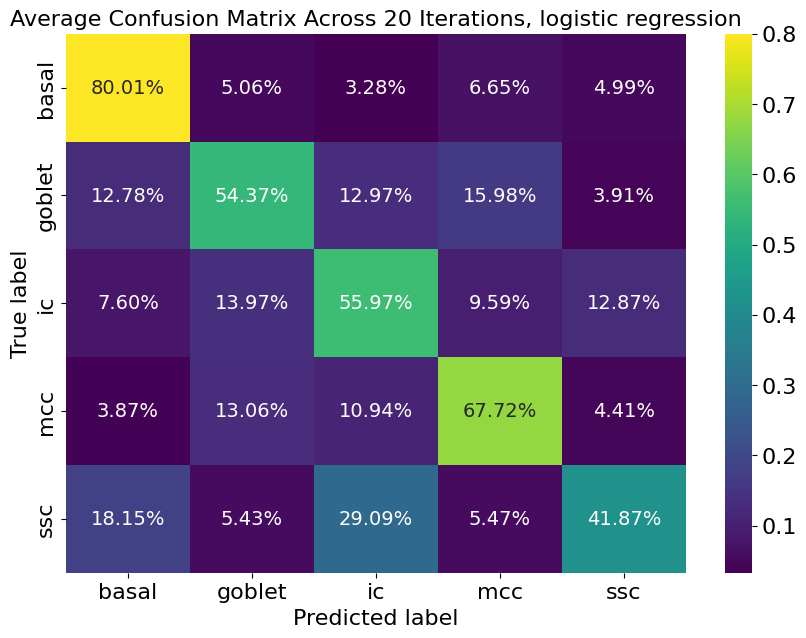

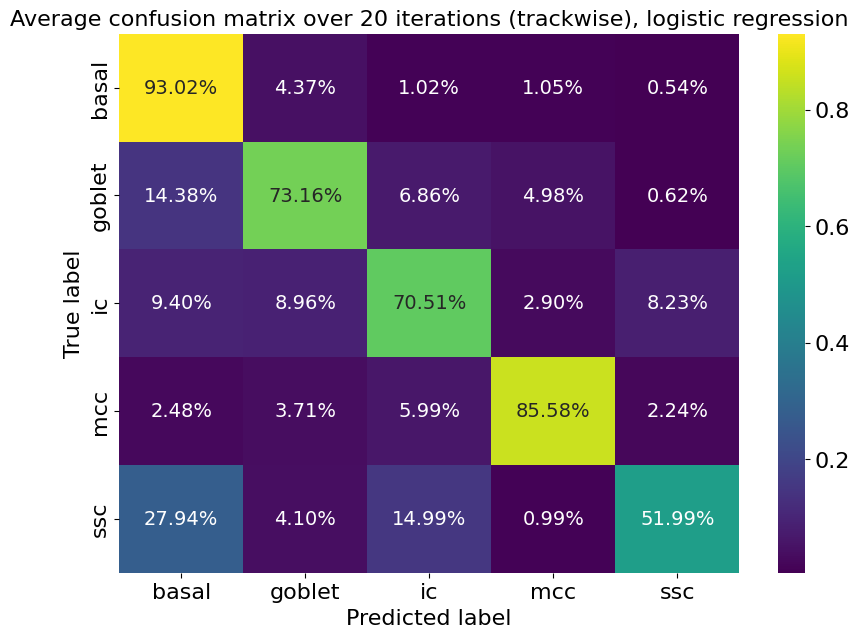

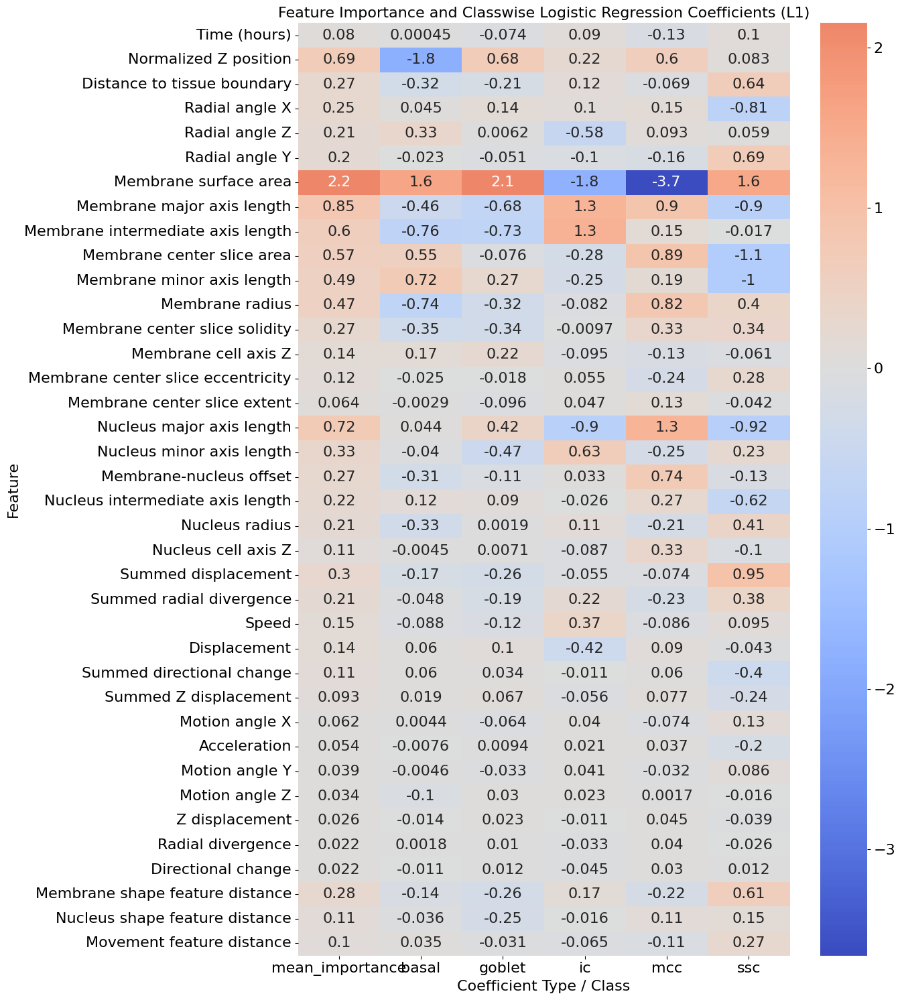

In [250]:
colors_dict = {'basal' : 'royalblue', 'goblet' : 'orangered', 'ic' : 'magenta', 'mcc' : 'green', 'ssc' : 'goldenrod'}

# Metrics summary
metrics_df_logreg = pd.DataFrame(all_metrics_logreg)
mean_metrics_logreg = metrics_df_logreg.mean()
std_metrics_logreg = metrics_df_logreg.std()

# Average confusion matrix (normalized)
avg_cm_logreg = np.mean(all_conf_matrices_logreg, axis=0)
avg_cm_normalized_logreg = avg_cm_logreg.astype('float') / avg_cm_logreg.sum(axis=1)[:, np.newaxis]

# Step 1: Sum all confusion matrices
summed_cm_logreg = np.sum(all_trackwise_confusion_matrices_logreg, axis=0)

# Step 2: Normalize by row (i.e., true class) to get proportions
avg_trackwise_cm_logreg = summed_cm_logreg.astype(float) / summed_cm_logreg.sum(axis=1, keepdims=True)

# Plot averaged confusion matrix
plt.figure(figsize=(10, 7))
sns.heatmap(avg_cm_normalized_logreg, annot=True, fmt='.2%', cmap='viridis',
            xticklabels=class_labels, yticklabels=class_labels, annot_kws={"size": 14})
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title(f'Average Confusion Matrix Across {n_iterations} Iterations, logistic regression')
plt.show()

#Plot trackwise average confusion matrix

plt.figure(figsize=(10, 7))
sns.heatmap(
    avg_trackwise_cm_logreg,
    annot=True,
    fmt='.2%',
    cmap='viridis',
    xticklabels=class_labels,
    yticklabels=class_labels,
    annot_kws={"size": 14}
)
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title(f'Average confusion matrix over {n_iterations} iterations (trackwise), logistic regression')
# plt.savefig("plots/model_trackwise_confusion_avg.pdf")
plt.show()

mean_coefficients = np.mean(np.stack(all_coefficients), axis=0)  # shape: (n_classes, n_features)
sparsity_levels = [np.count_nonzero(coefs) / coefs.size for coefs in all_coefficients]
mean_sparsity = np.mean(sparsity_levels)
nonzero_counts_per_class = [np.count_nonzero(coefs, axis=1) for coefs in all_coefficients]  # list of arrays
mean_nonzero_per_class = np.mean(np.stack(nonzero_counts_per_class), axis=0)
mean_abs_coef = np.mean(np.abs(mean_coefficients), axis=0)  # mean over classes

feature_names = ['t_hours'] + ordered_features
# Rename features using ordered_names
pretty_feature_names = [ordered_names.get(f, f) for f in feature_names]

# Create DataFrame with weights and pretty names
weights_df = pd.DataFrame(mean_coefficients.T, index=pretty_feature_names, columns=class_labels)

# Add original feature names as a column for mapping
weights_df['feature_name'] = feature_names  # used to map back to category

# Map categories
weights_df['Category'] = weights_df['feature_name'].map(feature_to_category.get)

# Add mean absolute importance
weights_df['mean_importance'] = mean_abs_coef


# Set category order
category_order = ['time', 'position', 'membrane_shape', 'nucleus_shape', 'movement', 'neighbor_feature_distance']

# Ensure Category is a categorical type with specified order
weights_df['Category'] = pd.Categorical(weights_df['Category'], categories=category_order, ordered=True)

# Sort by category then by importance
weights_df_sorted = weights_df.sort_values(['Category', 'mean_importance'], ascending=[True, False])




# Drop helper columns to get clean heatmap
plot_df = weights_df_sorted.drop(columns=['feature_name', 'Category'])

# Move mean_importance to front again if necessary
plot_df = plot_df[['mean_importance'] + [col for col in class_labels]]

# Plot
plt.figure(figsize=(14, max(6, 0.4 * len(plot_df))))
sns.heatmap(plot_df, annot=True, cmap='coolwarm', center=0,
            linewidths=0, linecolor='grey')

plt.title("Feature Importance and Classwise Logistic Regression Coefficients (L1)")
plt.xlabel("Coefficient Type / Class")
plt.ylabel("Feature")
plt.tight_layout()
plt.savefig('iteration_plots_10_04/logistic_regression_feature_importances_by_category.pdf')
plt.show()

In [206]:
# Optionally print the average metrics
print("=== Mean Metrics Across Iterations ===")
print(mean_metrics_logreg)

=== Mean Metrics Across Iterations ===
accuracy             0.701471
balanced_accuracy    0.623962
precision_macro      0.449205
recall_macro         0.623962
f1_macro             0.452405
dtype: float64


### Simplified multiple iterations

In [223]:
def run_single_iteration_cropped(train_df2, selected_features, class_labels):
    # Split into train/test
    train_tracks_df= pd.DataFrame(columns=train_df2.columns)
    test_tracks_df = pd.DataFrame(columns=train_df2.columns)

    for celltype in ['basal', 'goblet', 'mcc', 'ic', 'ssc']:
        data_frame = train_df2[train_df2['cell_type'] == celltype]
        track_counts = data_frame['Spot track ID relabelled'].value_counts()
        track_weights = track_counts / track_counts.sum()
        test_size = int(0.2 * len(track_counts))
        test_ids = np.random.choice(track_counts.index, size=test_size, replace=False, p=track_weights)
        train_ids = track_counts.index.difference(test_ids)

        train_df_celltype = data_frame[data_frame['Spot track ID relabelled'].isin(train_ids)]
        test_df_celltype = data_frame[data_frame['Spot track ID relabelled'].isin(test_ids)]

        train_tracks_df = pd.concat([train_tracks_df, train_df_celltype])
        test_tracks_df = pd.concat([test_tracks_df, test_df_celltype])

    # Balance training set
    train_tracks_df_balanced_undersampled, target_class_size = weighted_undersample_majorityclasses(
        train_tracks_df, target_class='mcc', target_col='cell_type', stratify_col='t_hours', bins=10
    )
    train_tracks_df_balanced_oversampled, oversample_log = weighted_oversample_minorityclasses_withlog(
        train_tracks_df, target_size=target_class_size, target_col='cell_type', stratify_col='t_hours', bins=10
    )

    train_tracks_df_balanced_undersampled["source"] = "real"

    train_tracks_df_balanced_undersampled_cropped = train_tracks_df_balanced_undersampled[
        train_tracks_df_balanced_oversampled.columns
    ]

    train_tracks_df_balanced_oversampled["source"] = train_tracks_df_balanced_oversampled.get("source", "real")  # in case source not set


    train_tracks_df_balanced = pd.concat([train_tracks_df_balanced_undersampled_cropped, train_tracks_df_balanced_oversampled])

    min_val = np.floor(train_tracks_df_balanced['t_hours'].min() / 2) * 2
    max_val = np.ceil(train_tracks_df_balanced['t_hours'].max() / 2) * 2
    bin_edges = np.arange(min_val, max_val + 2, 2)

    train_tracks_df_balanced["t_hours_bin"] = pd.cut(
        train_tracks_df_balanced["t_hours"],
        bins=bin_edges,
        right=True,
        include_lowest=True
    )

    summary = train_tracks_df_balanced.groupby(
    ["t_hours_bin", "cell_type", "source"]
    ).size().reset_index(name="count")

    
    # Feature selection
    train_independent_variables = train_tracks_df_balanced[['t_hours'] + selected_features]
    test_independent_variables = test_tracks_df[['t_hours'] + selected_features]

    train_dependent_variables = train_tracks_df_balanced['cell_type']
    test_dependent_variables = test_tracks_df['cell_type']

    labelencoder = LabelEncoder()
    y_train = labelencoder.fit_transform(train_dependent_variables)
    y_test = labelencoder.transform(test_dependent_variables)

    # Train model
    model = xgb.XGBClassifier(objective='multi:softprob', num_class=5)
    model.fit(train_independent_variables, y_train)
    y_pred = model.predict(test_independent_variables)

    # Calculate metrics
    metrics = {
        'accuracy': accuracy_score(y_test, y_pred),
        'balanced_accuracy': balanced_accuracy_score(y_test, y_pred),
        'precision_macro': precision_score(y_test, y_pred, average='macro', zero_division=0),
        'recall_macro': recall_score(y_test, y_pred, average='macro', zero_division=0),
        'f1_macro': f1_score(y_test, y_pred, average='macro', zero_division=0)
    }

    # Confusion matrix
    cm = confusion_matrix(y_test, y_pred, labels=range(len(class_labels)))

    test_tracks_df['prediction'] = y_pred
    test_tracks_df['prediction_label'] = labelencoder.inverse_transform(y_pred)

    # Bin time
    bin_size = 0.5
    test_tracks_df['t_bin'] = (test_tracks_df['t_hours'] // bin_size) * bin_size

    # Step: Aggregate to track level
    def most_frequent_label(labels):
        counts = labels.value_counts()
        #if counts.index[0] == "unknown" and len(counts) > 1:
        #    return counts.index[1]
        return counts.index[0]

    track_summary_auto = test_tracks_df.groupby('Spot track ID relabelled_auto').agg({
        'prediction_label': most_frequent_label
    }).reset_index()

    # Convert to dictionary
    pred_dict = dict(zip(track_summary_auto['Spot track ID relabelled_auto'], track_summary_auto['prediction_label']))

    test_tracks_df['prediction_trackwise'] = test_tracks_df['Spot track ID relabelled_auto'].map(pred_dict)

    # Compute confusion matrix
    cm_trackwise = confusion_matrix(test_tracks_df['cell_type'], test_tracks_df['prediction_trackwise'], labels=class_labels)

        # Define baseline and timepoints
    min_cutoff = 0  # or fixed like 0
    max_cutoff = int(test_tracks_df['t_hours'].max())  # e.g., 21
    trackwise_cms_by_time = {}

    for cutoff in range(max_cutoff, min_cutoff - 1, -1):
        # Filter test data by time cutoff
        filtered_df = test_tracks_df[test_tracks_df['t_hours'] >= cutoff]

        if filtered_df.empty:
            continue  # skip if no data at this timepoint

        # Recompute trackwise predictions
        track_summary_cutoff = filtered_df.groupby('Spot track ID relabelled_auto').agg({
            'prediction_trackwise': most_frequent_label,
            'cell_type': most_frequent_label  # assume ground truth does not change
        }).reset_index()

        # Compute confusion matrix
        cm_cutoff = confusion_matrix(
            track_summary_cutoff['cell_type'],
            track_summary_cutoff['prediction_trackwise'],
            labels=class_labels
        )

        # Store
        trackwise_cms_by_time[cutoff] = cm_cutoff


    return (
    metrics,
    cm,
    cm_trackwise,
    trackwise_cms_by_time,
    summary
    )



In [244]:
n_iterations = 20
all_metrics = []
all_conf_matrices = []
all_trackwise_confusion_matrices = []
all_trackwise_cms_by_time = []  # NEW: list of dicts
all_summary_dfs = []

class_labels = ['basal', 'goblet', 'ic', 'mcc', 'ssc'] 
cell_type_dict = {'basal' : 0, 'goblet' : 1, 'ic' : 2, 'mcc' : 3, 'ssc' : 4}
num_classes = 5


for i in range(n_iterations):
    print(f"Running iteration {i+1}/{n_iterations}")
    
    metrics, cm, cm_trackwise, trackwise_cms_by_time, summary_df = run_single_iteration_cropped(
        train_df2, ordered_features, class_labels
    )

    all_metrics.append(metrics)
    all_conf_matrices.append(cm)
    all_trackwise_confusion_matrices.append(cm_trackwise)
    all_trackwise_cms_by_time.append(trackwise_cms_by_time)
    all_summary_dfs.append(summary_df)  # <--- NEW




Running iteration 1/20
Running iteration 2/20
Running iteration 3/20
Running iteration 4/20
Running iteration 5/20
Running iteration 6/20
Running iteration 7/20
Running iteration 8/20
Running iteration 9/20
Running iteration 10/20
Running iteration 11/20
Running iteration 12/20
Running iteration 13/20
Running iteration 14/20
Running iteration 15/20
Running iteration 16/20
Running iteration 17/20
Running iteration 18/20
Running iteration 19/20
Running iteration 20/20


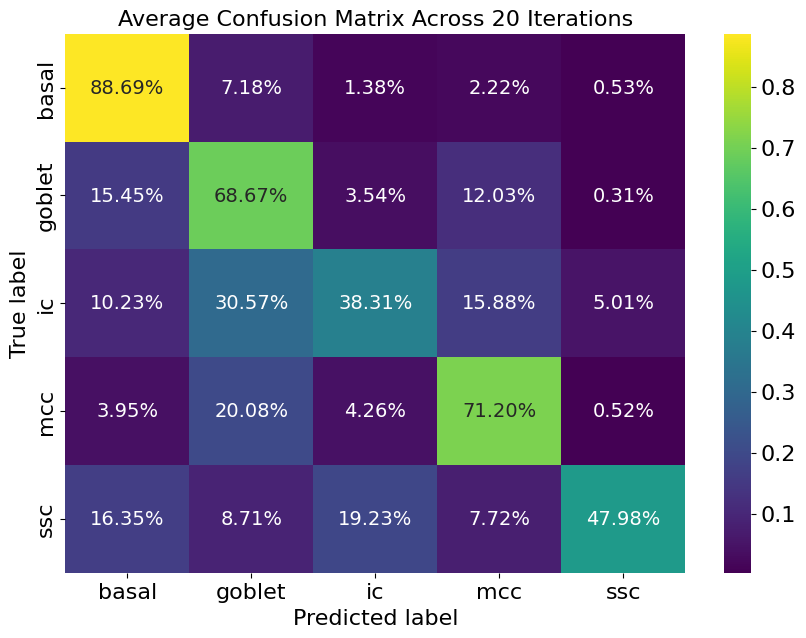

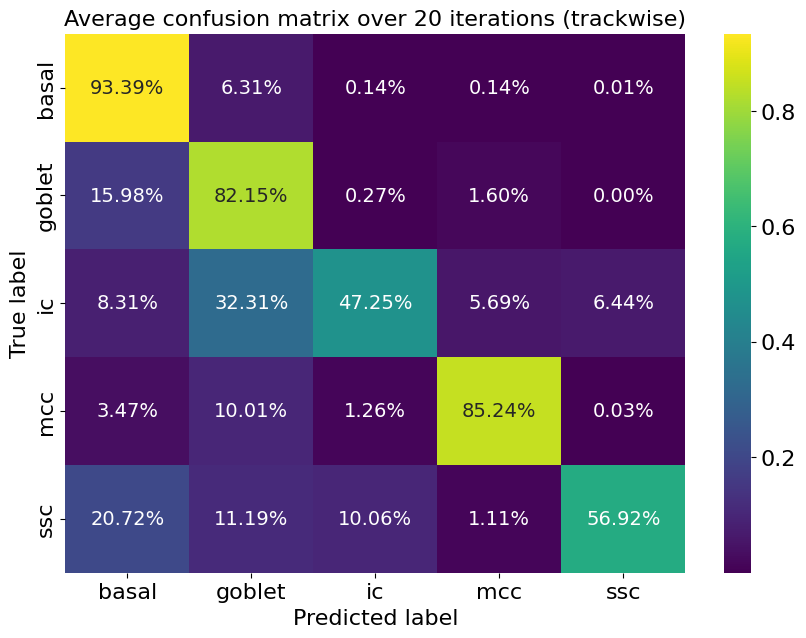

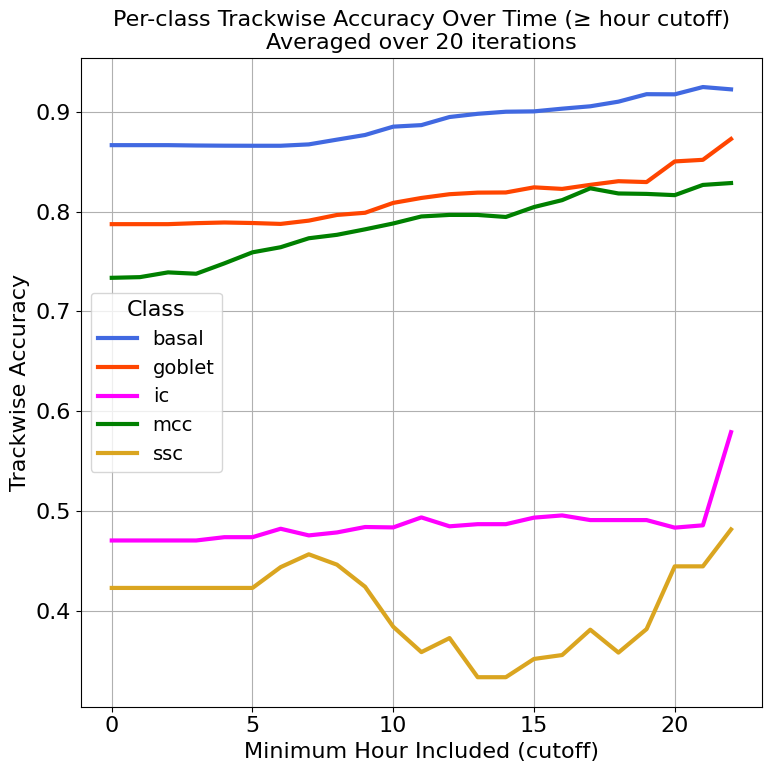

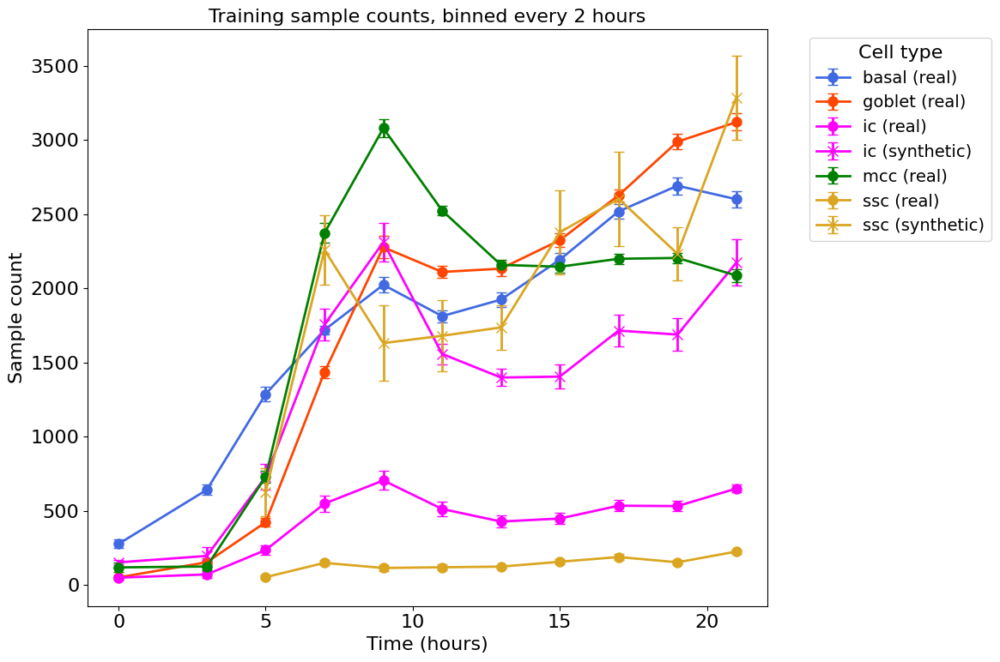

In [247]:
colors_dict = {'basal' : 'royalblue', 'goblet' : 'orangered', 'ic' : 'magenta', 'mcc' : 'green', 'ssc' : 'goldenrod'}

# Metrics summary
metrics_df = pd.DataFrame(all_metrics)
mean_metrics = metrics_df.mean()
std_metrics = metrics_df.std()


# Average confusion matrix (normalized)
avg_cm = np.mean(all_conf_matrices, axis=0)
avg_cm_normalized = avg_cm.astype('float') / avg_cm.sum(axis=1)[:, np.newaxis]

# Step 1: Sum all confusion matrices
summed_cm = np.sum(all_trackwise_confusion_matrices, axis=0)

# Step 2: Normalize by row (i.e., true class) to get proportions
avg_trackwise_cm = summed_cm.astype(float) / summed_cm.sum(axis=1, keepdims=True)


# Plot averaged confusion matrix
plt.figure(figsize=(10, 7))
sns.heatmap(avg_cm_normalized, annot=True, fmt='.2%', cmap='viridis',
            xticklabels=class_labels, yticklabels=class_labels, annot_kws={"size": 14})
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title(f'Average Confusion Matrix Across {n_iterations} Iterations')
plt.savefig("iteration_plots_10_04/newest_model_confusion_avg.pdf")
plt.show()


#Plot trackwise average confusion matrix

plt.figure(figsize=(10, 7))
sns.heatmap(
    avg_trackwise_cm,
    annot=True,
    fmt='.2%',
    cmap='viridis',
    xticklabels=class_labels,
    yticklabels=class_labels,
    annot_kws={"size": 14}
)
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title(f'Average confusion matrix over {n_iterations} iterations (trackwise)')
plt.savefig("iteration_plots_10_04/newest_model_trackwise_confusion_avg.pdf")
plt.show()

# Key: hour_cutoff -> list of CMs (np.array shape: [num_classes, num_classes])
cm_time_aggregate = defaultdict(list)

for trackwise_cms_dict in all_trackwise_cms_by_time:
    for timepoint, cm in trackwise_cms_dict.items():
        cm_time_aggregate[timepoint].append(cm)

timewise_class_accuracy = []

for timepoint, cm_list in cm_time_aggregate.items():
    summed_cm = np.sum(cm_list, axis=0)  # Sum over iterations
    row_sums = summed_cm.sum(axis=1, keepdims=True)
    
    with np.errstate(divide='ignore', invalid='ignore'):
        norm_cm = np.divide(summed_cm, row_sums)  # Normalize rows
        norm_cm[np.isnan(norm_cm)] = 0  # Handle divide-by-zero safely

    for i, cls in enumerate(class_labels):
        acc = norm_cm[i, i]  # diagonal = correct predictions
        timewise_class_accuracy.append({
            "Timepoint": timepoint,
            "Class": cls,
            "Accuracy": acc
        })

accuracy_df = pd.DataFrame(timewise_class_accuracy)

accuracy_df["Timepoint"] = accuracy_df["Timepoint"].astype(float)
accuracy_df = accuracy_df.sort_values("Timepoint", ascending=True)

plt.figure(figsize=(8, 8))

for cls in class_labels:
    plot_data = accuracy_df[accuracy_df["Class"] == cls].sort_values("Timepoint")
    plt.plot(plot_data["Timepoint"], plot_data["Accuracy"], label=cls, color=colors_dict[cls], linewidth=3)

plt.xlabel("Minimum Hour Included (cutoff)")
plt.ylabel("Trackwise Accuracy")
plt.title(f"Per-class Trackwise Accuracy Over Time (≥ hour cutoff)\nAveraged over {n_iterations} iterations")
plt.legend(title="Class")
plt.grid(True)
plt.tight_layout()
#plt.savefig('iteration_plots_10_04/trackwise_accuracy_over_time.pdf')
plt.show()

# Combine all summaries
combined_summary_df = pd.concat(all_summary_dfs)

combined_summary_df["t_hours_bin_center"] = combined_summary_df["t_hours_bin"].apply(lambda x: x.mid)

combined_summary_df = combined_summary_df[combined_summary_df["count"] > 0]

# Aggregate mean and std by bin, class, and source
agg_summary = combined_summary_df.groupby(
    ['t_hours_bin_center', 'cell_type', 'source']
)['count'].agg(['mean', 'std']).reset_index()

agg_summary = agg_summary[pd.notna(agg_summary['mean'])]  # Remove NaN bin centers
agg_summary = agg_summary[agg_summary['t_hours_bin_center'].astype(int) < 22]  # Remove bins with zero counts


colors_dict = {
    'basal': 'royalblue',
    'goblet': 'orangered',
    'ic': 'magenta',
    'mcc': 'green',
    'ssc': 'goldenrod'
}

plt.figure(figsize=(12, 8))

for cell_type in class_labels:
    for source, marker in [('real', 'o'), ('synthetic', 'x')]:
        df_plot = agg_summary[(agg_summary['cell_type'] == cell_type) & (agg_summary['source'] == source)]

        if df_plot.empty:
            continue  # skip combinations with no data

        # Get numeric bin centers for x-axis
        x_vals = df_plot["t_hours_bin_center"].astype(int)
        y_vals = df_plot["mean"]
        y_err = df_plot["std"]

        plt.errorbar(
            x_vals,
            y_vals,
            yerr=y_err,
            fmt=marker + '-',  # line with marker
            capsize=4,
            color=colors_dict[cell_type],
            label=f"{cell_type} ({source})",
            markersize=8,
            linewidth=2
        )

plt.title("Training sample counts, binned every 2 hours")
plt.xlabel("Time (hours)")
plt.ylabel("Sample count")
plt.legend(title="Cell type", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(False)
plt.tight_layout()
plt.savefig('iteration_plots_10_04/training_sample_counts_binned.pdf')
plt.show()




In [226]:
combined_summary_df

,t_hours_bin,cell_type,source,count
0,"(-0.001, 2.0]",basal,real,260
1,"(-0.001, 2.0]",basal,synthetic,0
2,"(-0.001, 2.0]",goblet,real,39
3,"(-0.001, 2.0]",goblet,synthetic,0
4,"(-0.001, 2.0]",ic,real,49
...,...,...,...,...
115,"(22.0, 24.0]",ic,synthetic,81
116,"(22.0, 24.0]",mcc,real,176
117,"(22.0, 24.0]",mcc,synthetic,0
118,"(22.0, 24.0]",ssc,real,17
